In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install xgboost
!pip install shap


     |████████████████████████████████| 358kB 5.3MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491620 sha256=f461afcb7b2426bfdf1513679b998cac00b9313d1e9a68b01af1a81dd989f1c3
  Stored in directory: /root/.cache/pip/wheels/15/27/f5/a8ab9da52fd159aae6477b5ede6eaaec69fd130fa0fa59f283
Successfully built shap


In [3]:
import numpy as np
import pandas as pd
import shap
from sklearn.metrics import classification_report
from scipy import signal
from sklearn.model_selection import train_test_split


In [4]:


class EEG:
    def __init__(self, participant):
        self.int = {}
        self.delta = {}
        self.theta = {}
        self.alpha = {}
        self.beta = {}
        self.gamma = {}
    #    base= "/content/drive/MyDrive/Innopolis Phd/lab_computer/phd file/Data sets/"
        for I in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]:
            self.int[I] = np.loadtxt('/content/drive/MyDrive/Innopolis Phd/lab_computer/phd file/Data sets/Participant '+str(participant)+'/Cubes for spectra/Backgr_int_'+str(I)+'_type_0.4.dat')
            delta_signal = np.empty(self.int[I].shape)
            theta_signal =  np.empty(self.int[I].shape)
            alpha_signal = np.empty(self.int[I].shape)
            beta_signal = np.empty(self.int[I].shape)
            gamma_signal = np.empty(self.int[I].shape)
            for c in range(self.int[I].shape[1]):
                delta_signal[:,c], theta_signal[:,c],alpha_signal[:, c], beta_signal[:, c],gamma_signal[:,c] = self.fir_filtering(I, c)
            self.delta[I] = delta_signal
            self.theta[I] = theta_signal
            self.alpha[I] = alpha_signal
            self.beta[I] = beta_signal 
            self.gamma[I] = gamma_signal
    def fir_filtering(self, I, c):
        filter_delta = signal.firwin(400, [1.0, 4.0], pass_zero=False, fs=250)
        filter_theta = signal.firwin(400, [5.0, 8.0], pass_zero=False, fs=250)
        filter_alpha = signal.firwin(400, [8.0, 12.0], pass_zero=False, fs=250)
        filter_beta = signal.firwin(400, [13.0, 30.0], pass_zero=False, fs=250)
        filter_gamma = signal.firwin(400, [31.0, 45.0], pass_zero=False, fs=250)
        res_delta = signal.convolve(self.int[I][:, c], filter_delta, mode='same')
        res_theta = signal.convolve(self.int[I][:, c], filter_theta, mode='same')
        res_alpha = signal.convolve(self.int[I][:, c], filter_alpha, mode='same')
        res_beta = signal.convolve(self.int[I][:, c], filter_beta, mode='same')
        res_gamma = signal.convolve(self.int[I][:, c], filter_gamma, mode='same')
        return res_delta,res_theta, res_alpha,res_beta,res_gamma 

In [5]:
Intencity = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]



def convart_sin_fiq(fiq):
  if fiq == 'delta':
    return 1
  elif fiq == 'theta':
    return 2
  elif fiq == 'alpha':
    return 3
  elif fiq =='beta': 
    return 4
  elif fiq == 'gamma':
    return 5

def createdataframe(user):
    global Intencity
    tem_signal = []
    eeg_person = EEG(user)
    for signal_fiq in ['delta','theta','alpha','beta','gamma']:
      for i in Intencity:
          for ch in range(0,31):
            tem = [ch,convart_sin_fiq(signal_fiq),i]
            S = 'tem_signal.append(np.append(eeg_person.'+signal_fiq+'.get(i)[:,ch][0:15000],tem))'
            eval(S)
    
           
    tem_dataframe = pd.DataFrame(tem_signal)

    colunm = [] 

    for col in range(0,15000):
      S = 'Time'+str(col)
      colunm.append(S)

    colunm.append("channel")
    colunm.append("band")
    colunm.append("Intencity")   
    tem_dataframe.columns  = colunm 
    return tem_dataframe

leftchannel = [1,3,5,7,9,11,13,15,17,19,20,21,23,26,27,28] 
rightchannel = [0,2,4,6,8,10,12,14,16,18,20,24,25,29,30]

def createdataframeleft(user):
    global Intencity
    tem_signal = []
    eeg_person = EEG(user)
    for signal_fiq in ['delta','theta','alpha','beta','gamma']:
      for i in Intencity:
          for ch in leftchannel:
            tem = [ch,convart_sin_fiq(signal_fiq),i]
            S = 'tem_signal.append(np.append(eeg_person.'+signal_fiq+'.get(i)[:,ch][0:15000],tem))'
            eval(S)
    
           
    tem_dataframe = pd.DataFrame(tem_signal)

    colunm = [] 

    for col in range(0,15000):
      S = 'Time'+str(col)
      colunm.append(S)

    colunm.append("channel")
    colunm.append("band")
    colunm.append("Intencity")   
    tem_dataframe.columns  = colunm 
    return tem_dataframe

def createdataframeright(user):
    global Intencity
    tem_signal = []
    eeg_person = EEG(user)
    for signal_fiq in ['delta','theta','alpha','beta','gamma']:
      for i in Intencity:
          for ch in rightchannel:
            tem = [ch,convart_sin_fiq(signal_fiq),i]
            S = 'tem_signal.append(np.append(eeg_person.'+signal_fiq+'.get(i)[:,ch][0:15000],tem))'
            eval(S)
    
           
    tem_dataframe = pd.DataFrame(tem_signal)

    colunm = [] 

    for col in range(0,15000):
      S = 'Time'+str(col)
      colunm.append(S)

    colunm.append("channel")
    colunm.append("band")
    colunm.append("Intencity")   
    tem_dataframe.columns  = colunm 
    return tem_dataframe

In [6]:
from sklearn.model_selection import train_test_split 
import xgboost as xgb
from xgboost import XGBClassifier

def xgboostmodel(df_xgboost):
  df_new = df_xgboost.copy()
  col = "Intencity"
  y = df_new[col]
  X = df_new.drop(col,axis=1)
  data_dmatrix = xgb.DMatrix(data=X,label=y)
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
  model = XGBClassifier()
  model.fit(X_train, y_train)
  y_pred = model.predict(X_test)
  clf_report = classification_report(y_test*10,y_pred*10)
  return clf_report , model , X_train, X_test 


In [7]:
def shapplot(model,X_train,X_test):
  shap.initjs()
  explainer = shap.TreeExplainer(model)
  shap_values = explainer.shap_values(X_train)
  print("Sumamry Plot")
  shap.summary_plot(shap_values, X_test)
  print("Best time series vs intencity")
  for i in range(10):
    shap.dependence_plot("rank(1)", shap_values[i], X_train,interaction_index="channel",title= "For Intencity " + str(i+1))
  print("Band vs Channel")
  for i in range(10):
    shap.dependence_plot("band", shap_values[i], X_train,interaction_index="channel",title= "For Band vs Channel " + str(i+1)) 
  print("channel vs band")
  for i in range(10):
    shap.dependence_plot("channel", shap_values[i], X_train,interaction_index="band",title= "For Channel vs Band" + str(i+1)) 
  return True


       Time0      Time1      Time2  ...  channel  band  Intencity
0   7.772971  30.677260  53.414131  ...      0.0   1.0        0.1
1   3.552206   6.295904   9.036222  ...      1.0   1.0        0.1
2  15.108177  25.548918  35.963586  ...      2.0   1.0        0.1
3  29.873366  38.394229  46.917213  ...      3.0   1.0        0.1
4   8.950041  12.746146  16.674944  ...      4.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       0.93      1.00      0.96        25
         2.0       0.98      0.95      0.97        44
         3.0       0.95      0.91      0.93        23
         4.0       0.92      1.00      0.96        36
         5.0       0.92      0.89      0.91        27
         6.0       0.94      0.91      0.93        34
         7.0       0.84      1.00      0.92        27
         8.0       0.97      1.00      0.98        30
         9.0       0.97      0.89      0.93        36
        10.0       1.00      0.86    

Sumamry Plot


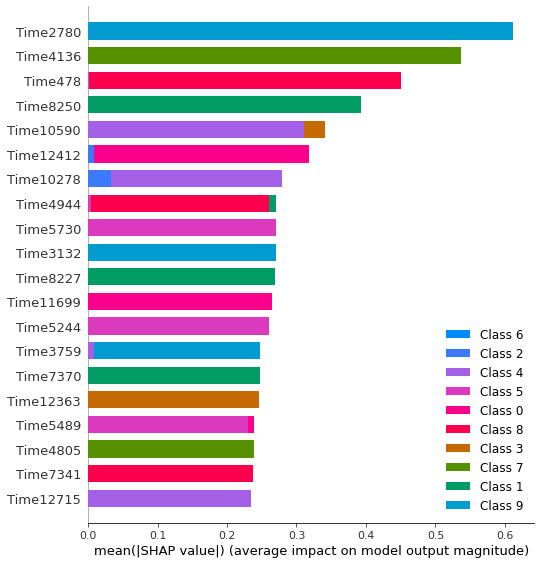

Best time series vs intencity


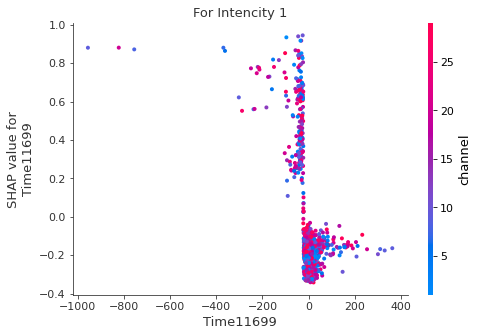

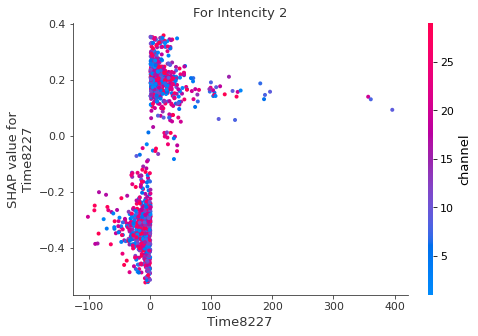

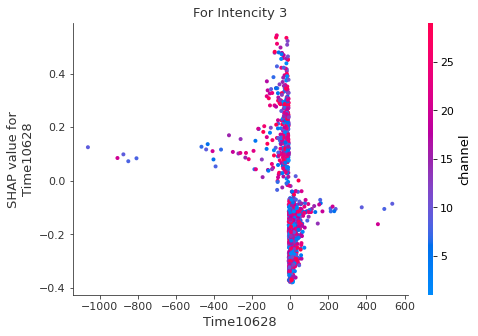

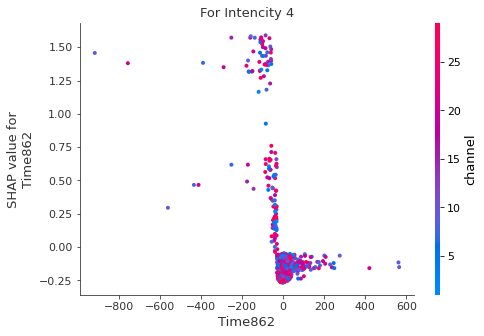

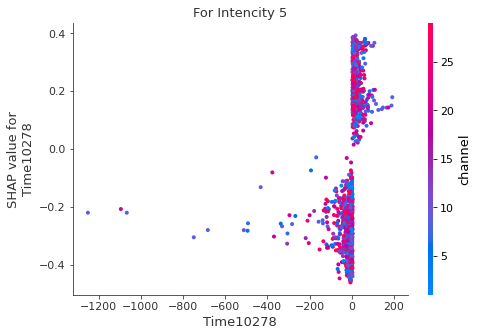

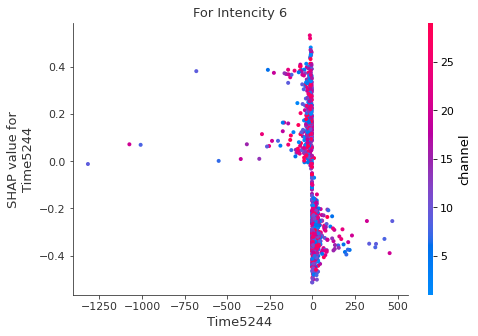

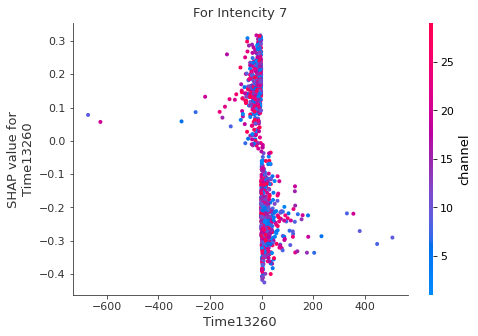

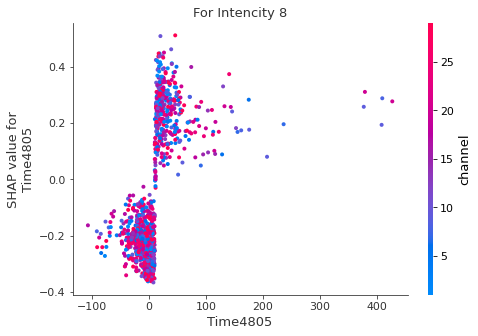

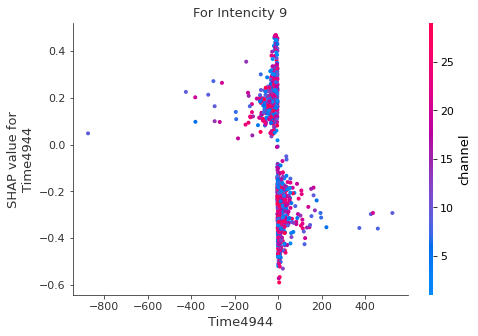

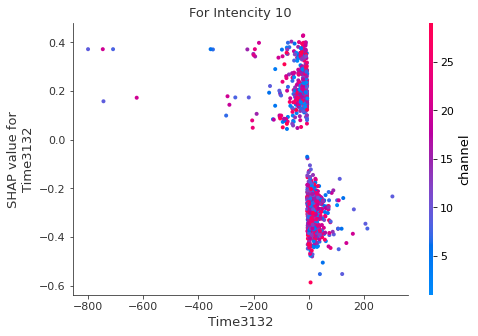

Band vs Channel


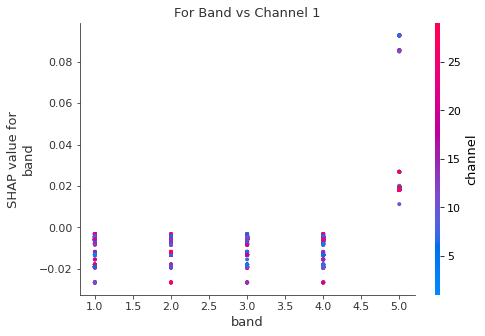

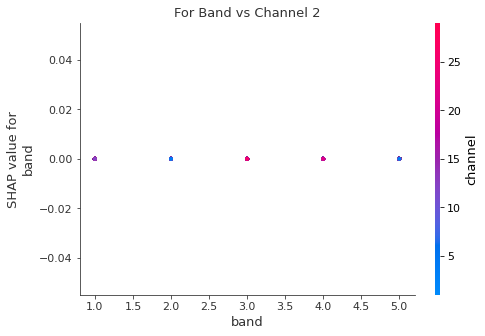

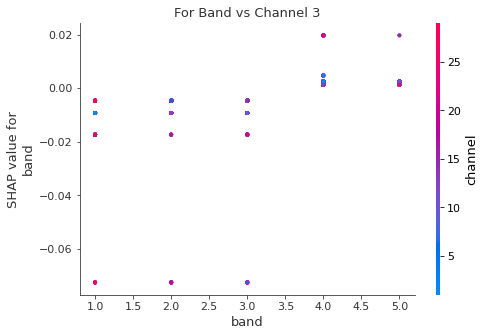

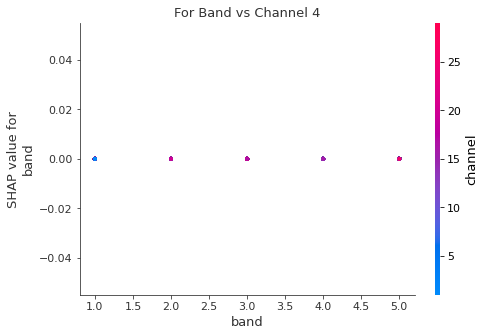

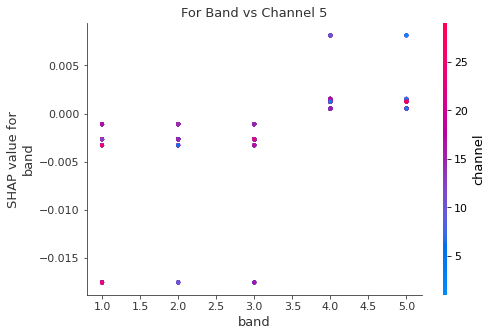

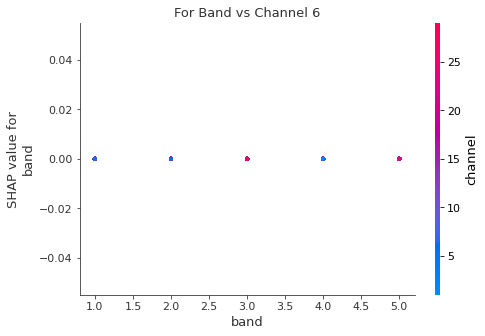

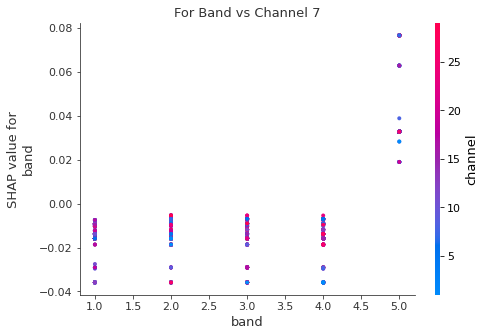

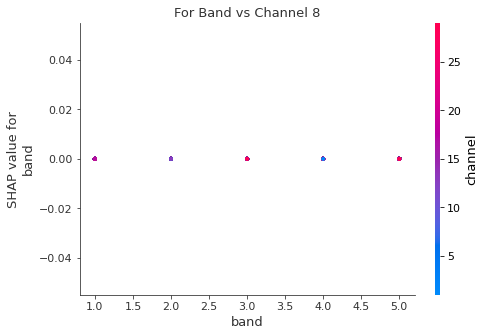

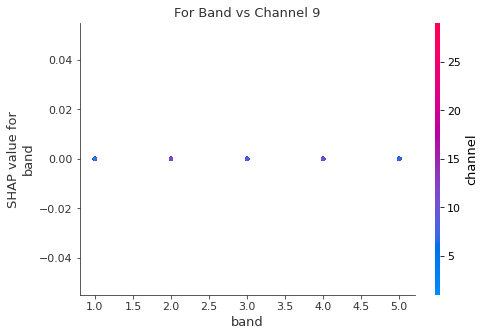

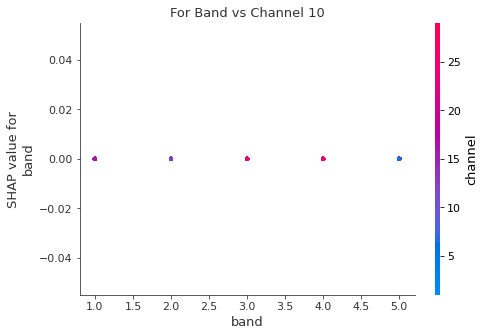

channel vs band


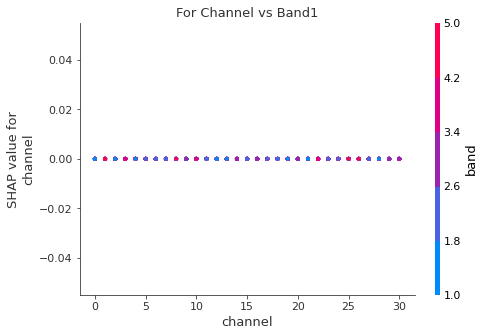

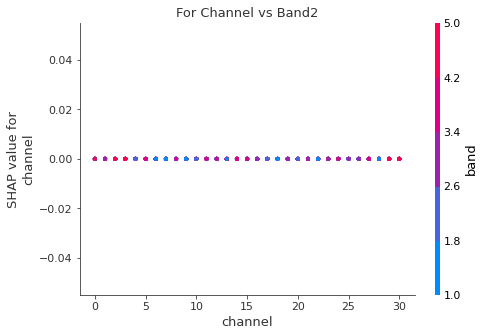

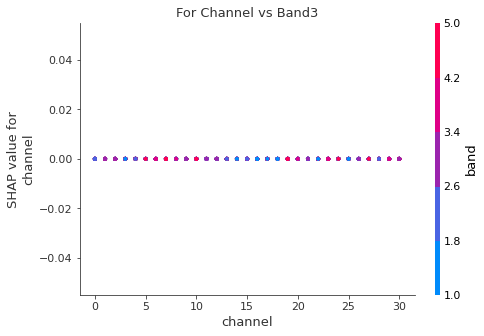

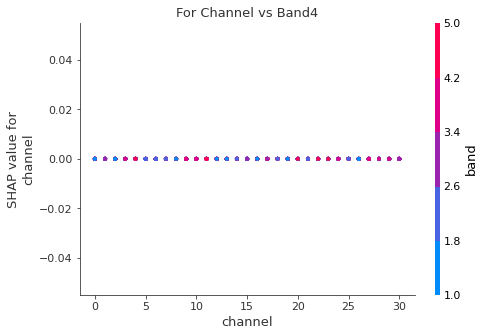

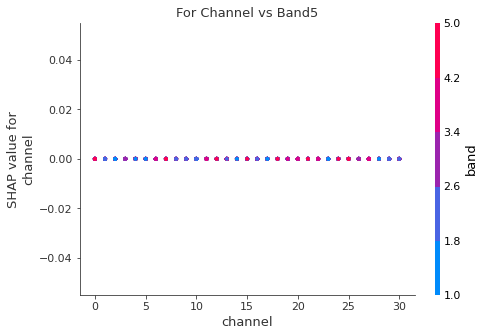

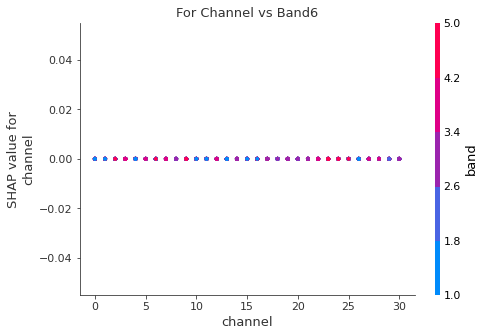

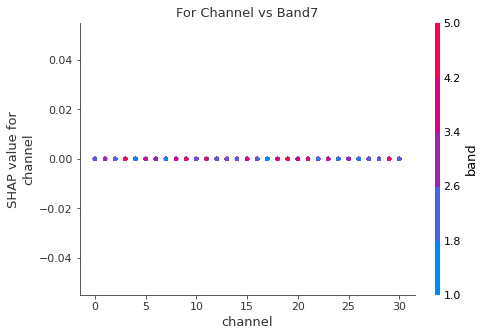

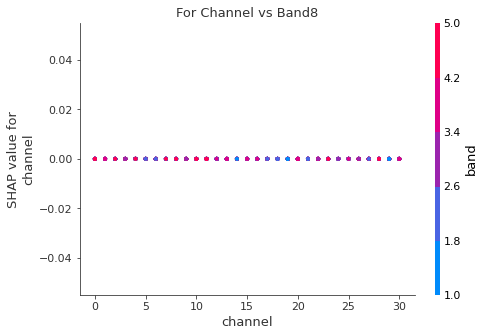

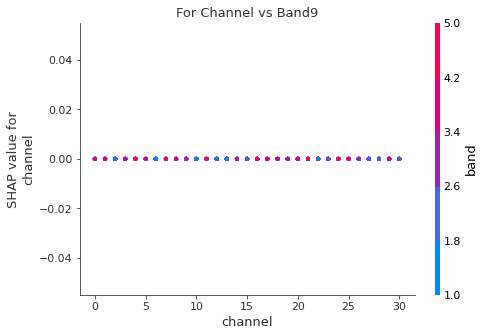

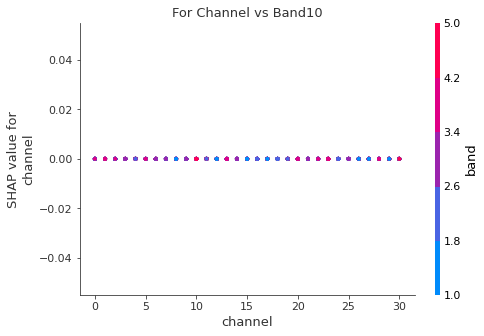

True

In [8]:
df= createdataframe(1) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

       Time0      Time1      Time2  ...  channel  band  Intencity
0 -14.184788 -14.964226 -15.713832  ...      0.0   1.0        0.1
1  -6.803749   1.853609  10.492998  ...      1.0   1.0        0.1
2   4.558751   7.102602   9.601087  ...      2.0   1.0        0.1
3  10.246386  16.739674  23.174124  ...      3.0   1.0        0.1
4  19.342232  22.430965  25.407664  ...      4.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       1.00      0.96      0.98        25
         2.0       1.00      1.00      1.00        44
         3.0       0.92      1.00      0.96        23
         4.0       0.97      1.00      0.99        36
         5.0       0.96      1.00      0.98        27
         6.0       1.00      0.94      0.97        34
         7.0       0.96      1.00      0.98        27
         8.0       1.00      0.97      0.98        30
         9.0       1.00      1.00      1.00        36
        10.0       1.00      0.96    

Sumamry Plot


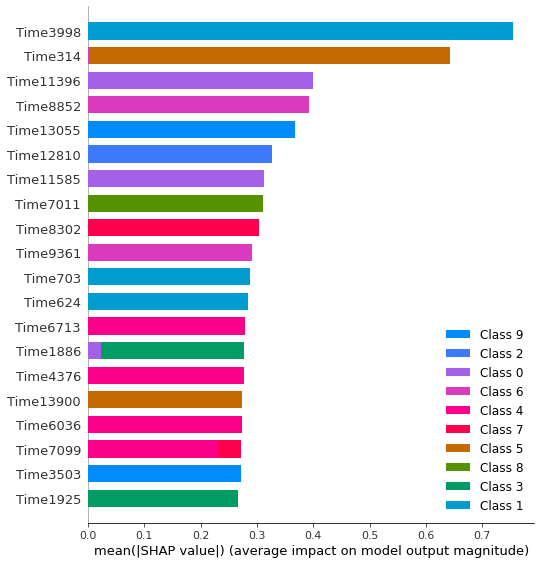

Best time series vs intencity


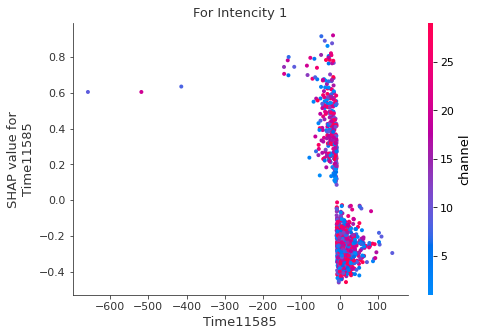

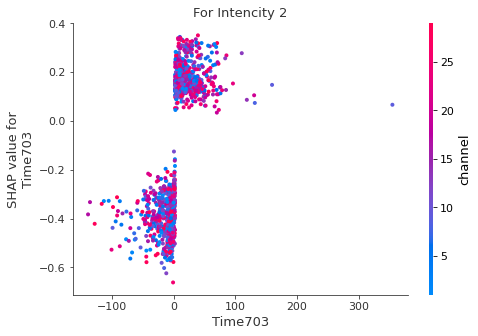

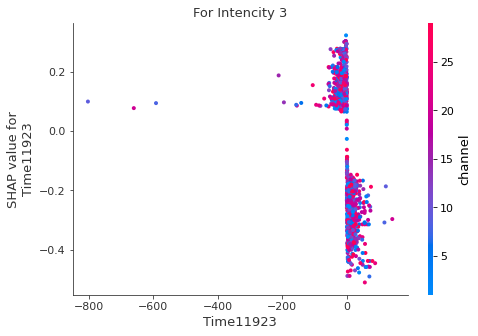

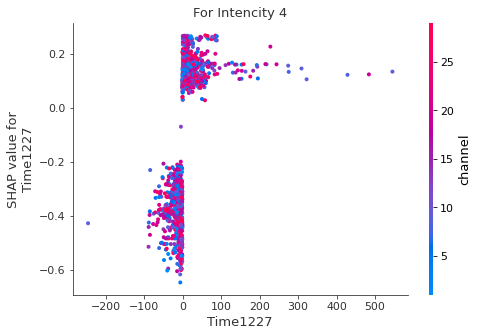

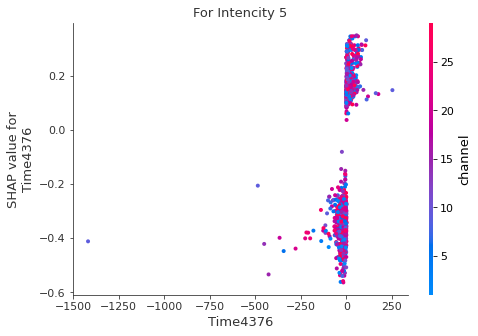

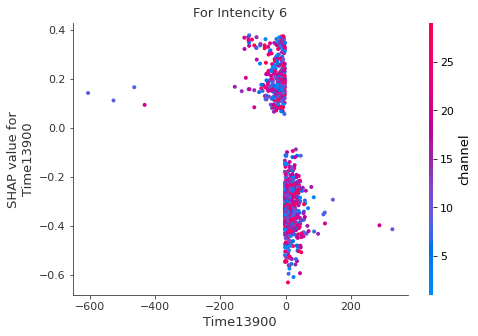

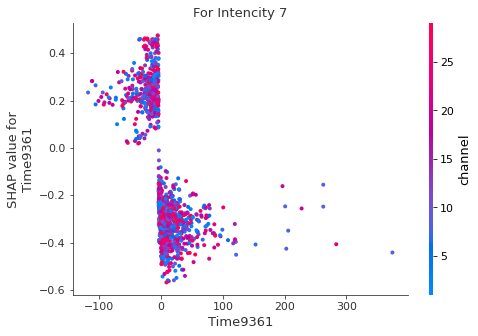

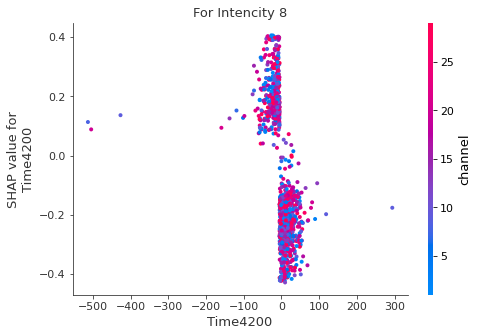

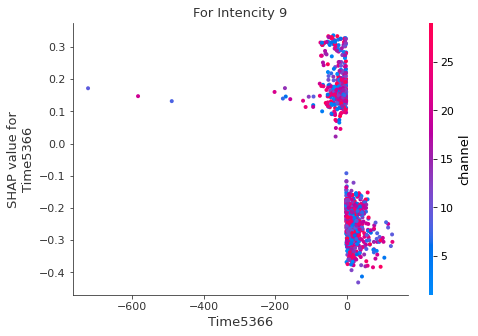

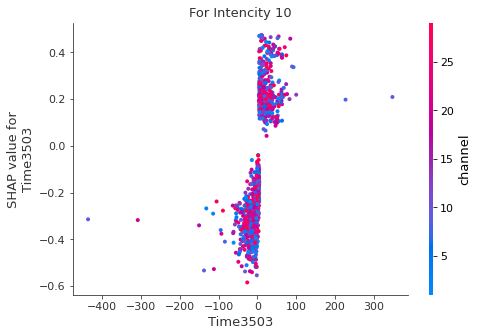

Band vs Channel


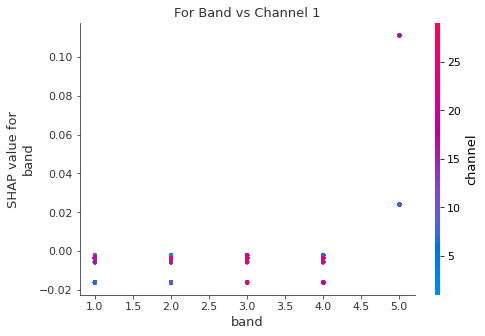

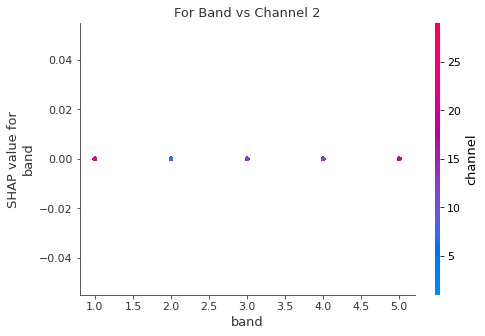

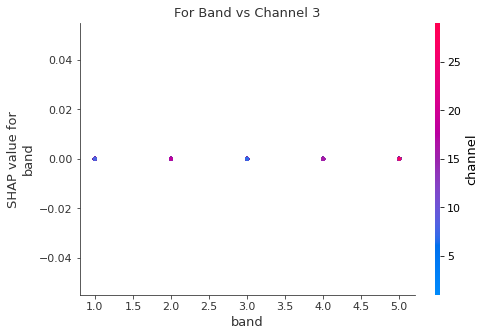

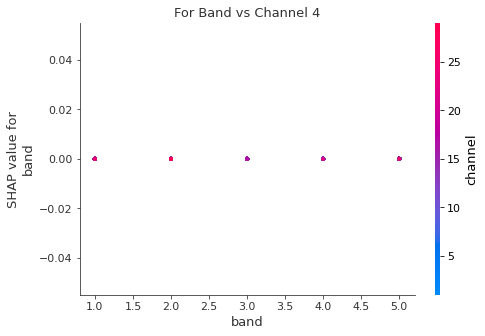

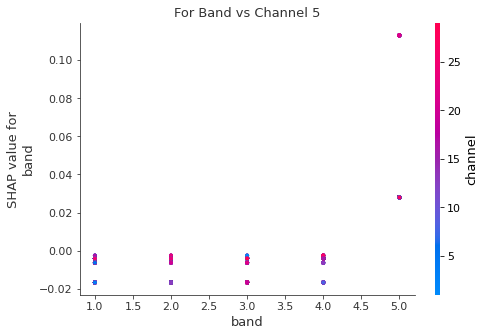

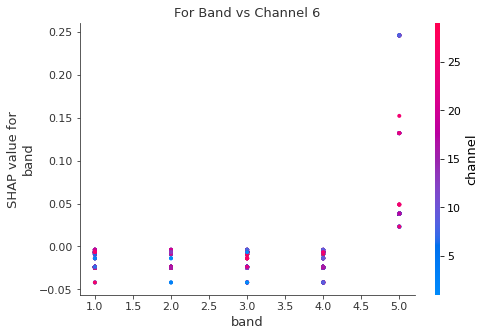

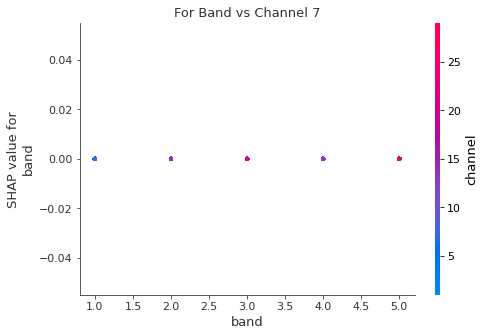

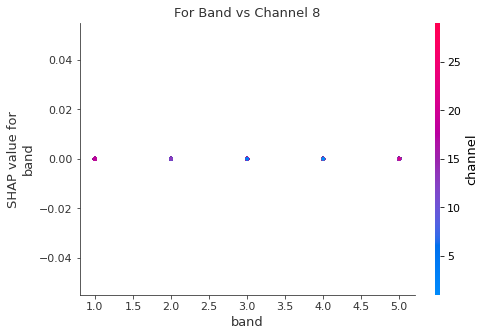

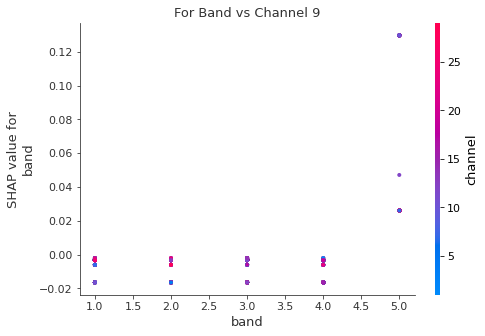

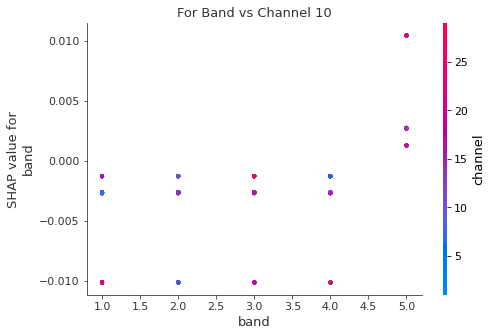

channel vs band


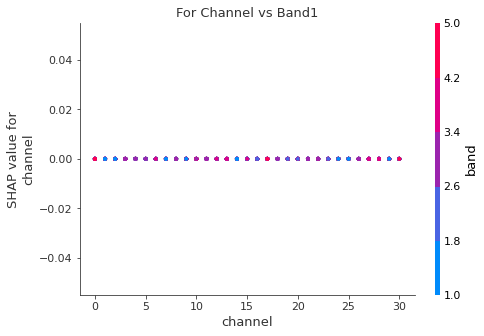

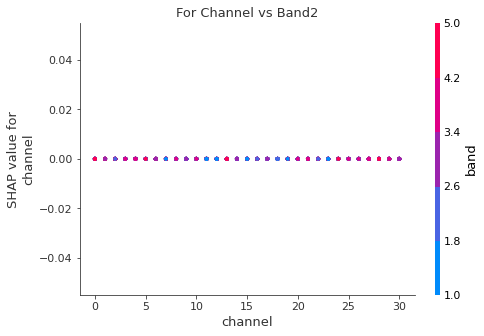

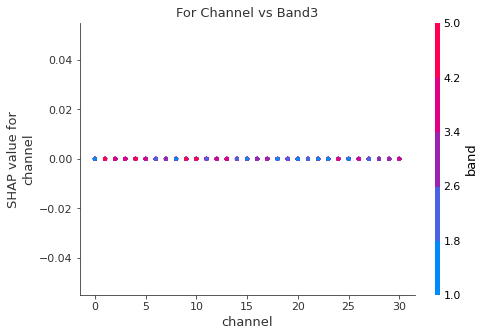

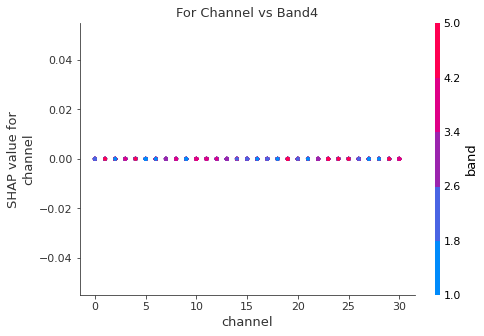

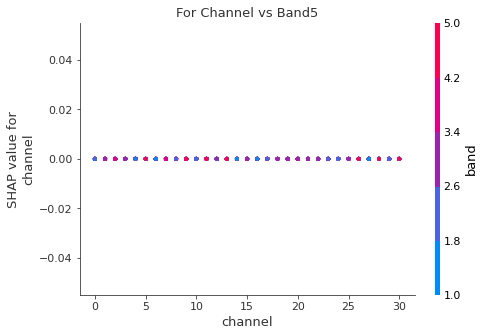

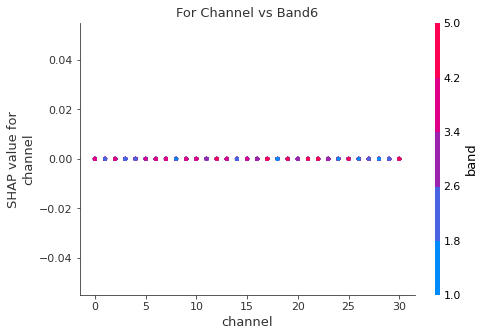

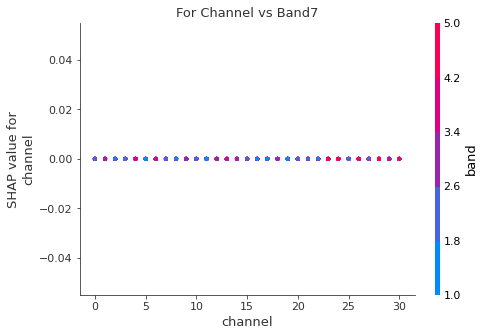

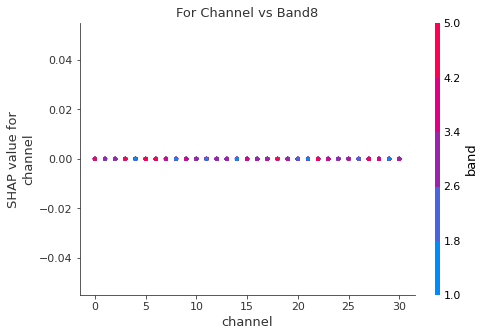

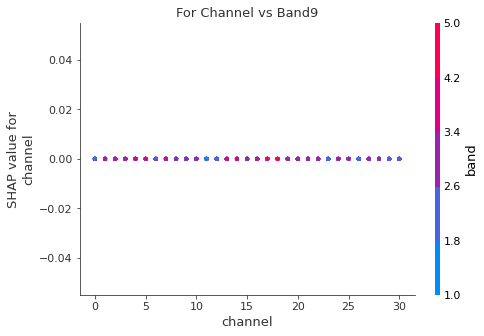

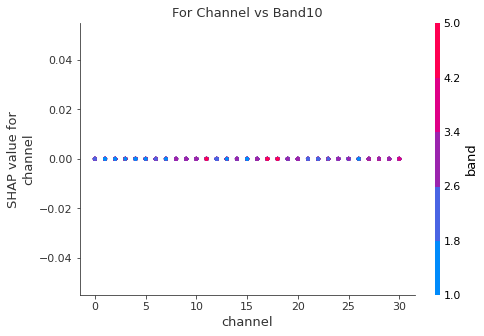

True

In [9]:
df= createdataframe(2) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

       Time0      Time1      Time2  ...  channel  band  Intencity
0  16.330305  14.134907  11.940875  ...      0.0   1.0        0.1
1  23.069194   9.877809  -3.327511  ...      1.0   1.0        0.1
2  11.403376  10.942666  10.488240  ...      2.0   1.0        0.1
3  30.401816  22.579755  14.714075  ...      3.0   1.0        0.1
4   2.890385  -1.318185  -5.508346  ...      4.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       0.88      0.92      0.90        25
         2.0       0.95      0.93      0.94        44
         3.0       0.88      0.96      0.92        23
         4.0       0.97      0.92      0.94        36
         5.0       0.93      0.93      0.93        27
         6.0       0.87      0.76      0.81        34
         7.0       0.87      0.96      0.91        27
         8.0       0.83      1.00      0.91        30
         9.0       0.94      0.89      0.91        36
        10.0       1.00      0.89    

Sumamry Plot


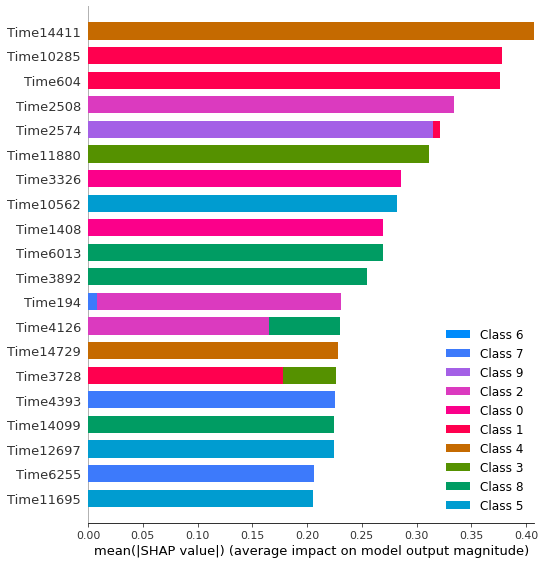

Best time series vs intencity


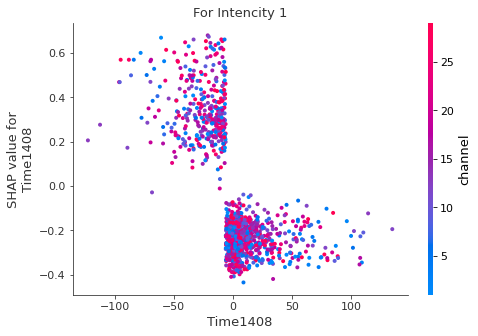

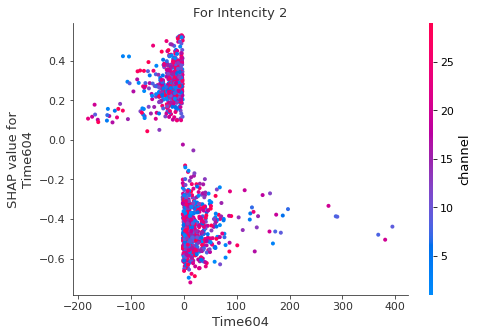

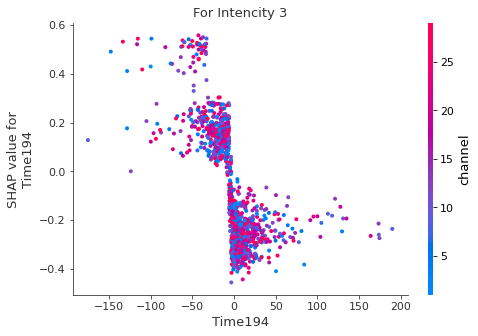

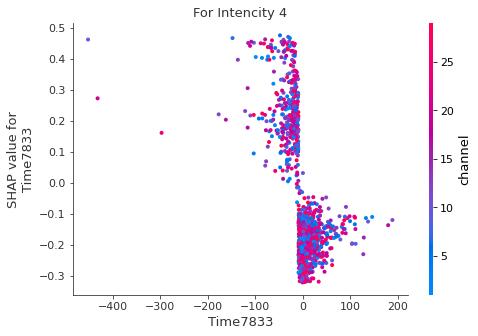

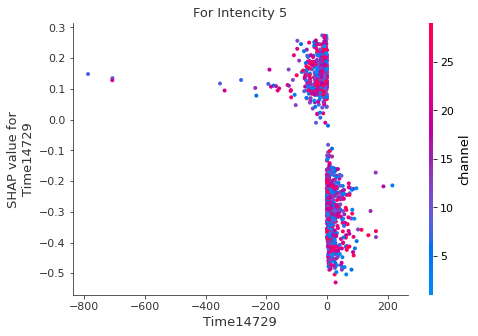

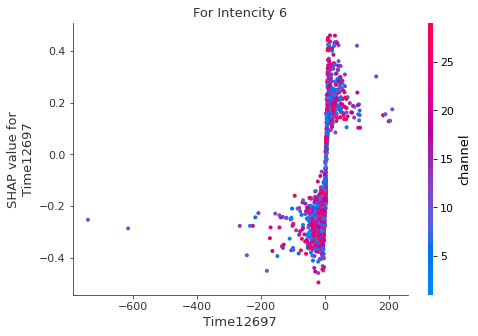

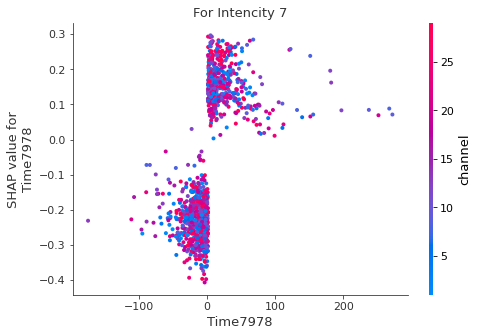

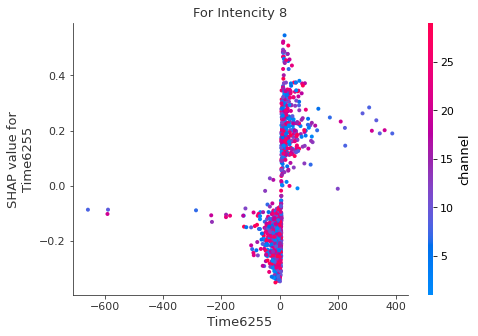

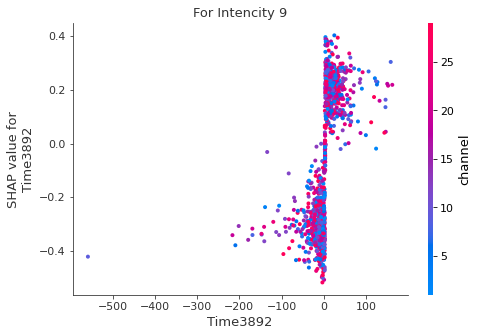

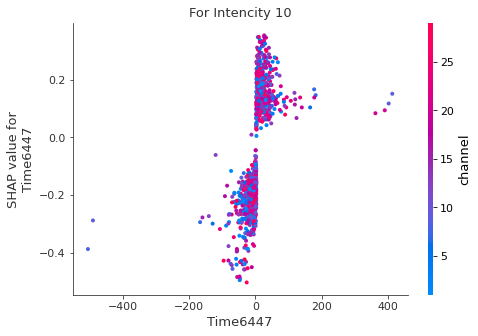

Band vs Channel


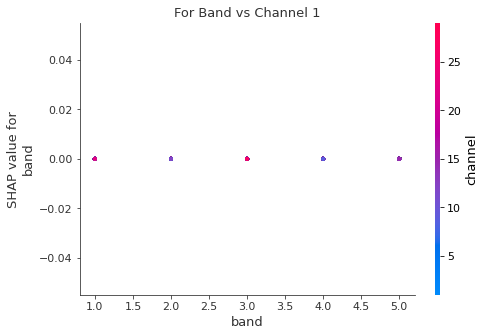

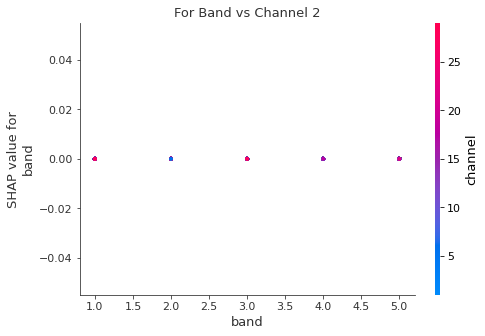

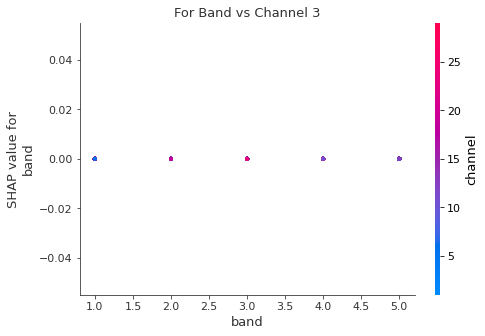

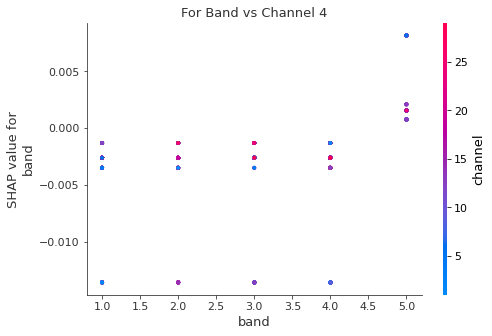

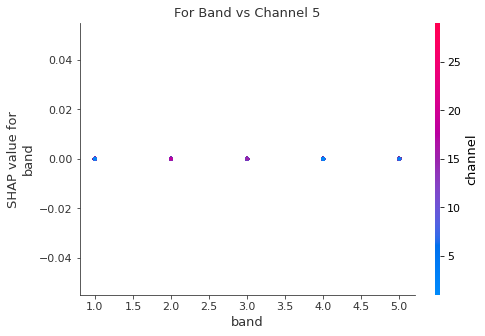

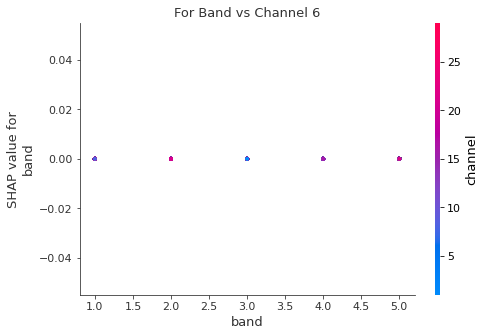

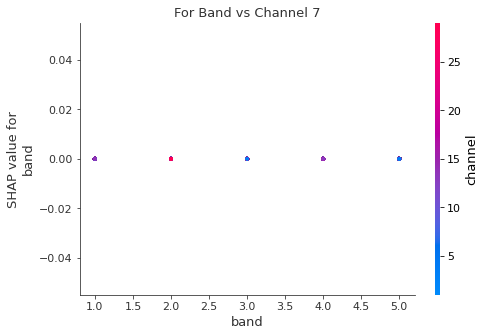

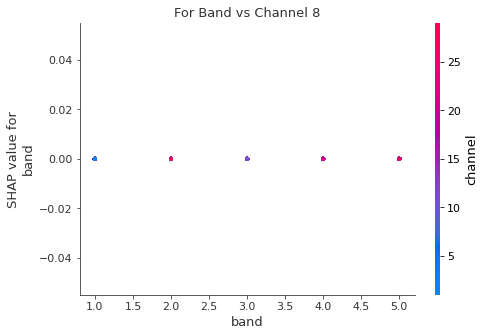

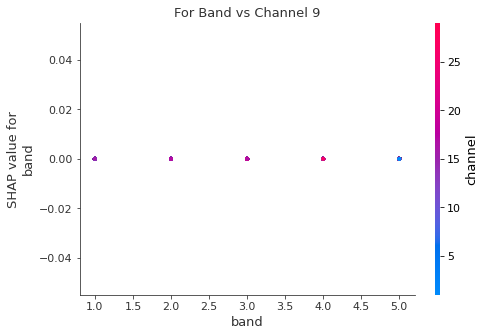

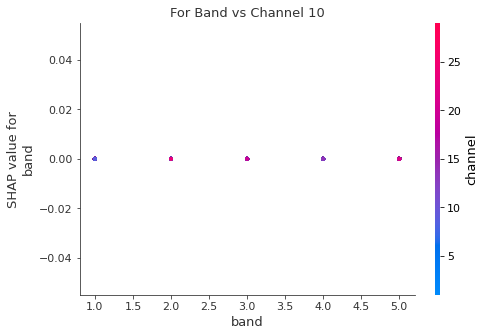

channel vs band


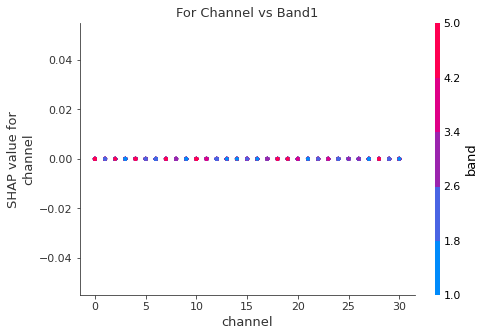

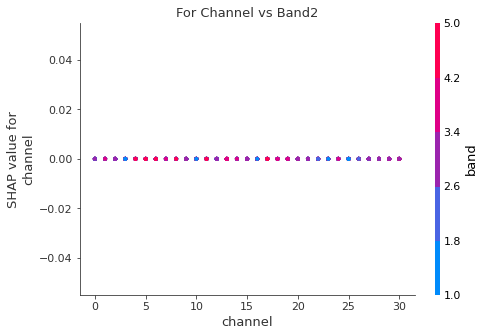

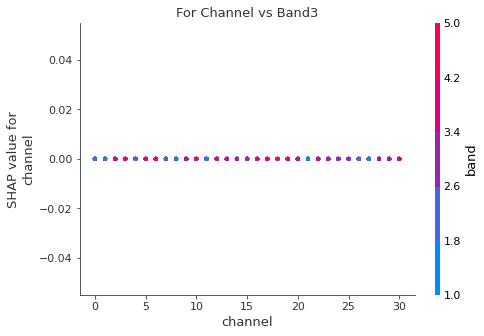

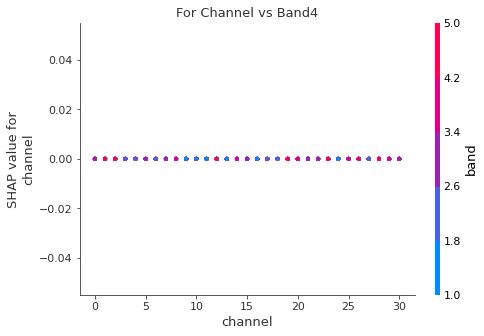

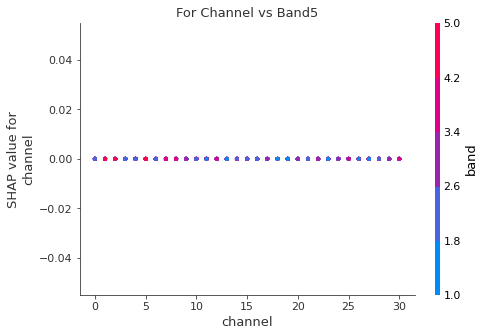

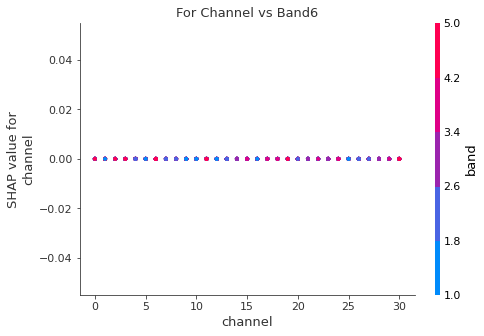

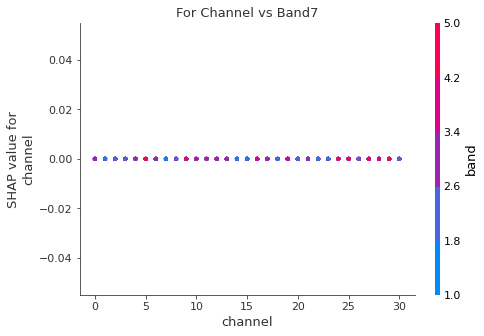

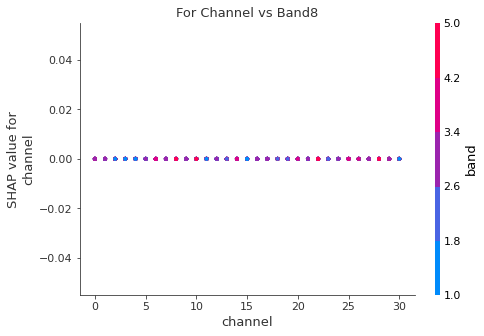

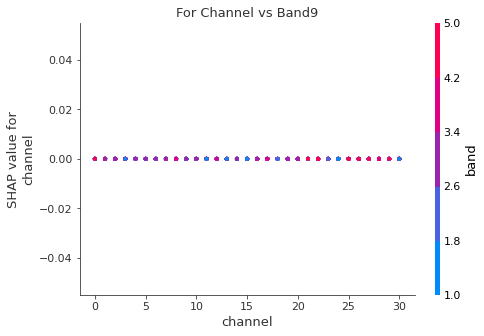

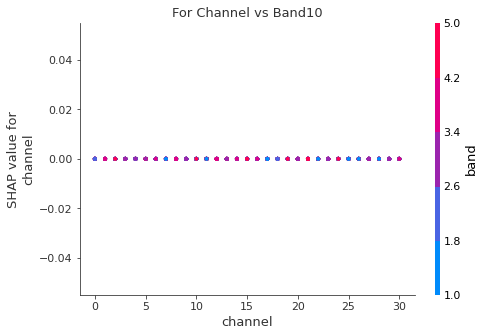

True

In [10]:
df= createdataframe(3) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

       Time0      Time1      Time2  ...  channel  band  Intencity
0  24.565854  26.167094  27.644614  ...      0.0   1.0        0.1
1   7.048502   4.953891   2.770400  ...      1.0   1.0        0.1
2   7.503558   6.744560   5.939841  ...      2.0   1.0        0.1
3  -4.711406 -12.956088 -21.256543  ...      3.0   1.0        0.1
4   2.250236   0.093364  -2.065258  ...      4.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       1.00      0.96      0.98        25
         2.0       1.00      0.98      0.99        44
         3.0       0.95      0.91      0.93        23
         4.0       0.92      1.00      0.96        36
         5.0       0.96      1.00      0.98        27
         6.0       0.97      0.91      0.94        34
         7.0       0.96      1.00      0.98        27
         8.0       0.94      1.00      0.97        30
         9.0       0.94      0.92      0.93        36
        10.0       0.96      0.93    

Sumamry Plot


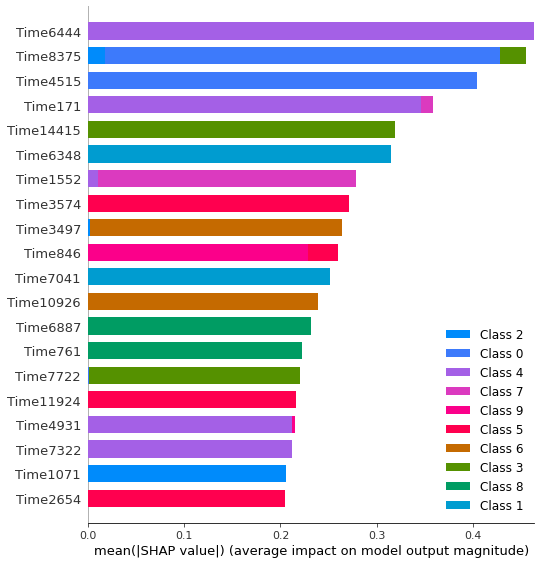

Best time series vs intencity


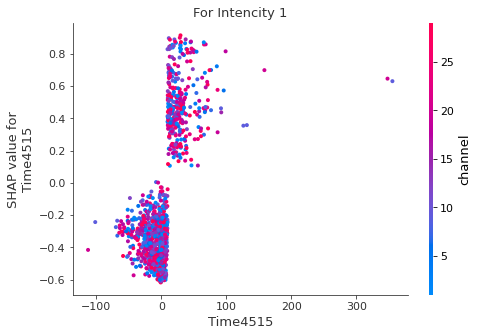

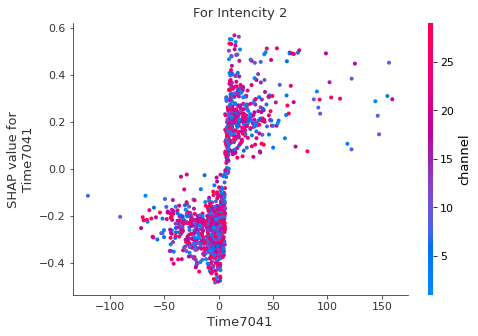

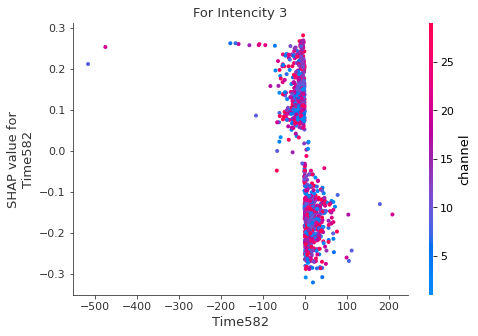

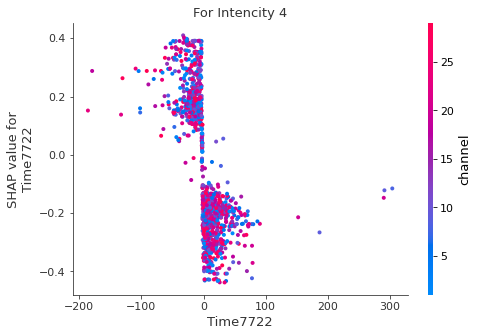

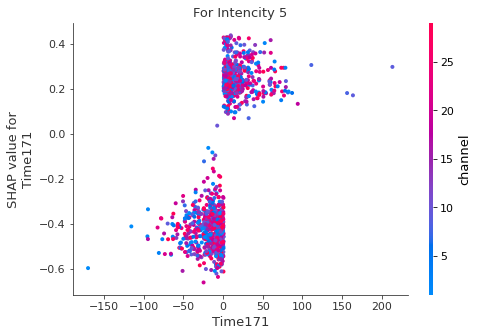

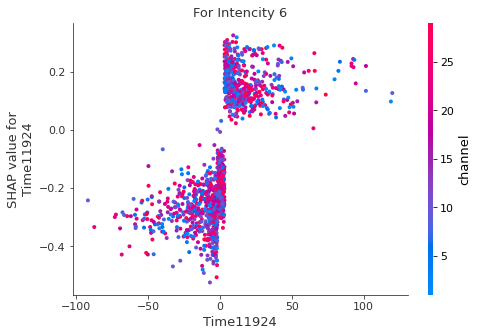

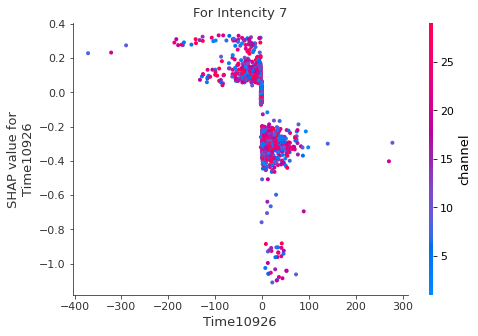

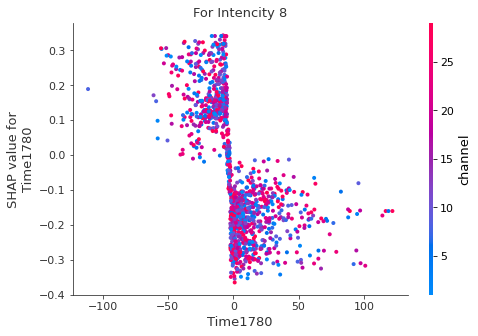

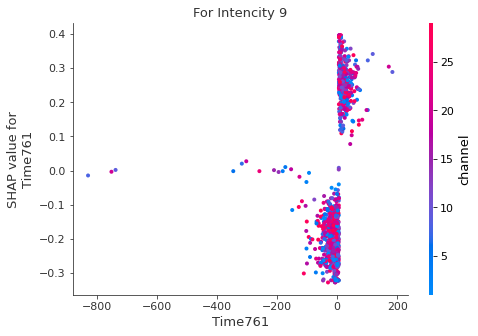

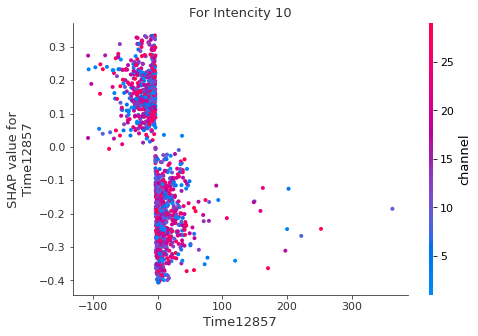

Band vs Channel


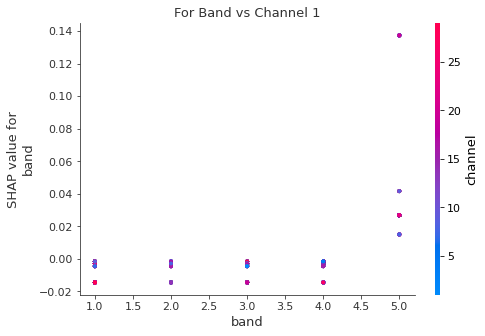

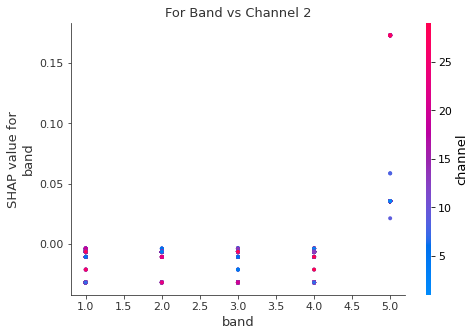

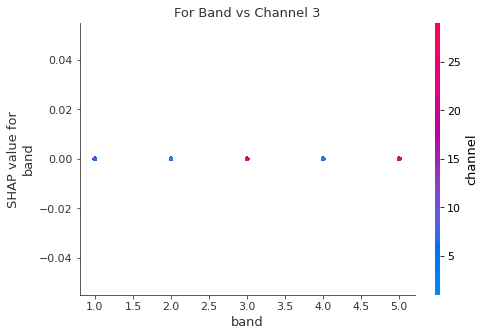

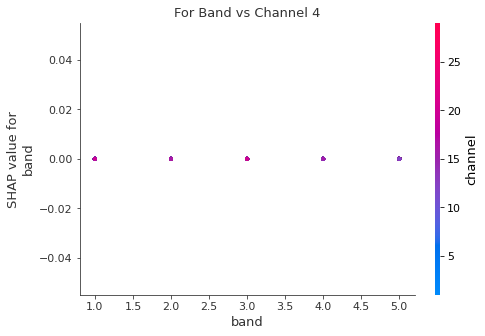

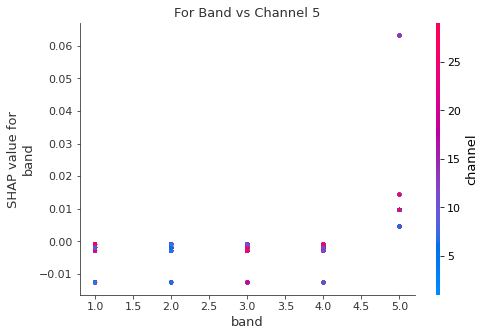

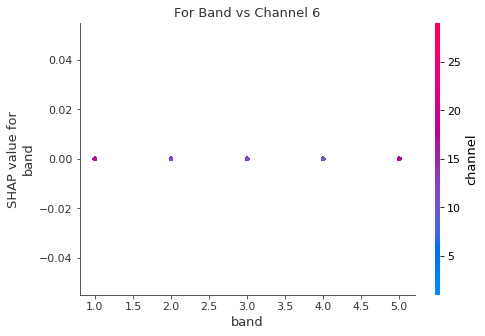

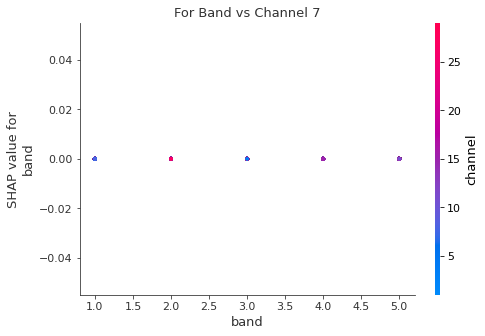

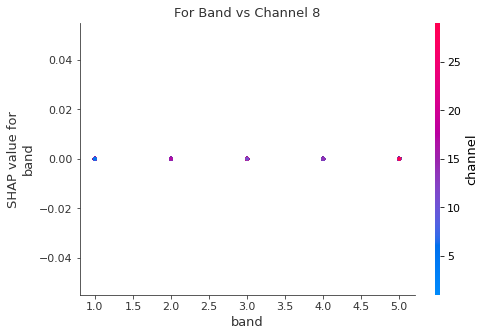

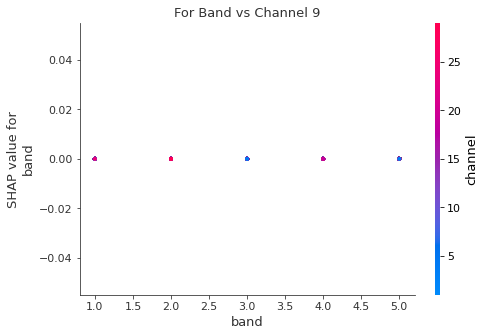

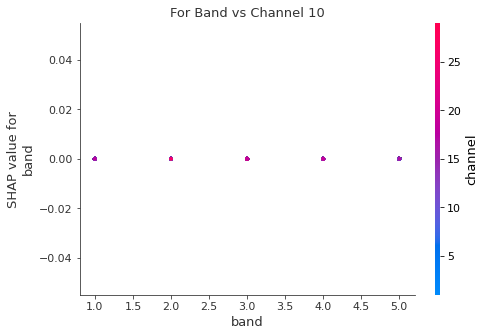

channel vs band


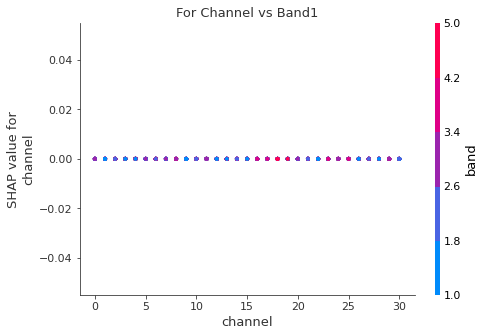

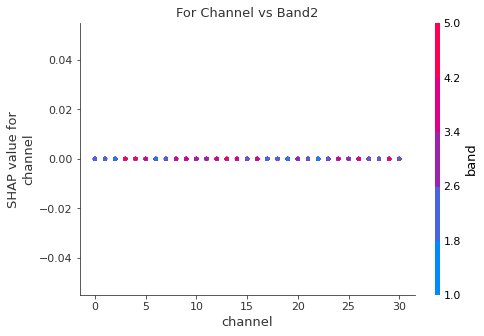

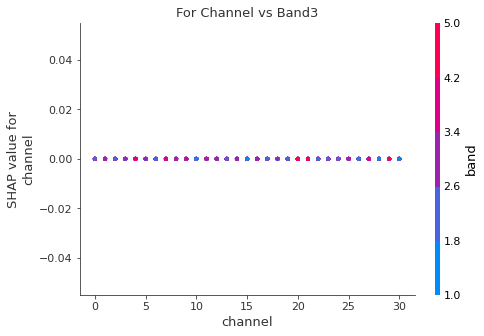

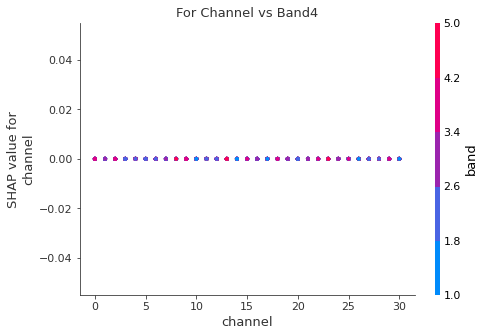

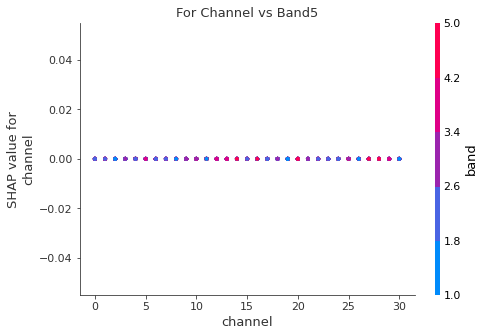

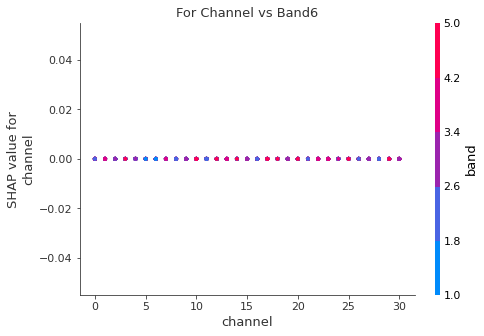

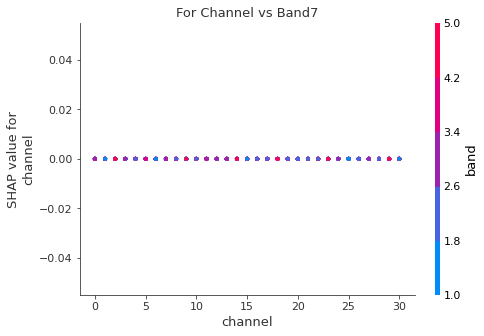

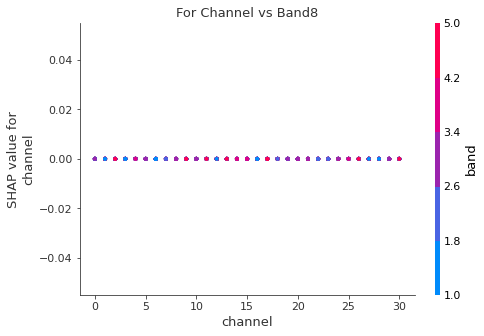

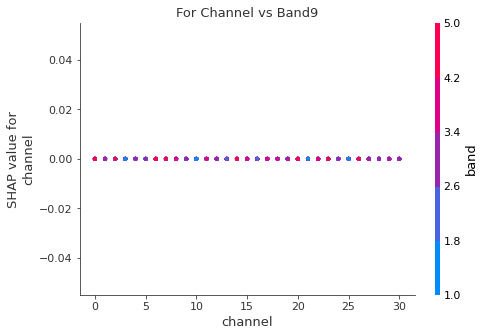

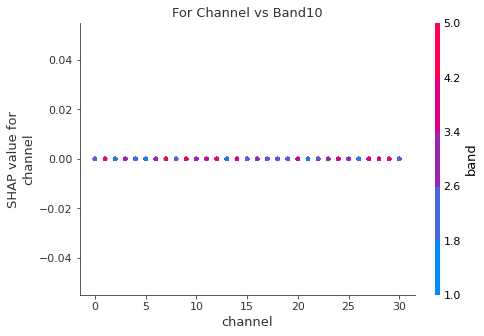

True

In [11]:
df= createdataframe(4) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

       Time0      Time1      Time2  ...  channel  band  Intencity
0  -2.569370   0.300244   3.154248  ...      0.0   1.0        0.1
1 -11.468973  -7.426016  -3.407056  ...      1.0   1.0        0.1
2  -3.459277  -2.760288  -2.071352  ...      2.0   1.0        0.1
3 -29.882223 -33.153233 -36.322264  ...      3.0   1.0        0.1
4  -9.976856 -12.512365 -15.037922  ...      4.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       1.00      0.96      0.98        25
         2.0       1.00      0.95      0.98        44
         3.0       0.95      0.91      0.93        23
         4.0       1.00      1.00      1.00        36
         5.0       0.96      1.00      0.98        27
         6.0       1.00      0.94      0.97        34
         7.0       0.96      1.00      0.98        27
         8.0       0.91      1.00      0.95        30
         9.0       0.97      1.00      0.99        36
        10.0       1.00      1.00    

Sumamry Plot


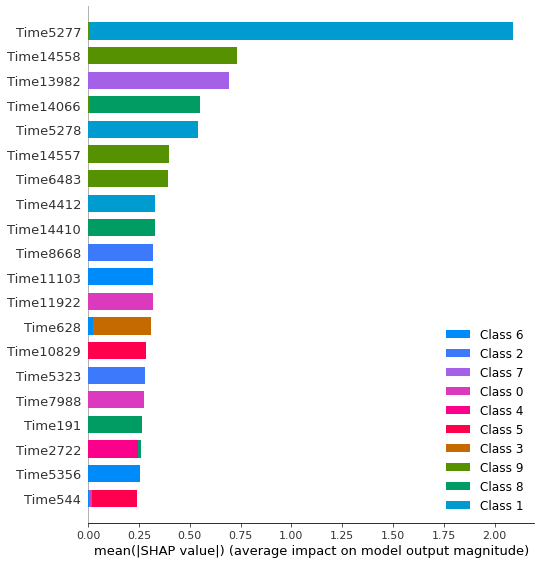

Best time series vs intencity


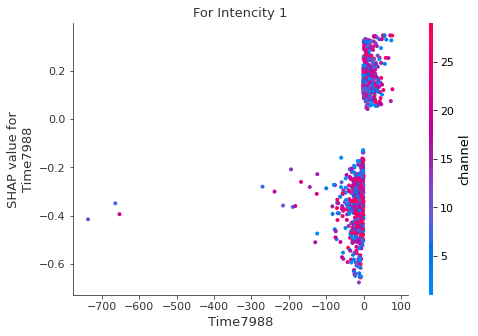

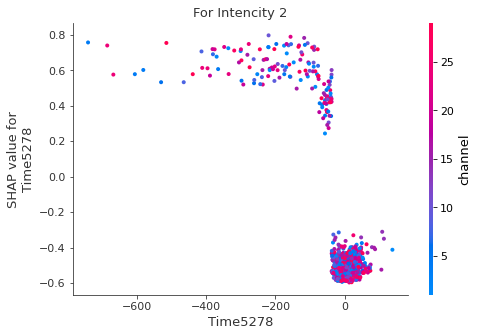

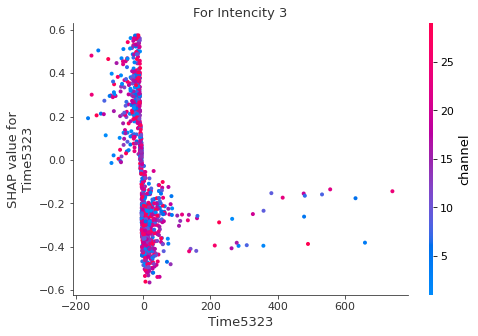

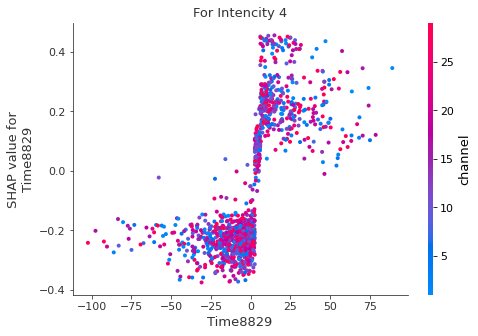

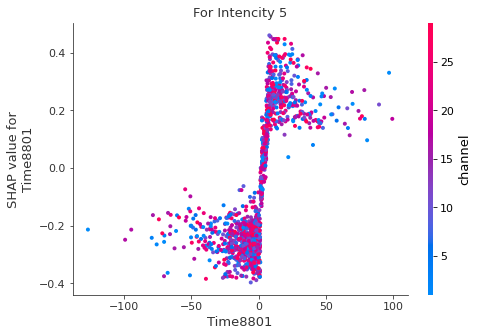

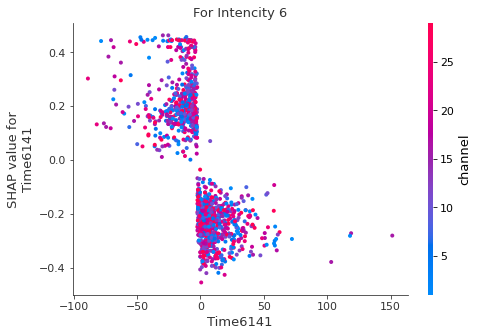

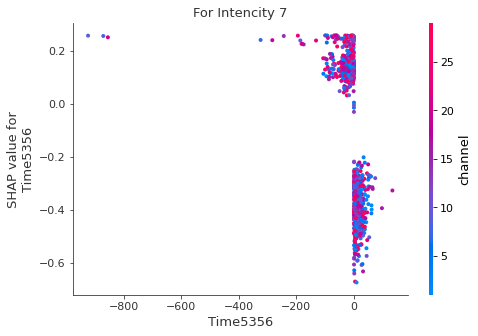

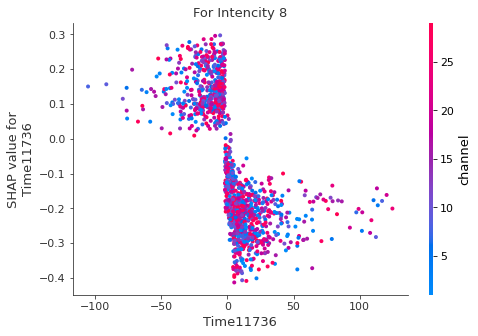

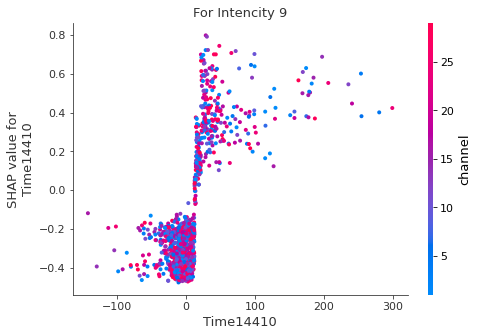

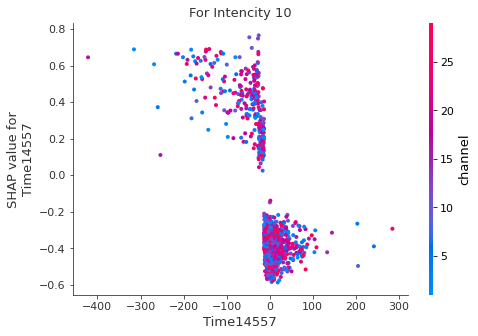

Band vs Channel


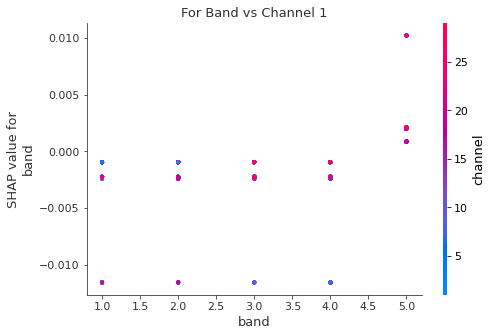

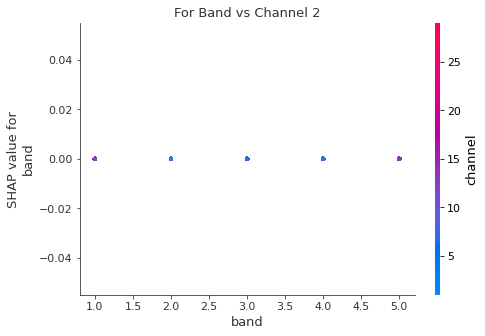

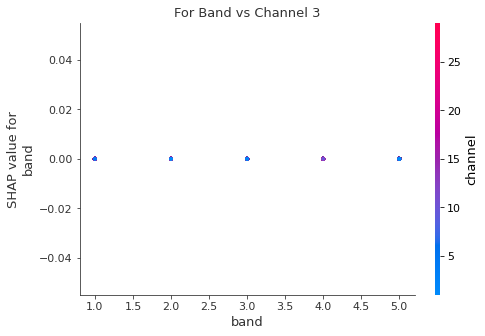

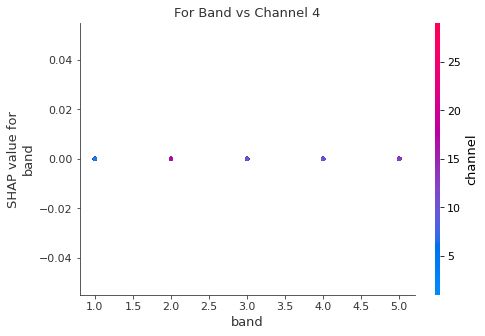

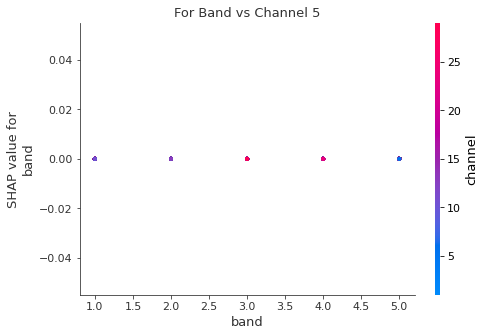

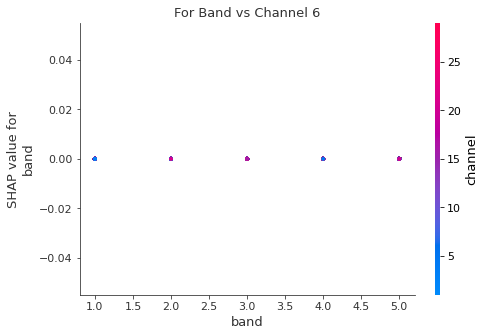

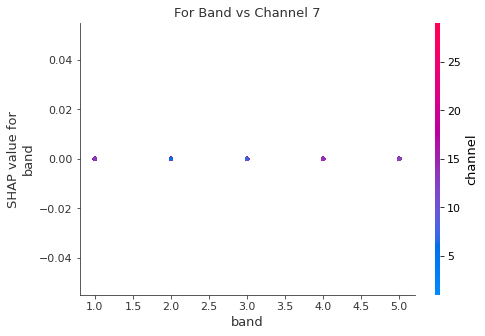

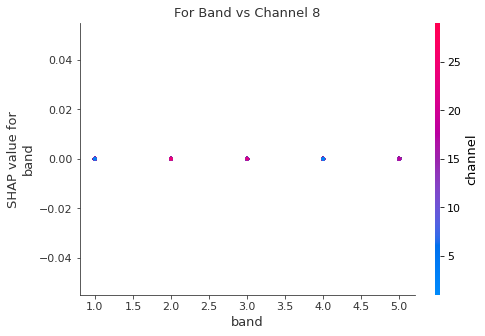

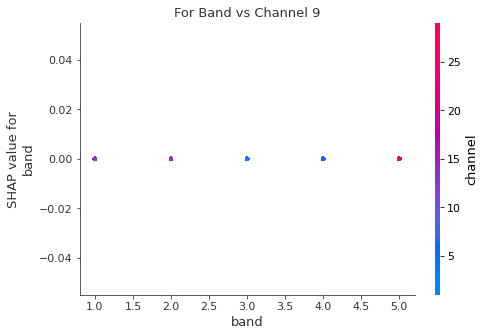

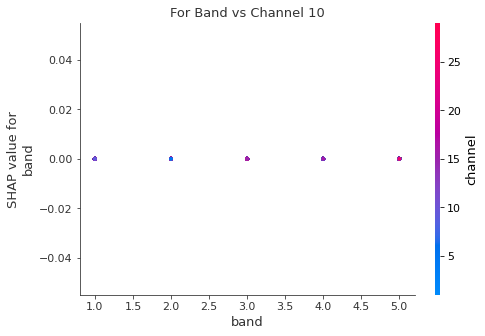

channel vs band


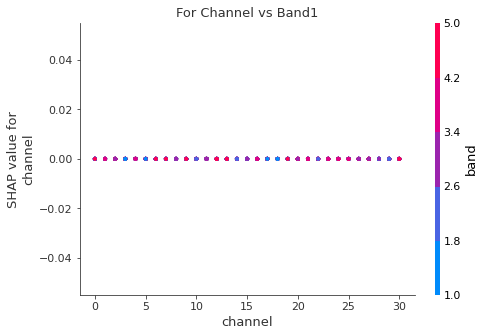

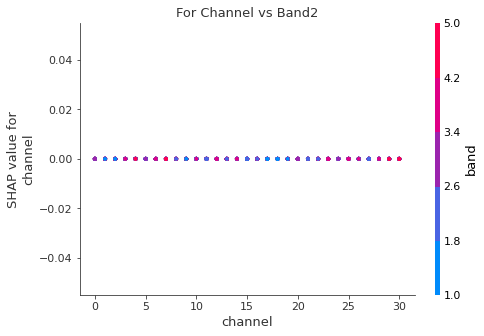

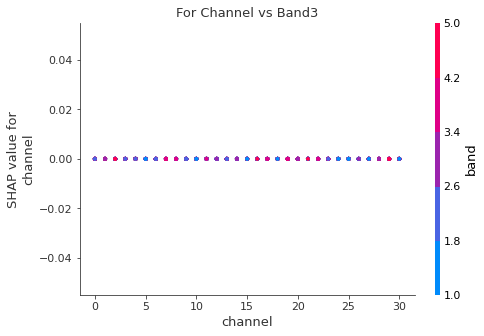

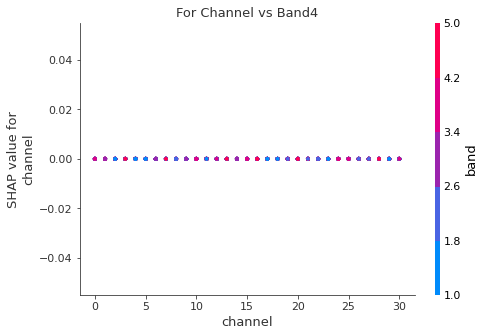

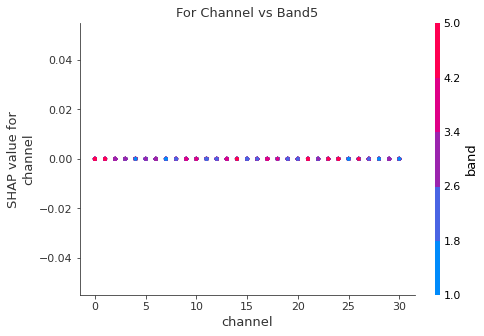

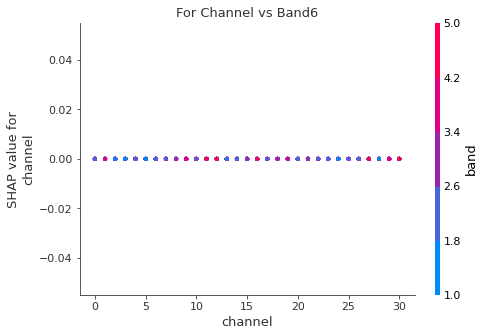

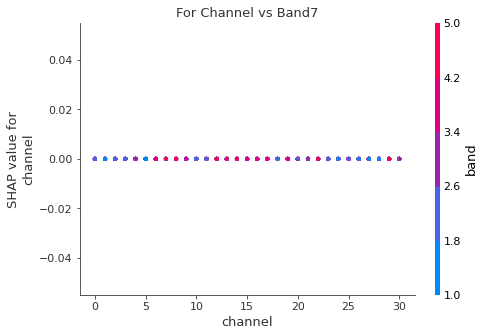

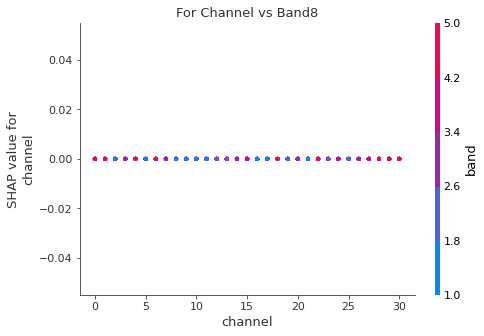

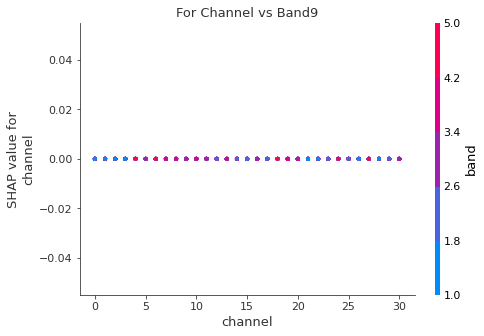

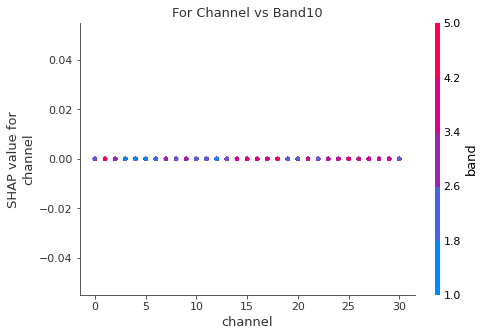

True

In [12]:
df= createdataframe(5) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

        Time0       Time1       Time2  ...  channel  band  Intencity
0    3.552206    6.295904    9.036222  ...      1.0   1.0        0.1
1   29.873366   38.394229   46.917213  ...      3.0   1.0        0.1
2   24.243422   33.439823   42.727316  ...      5.0   1.0        0.1
3  138.528380  154.244940  169.921528  ...      7.0   1.0        0.1
4  254.626906  306.145949  357.681366  ...      9.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       1.00      0.94      0.97        18
         2.0       0.92      0.85      0.88        13
         3.0       1.00      1.00      1.00        19
         4.0       1.00      1.00      1.00        20
         5.0       1.00      1.00      1.00        17
         6.0       1.00      0.92      0.96        12
         7.0       0.90      0.95      0.93        20
         8.0       0.94      1.00      0.97        15
         9.0       0.93      1.00      0.96        13
        10.0       

Sumamry Plot


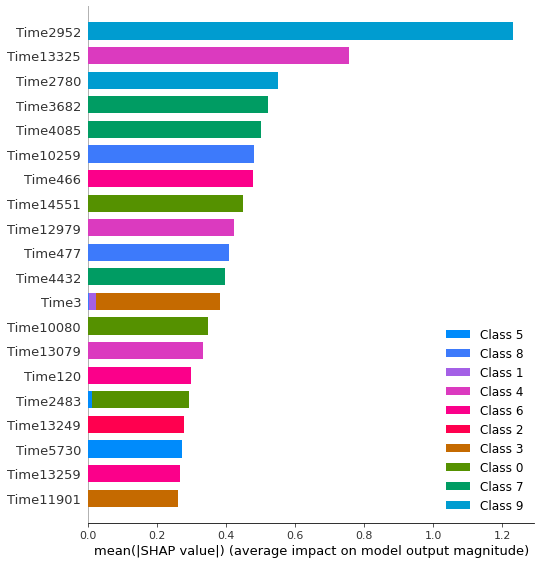

Best time series vs intencity


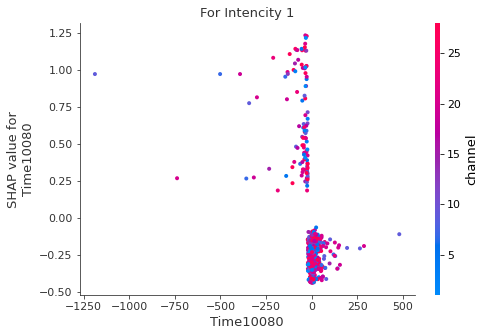

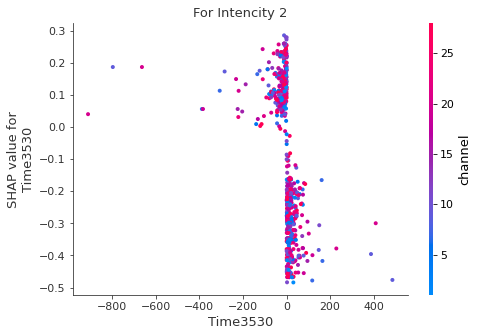

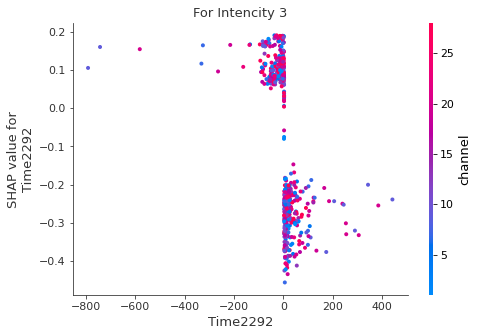

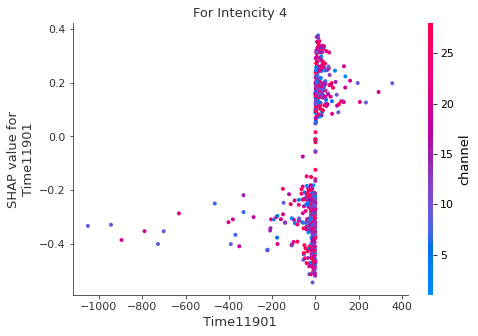

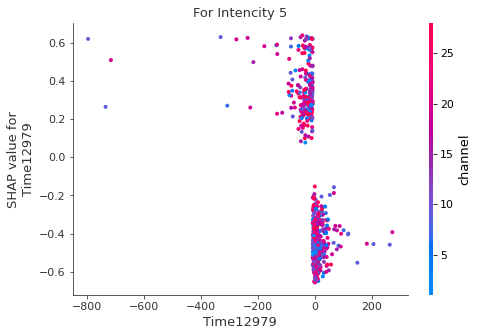

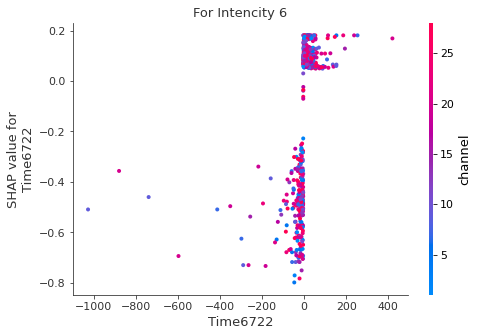

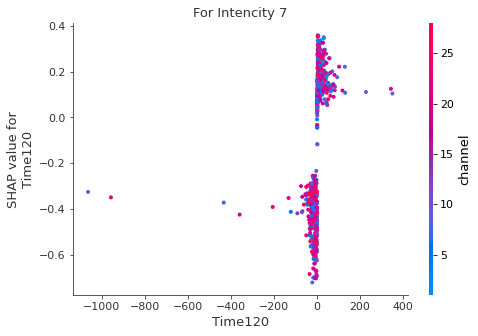

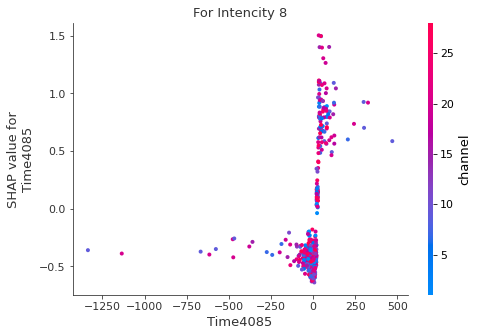

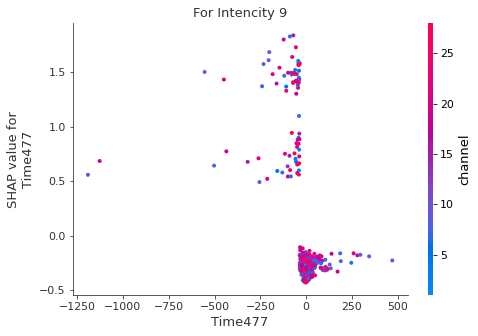

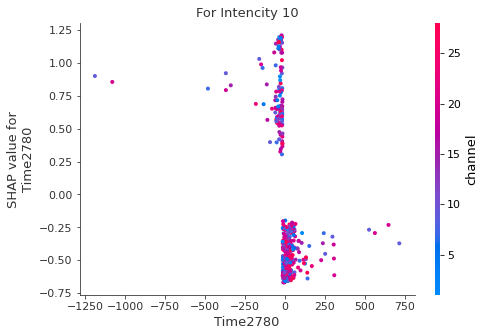

Band vs Channel


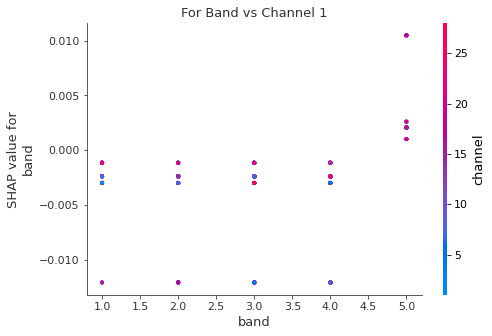

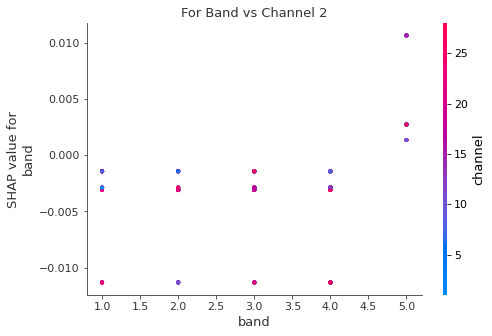

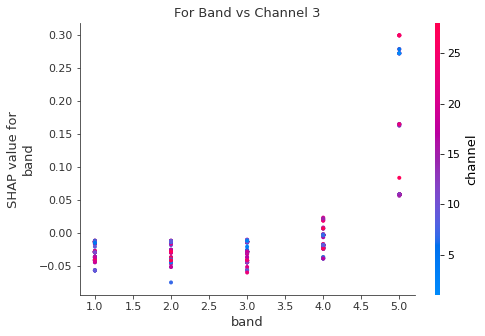

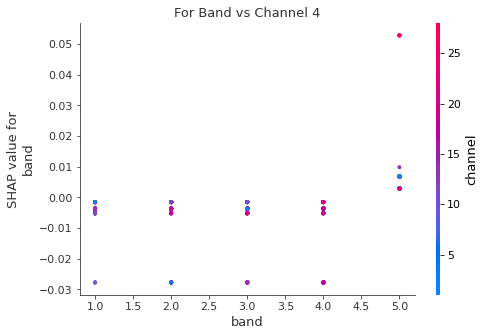

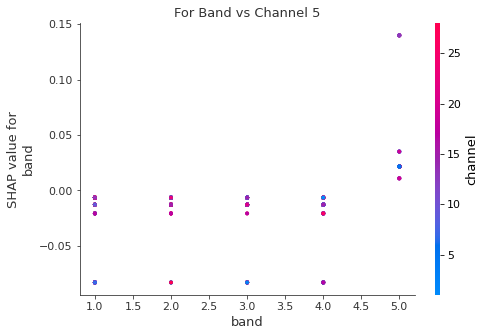

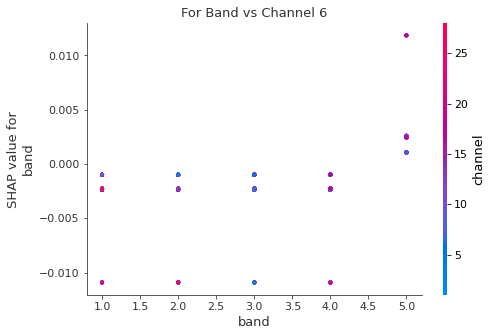

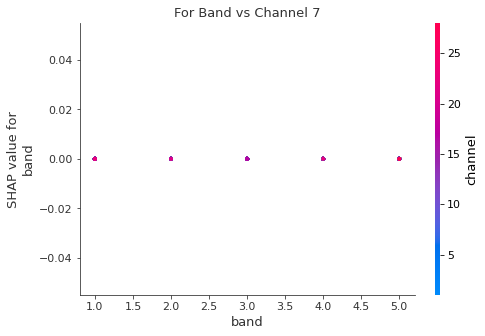

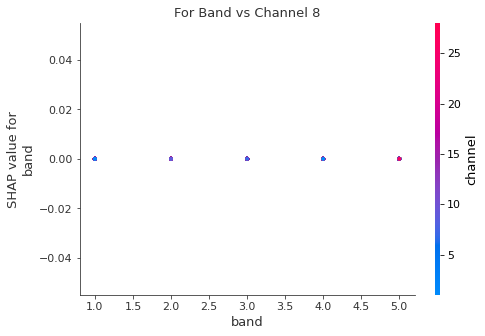

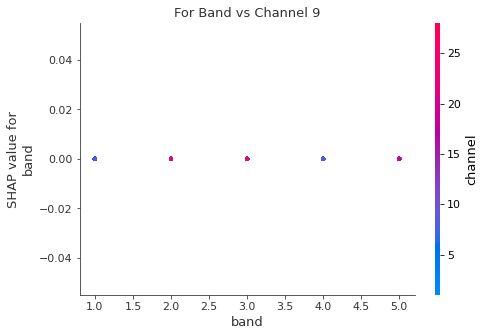

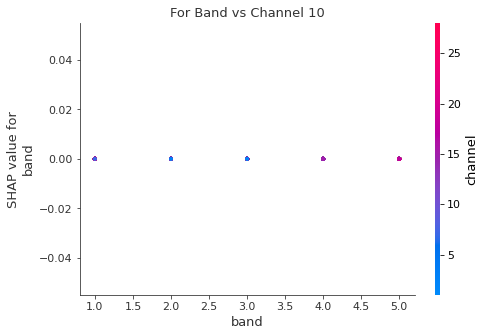

channel vs band


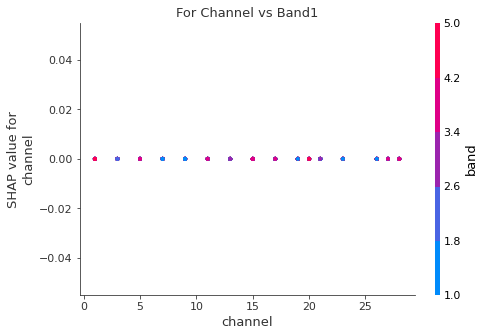

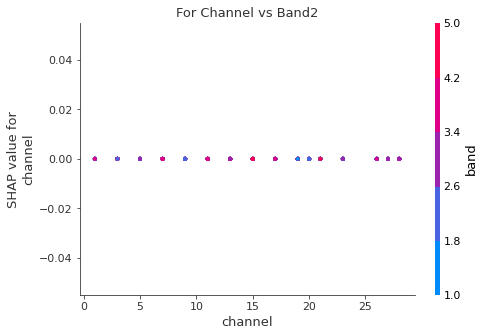

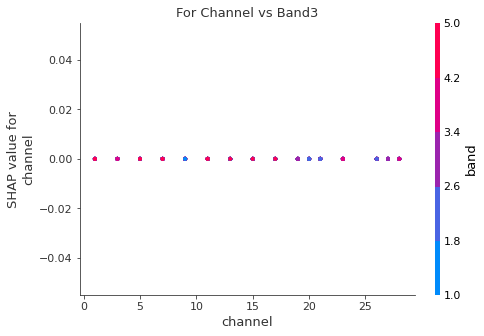

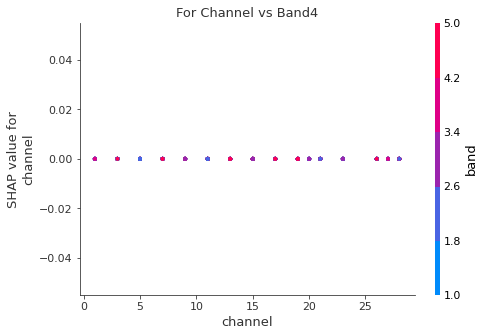

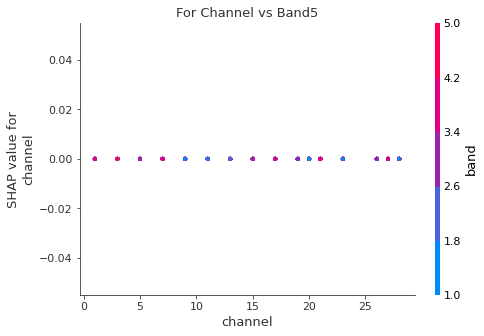

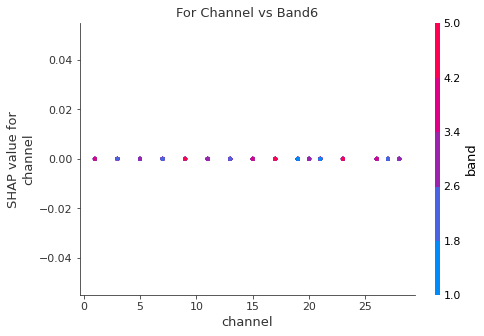

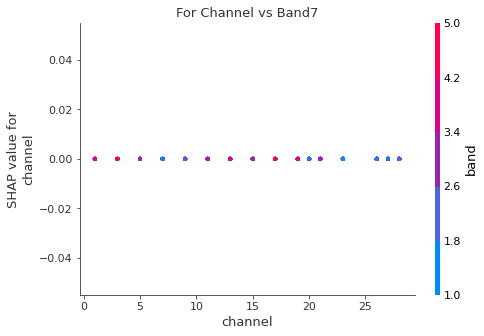

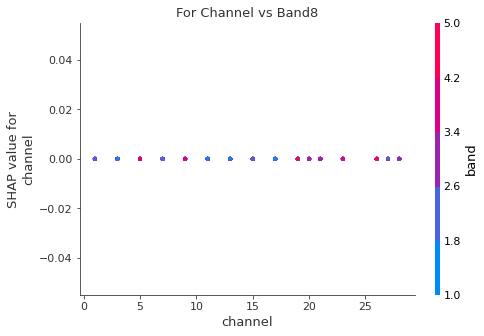

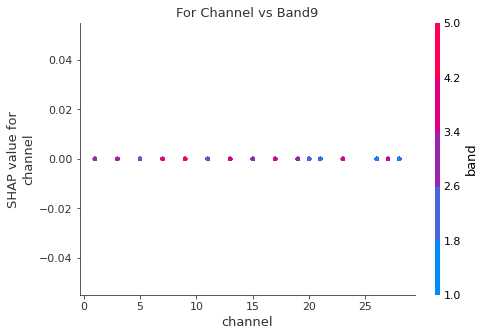

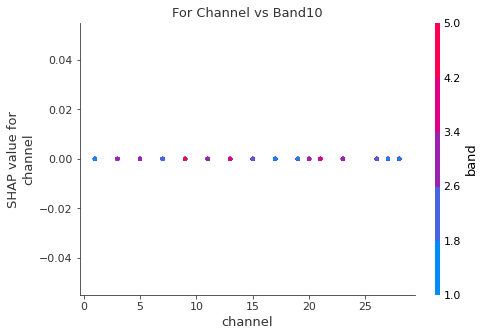

True

In [13]:
df=createdataframeleft(1) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

       Time0      Time1      Time2  ...  channel  band  Intencity
0  -6.803749   1.853609  10.492998  ...      1.0   1.0        0.1
1  10.246386  16.739674  23.174124  ...      3.0   1.0        0.1
2  24.459728  30.645781  36.717799  ...      5.0   1.0        0.1
3  11.069598  15.688119  20.283672  ...      7.0   1.0        0.1
4  37.951869  32.326465  26.842060  ...      9.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       1.00      0.94      0.97        18
         2.0       1.00      0.85      0.92        13
         3.0       0.95      0.95      0.95        19
         4.0       1.00      0.95      0.97        20
         5.0       0.94      1.00      0.97        17
         6.0       1.00      0.92      0.96        12
         7.0       0.95      0.95      0.95        20
         8.0       0.88      1.00      0.94        15
         9.0       0.87      1.00      0.93        13
        10.0       1.00      1.00    

Sumamry Plot


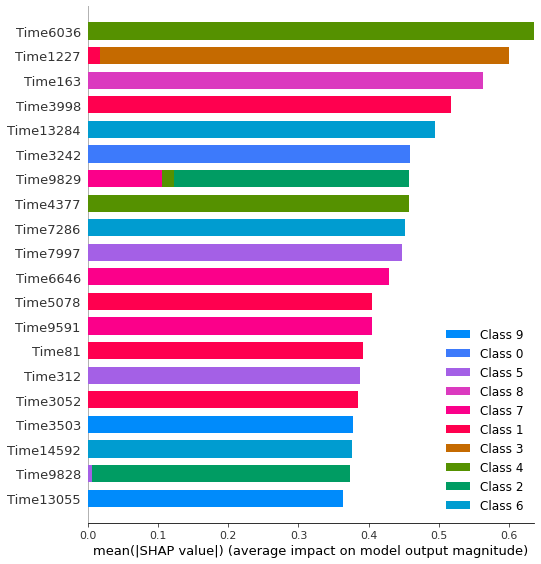

Best time series vs intencity


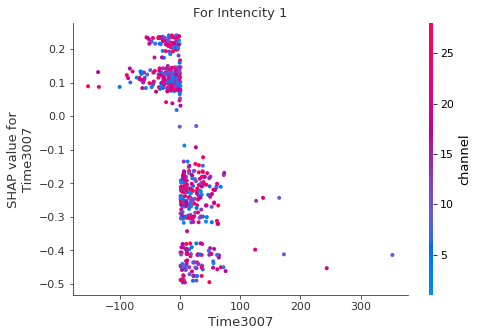

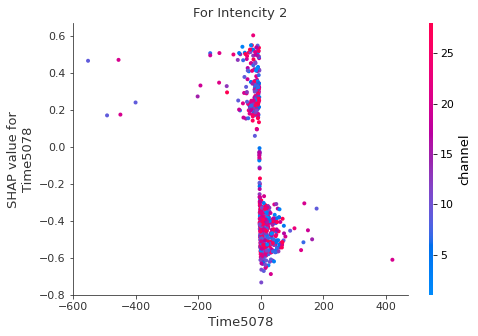

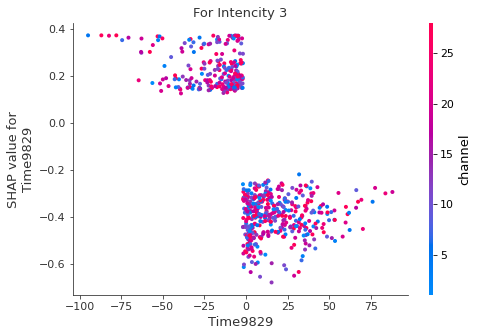

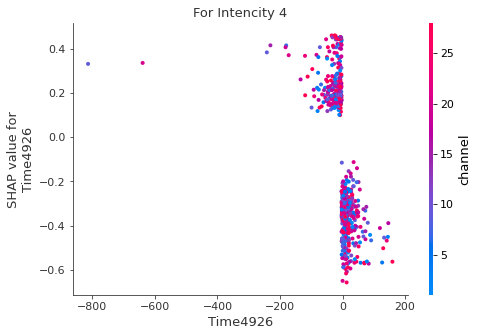

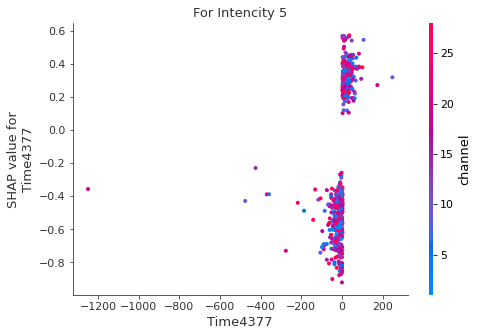

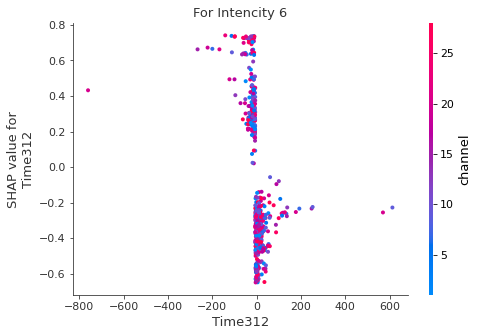

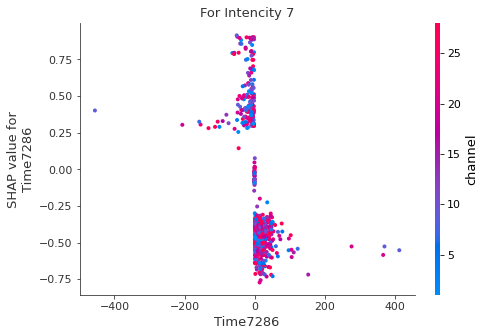

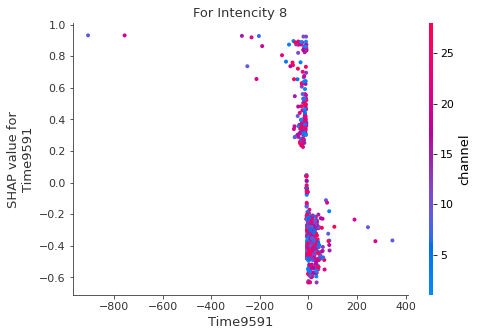

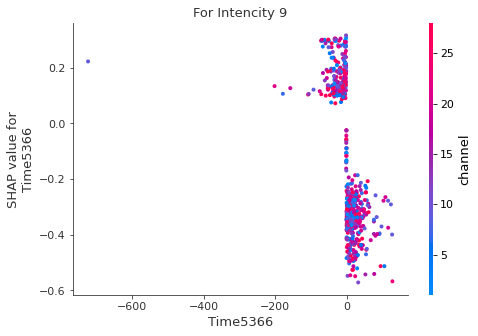

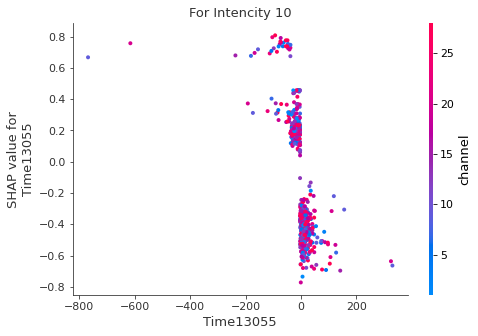

Band vs Channel


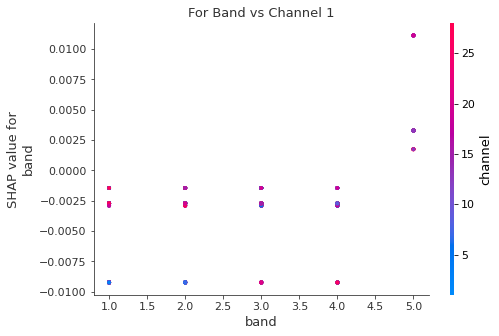

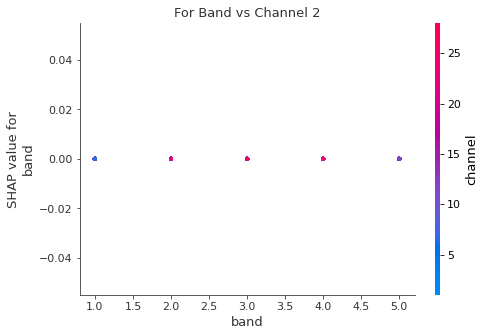

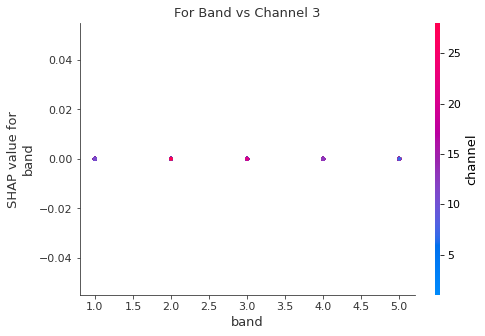

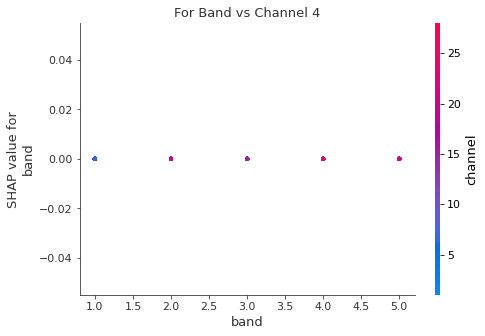

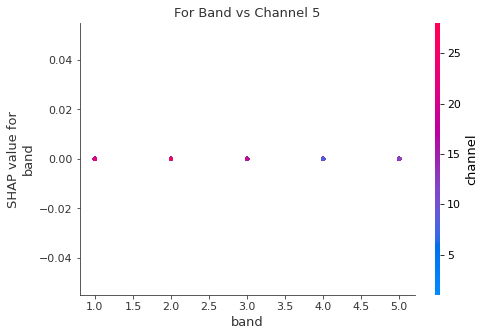

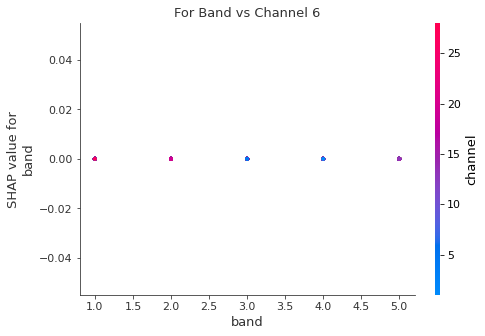

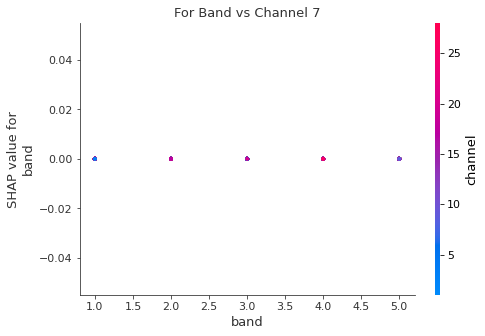

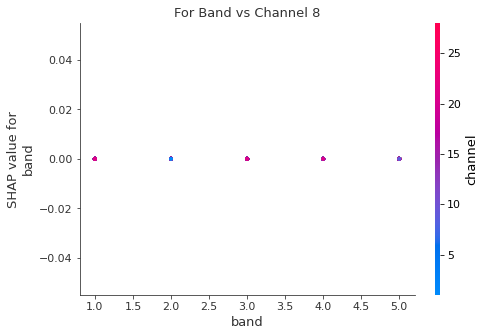

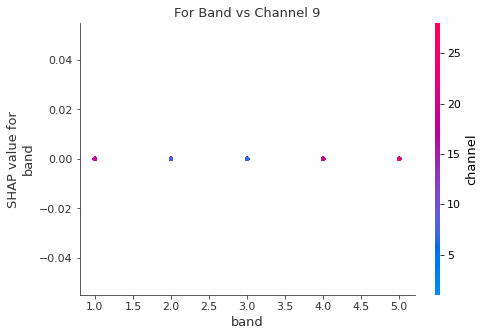

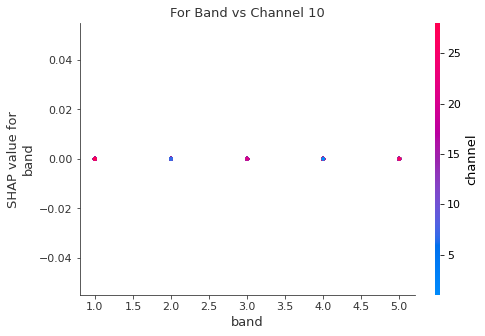

channel vs band


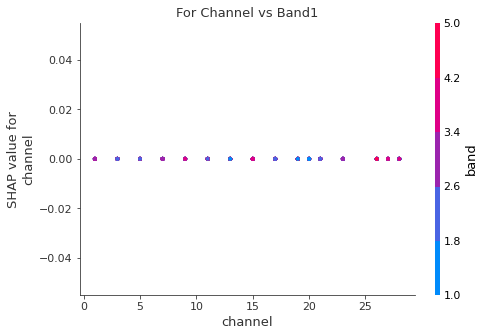

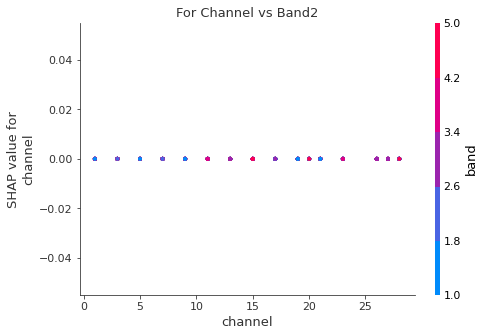

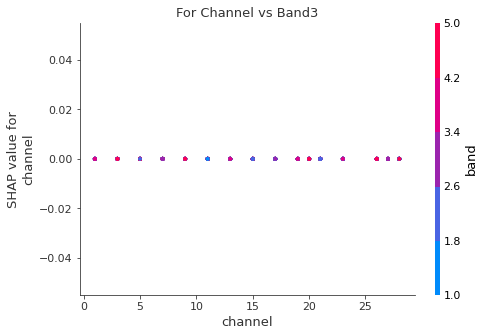

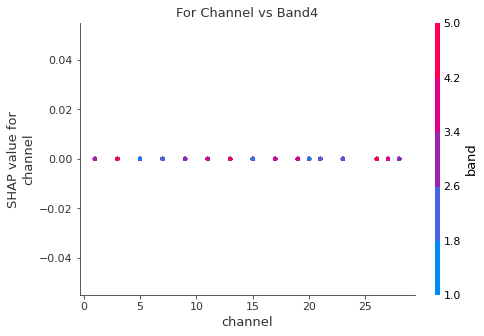

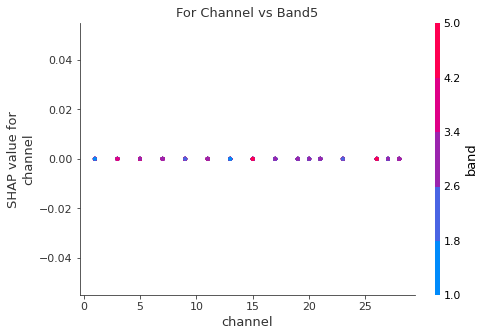

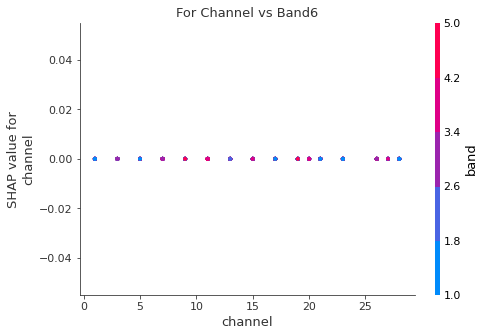

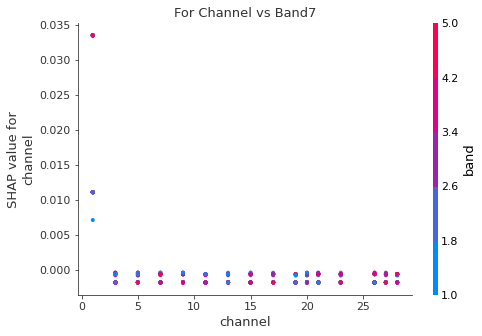

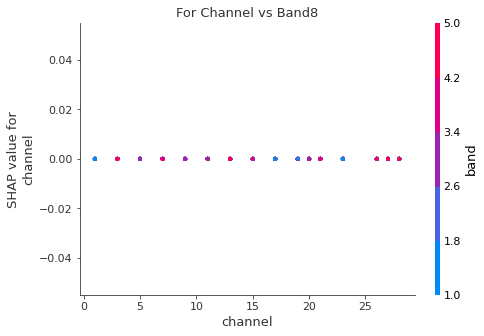

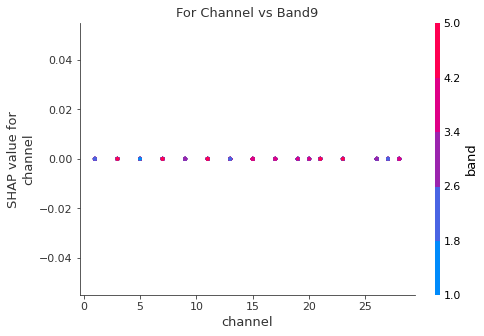

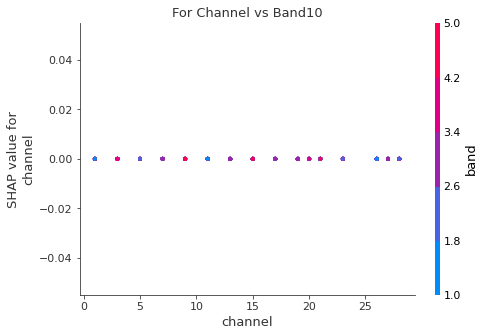

True

In [14]:
df=createdataframeleft(2) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

       Time0      Time1      Time2  ...  channel  band  Intencity
0  23.069194   9.877809  -3.327511  ...      1.0   1.0        0.1
1  30.401816  22.579755  14.714075  ...      3.0   1.0        0.1
2  31.599060  35.609269  39.532466  ...      5.0   1.0        0.1
3  11.075871  13.237358  15.397596  ...      7.0   1.0        0.1
4   4.149620   4.967534   5.787441  ...      9.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       0.94      0.94      0.94        18
         2.0       0.90      0.69      0.78        13
         3.0       1.00      0.89      0.94        19
         4.0       0.90      0.95      0.93        20
         5.0       0.94      0.94      0.94        17
         6.0       0.92      0.92      0.92        12
         7.0       0.90      0.95      0.93        20
         8.0       0.88      0.93      0.90        15
         9.0       0.93      1.00      0.96        13
        10.0       0.93      1.00    

Sumamry Plot


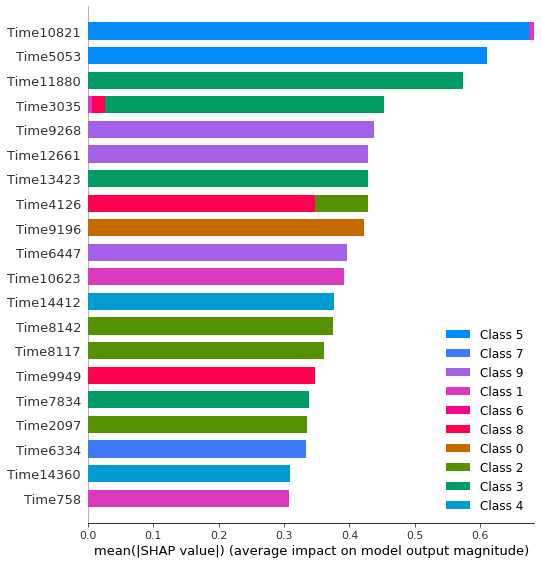

Best time series vs intencity


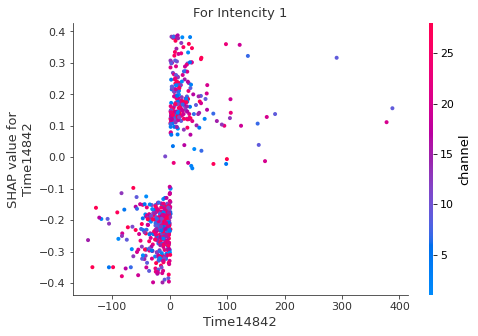

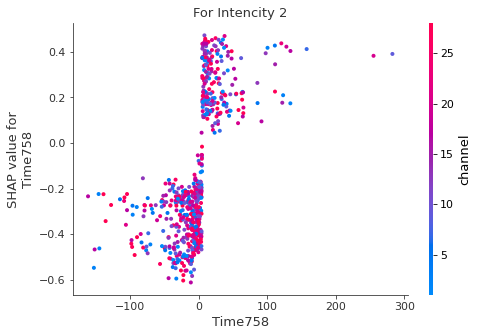

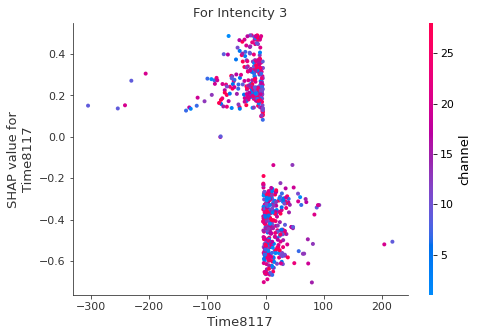

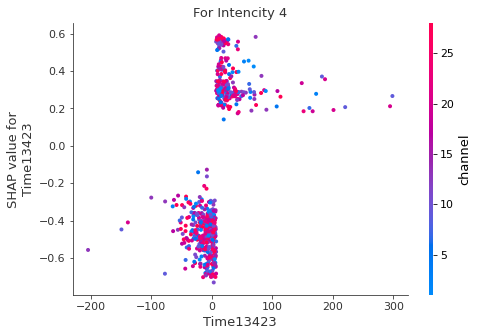

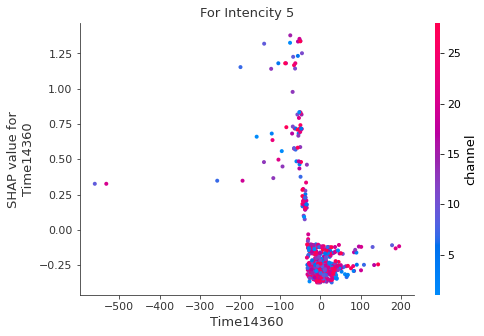

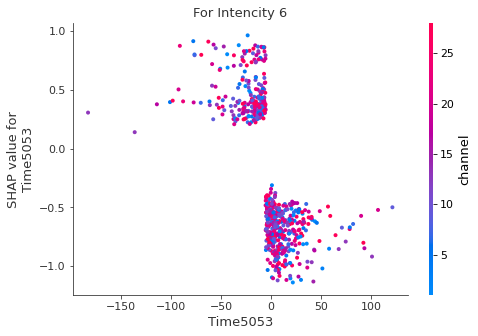

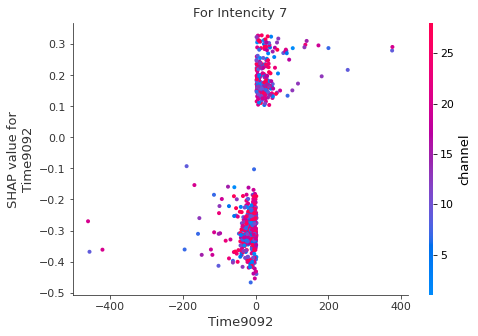

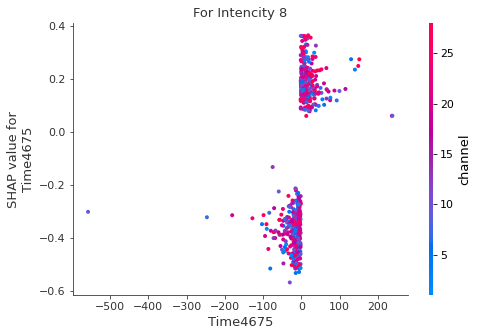

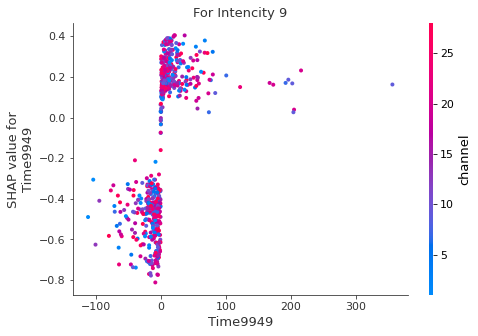

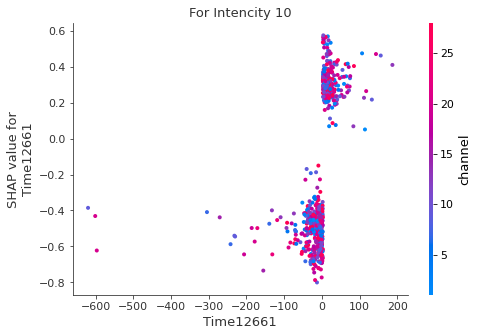

Band vs Channel


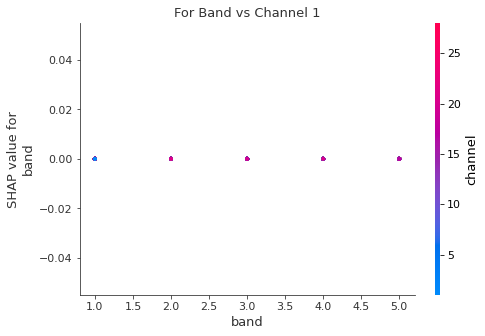

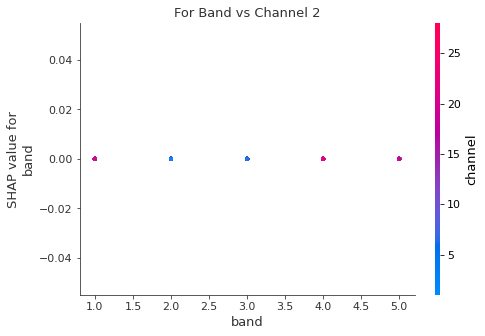

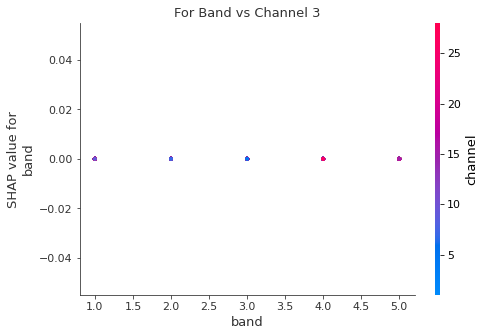

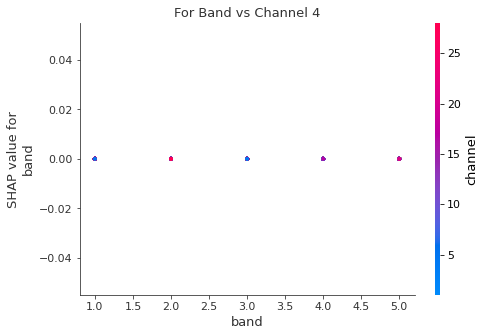

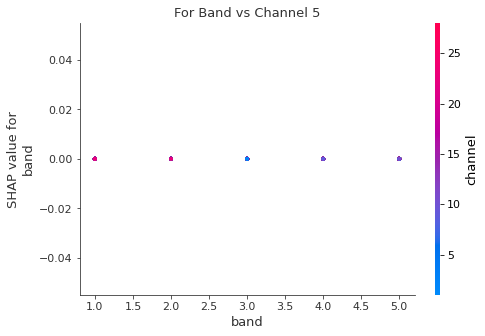

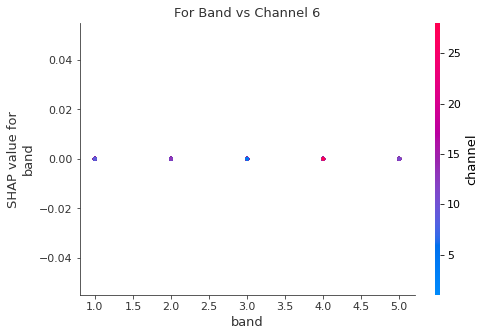

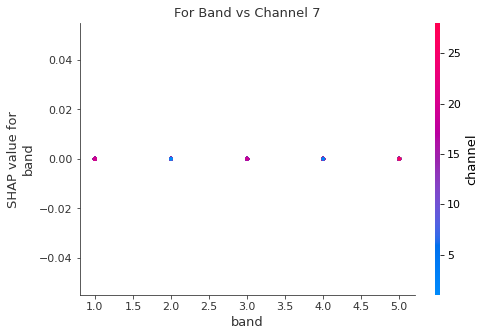

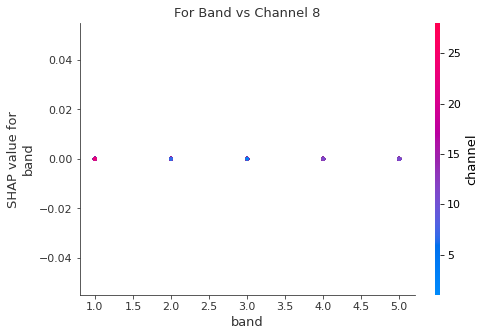

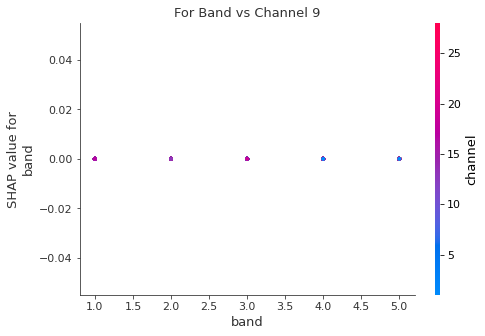

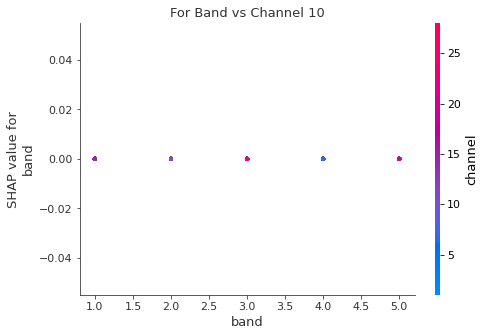

channel vs band


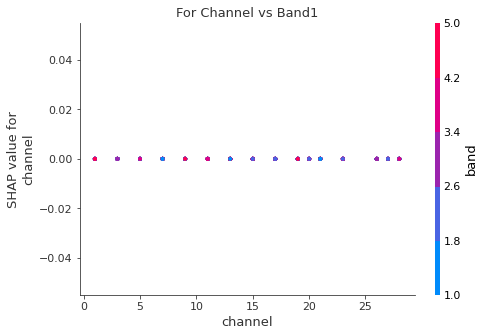

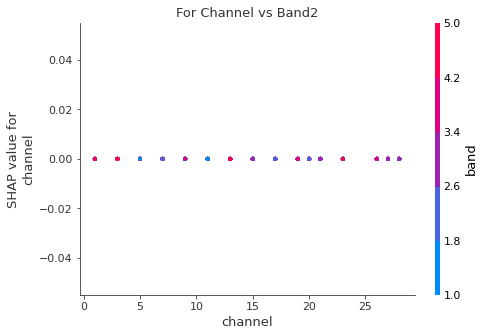

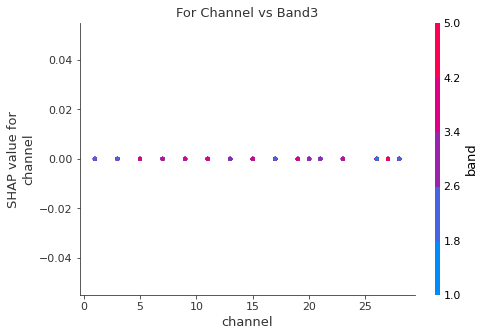

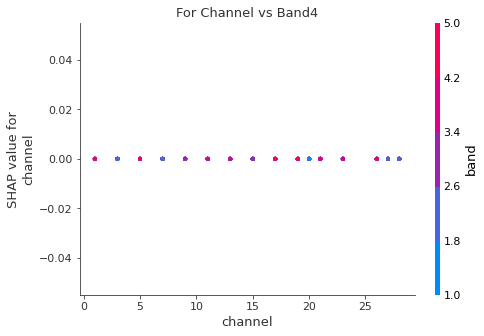

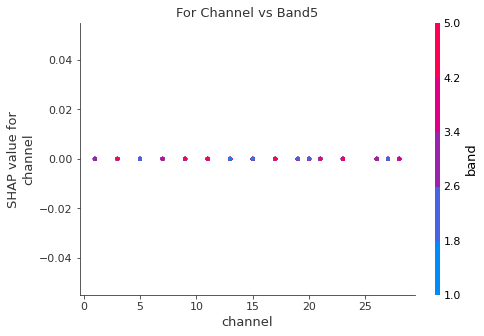

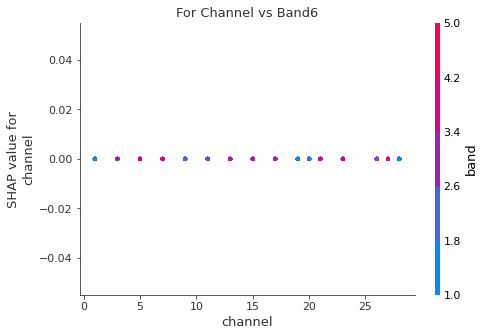

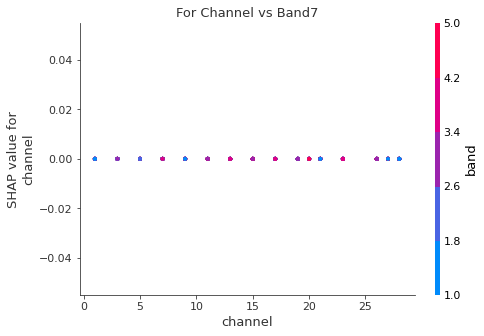

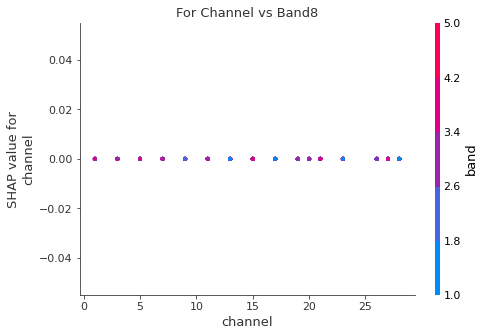

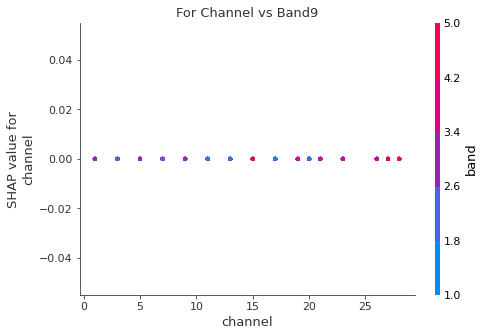

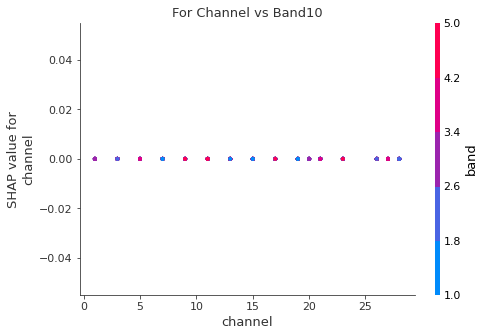

True

In [15]:
df=createdataframeleft(3) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

      Time0      Time1      Time2  ...  channel  band  Intencity
0  7.048502   4.953891   2.770400  ...      1.0   1.0        0.1
1 -4.711406 -12.956088 -21.256543  ...      3.0   1.0        0.1
2 -8.922860 -15.128574 -21.329572  ...      5.0   1.0        0.1
3  4.057370  -2.384758  -8.816318  ...      7.0   1.0        0.1
4 -6.395139   3.051359  12.481278  ...      9.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       0.94      0.94      0.94        18
         2.0       0.91      0.77      0.83        13
         3.0       1.00      0.84      0.91        19
         4.0       1.00      0.95      0.97        20
         5.0       0.89      1.00      0.94        17
         6.0       1.00      0.83      0.91        12
         7.0       0.86      0.90      0.88        20
         8.0       0.75      1.00      0.86        15
         9.0       0.93      1.00      0.96        13
        10.0       1.00      0.92      0.96

Sumamry Plot


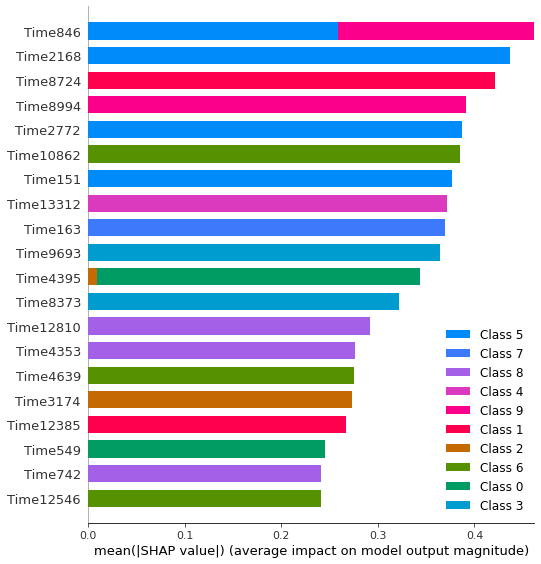

Best time series vs intencity


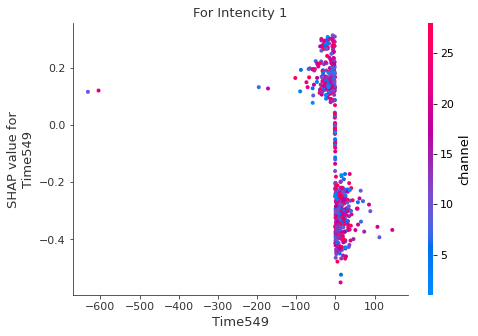

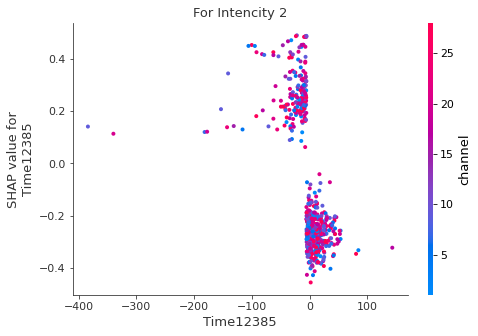

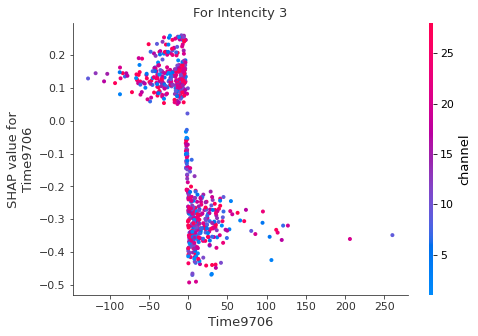

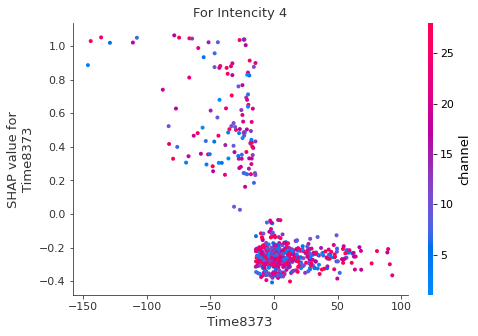

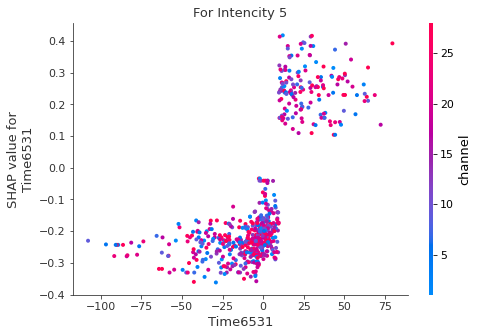

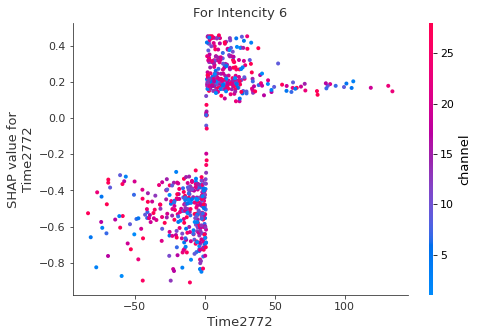

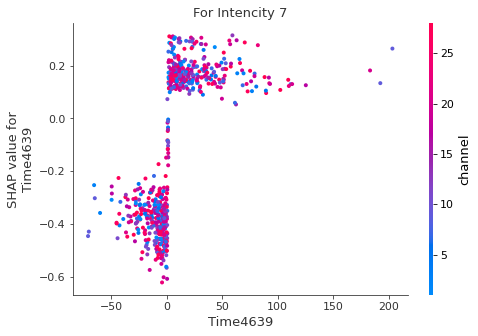

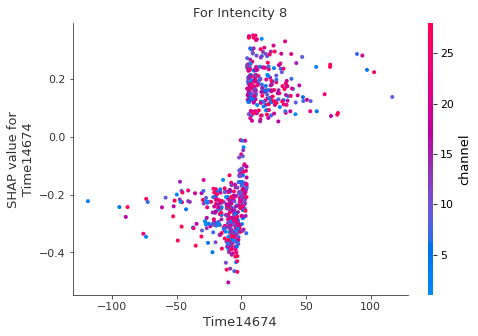

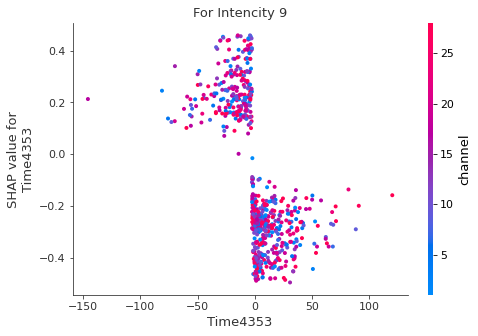

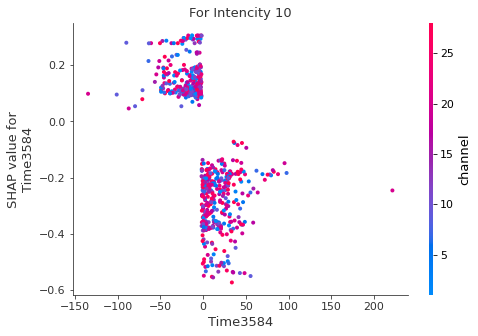

Band vs Channel


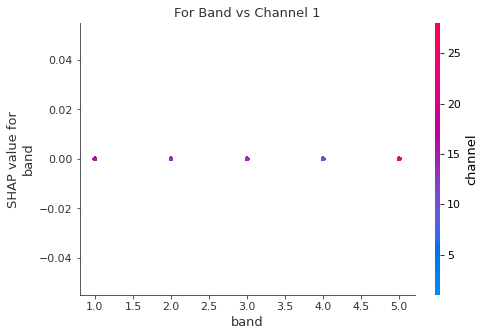

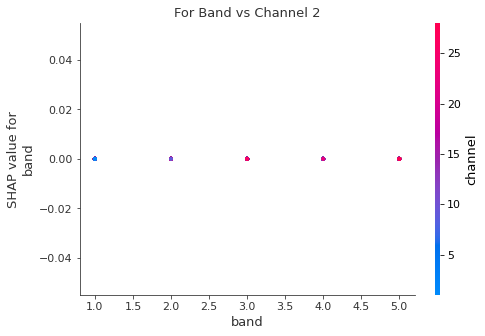

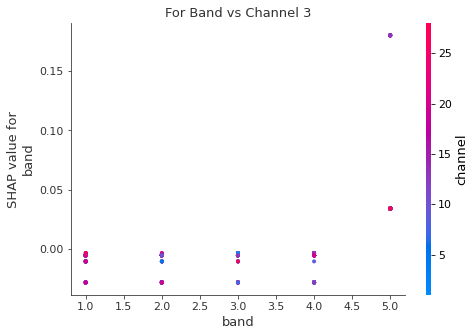

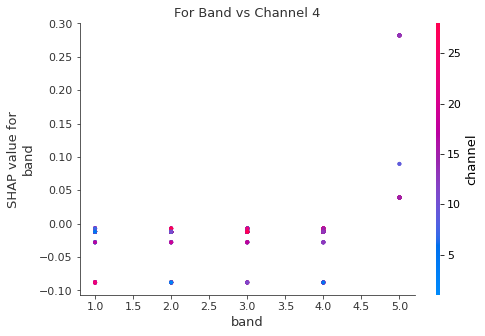

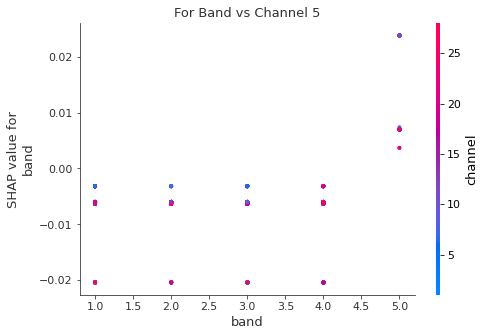

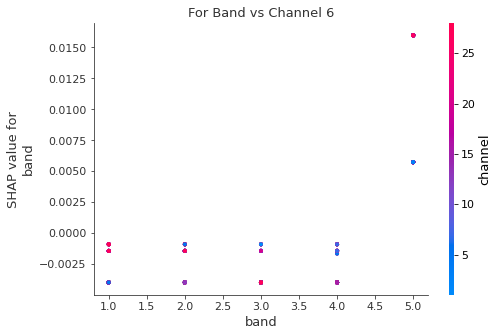

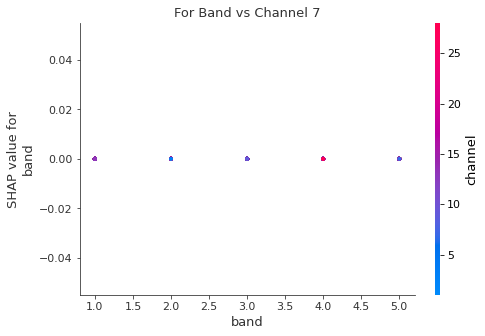

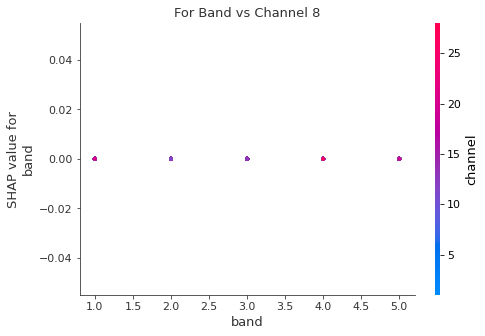

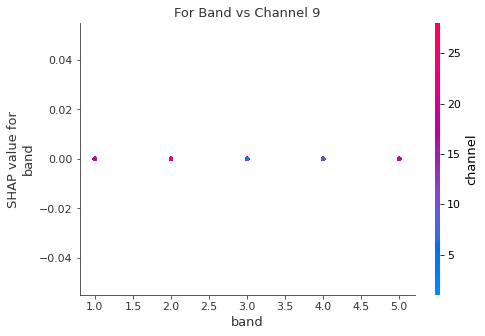

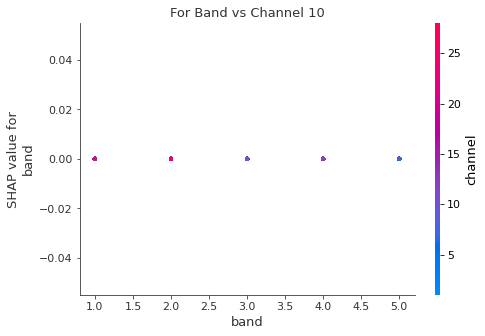

channel vs band


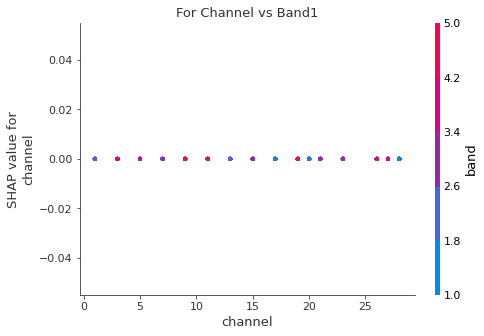

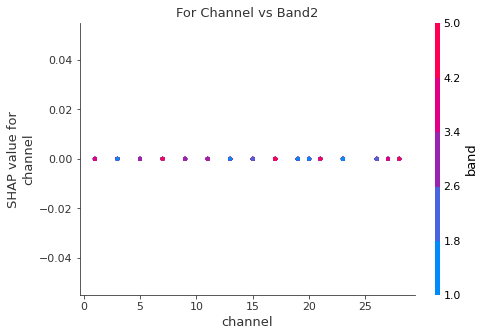

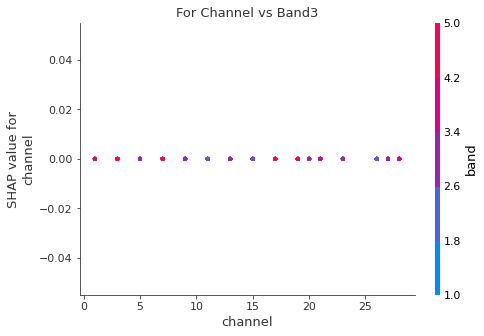

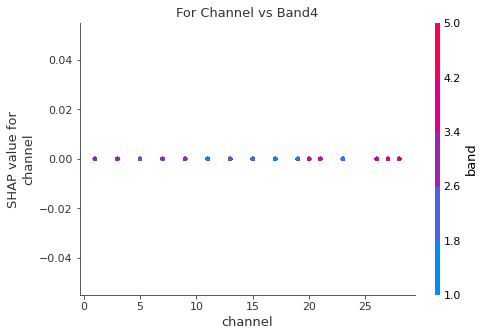

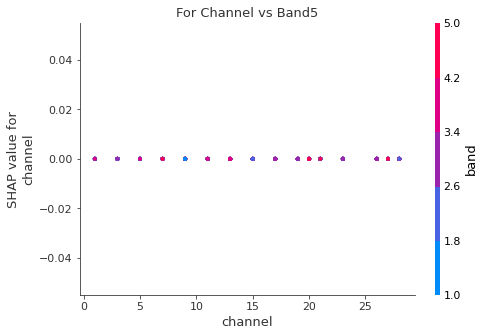

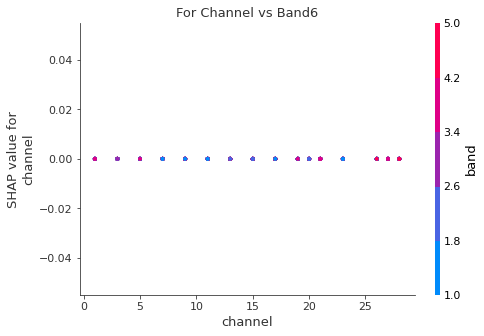

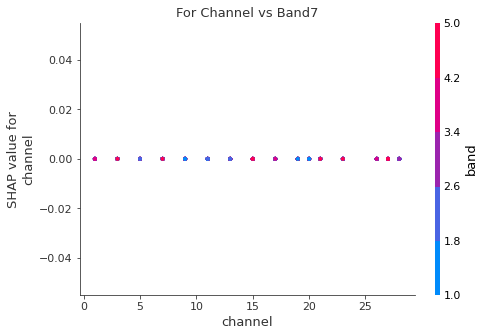

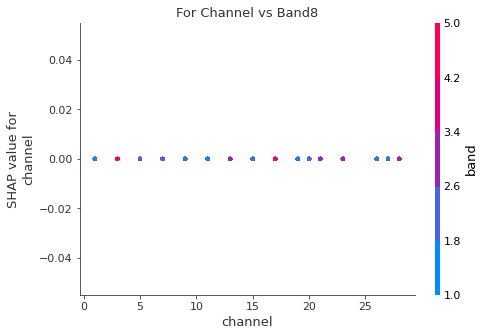

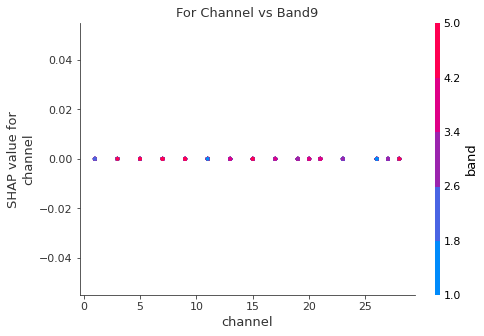

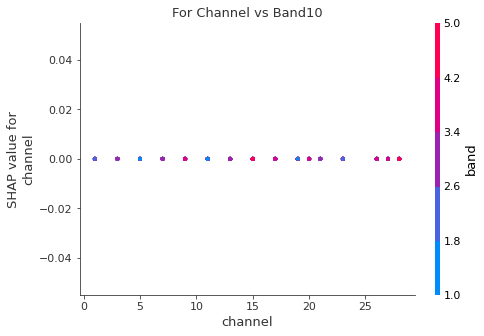

True

In [16]:
df=createdataframeleft(4) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

       Time0      Time1      Time2  ...  channel  band  Intencity
0 -11.468973  -7.426016  -3.407056  ...      1.0   1.0        0.1
1 -29.882223 -33.153233 -36.322264  ...      3.0   1.0        0.1
2 -20.401555 -22.279283 -24.071530  ...      5.0   1.0        0.1
3 -28.417133 -33.584036 -38.675884  ...      7.0   1.0        0.1
4  -6.720103 -15.430167 -24.085543  ...      9.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       1.00      0.94      0.97        18
         2.0       1.00      0.85      0.92        13
         3.0       0.86      1.00      0.93        19
         4.0       0.95      0.95      0.95        20
         5.0       0.94      1.00      0.97        17
         6.0       0.92      0.92      0.92        12
         7.0       1.00      0.85      0.92        20
         8.0       0.88      1.00      0.94        15
         9.0       0.93      1.00      0.96        13
        10.0       1.00      0.92    

Sumamry Plot


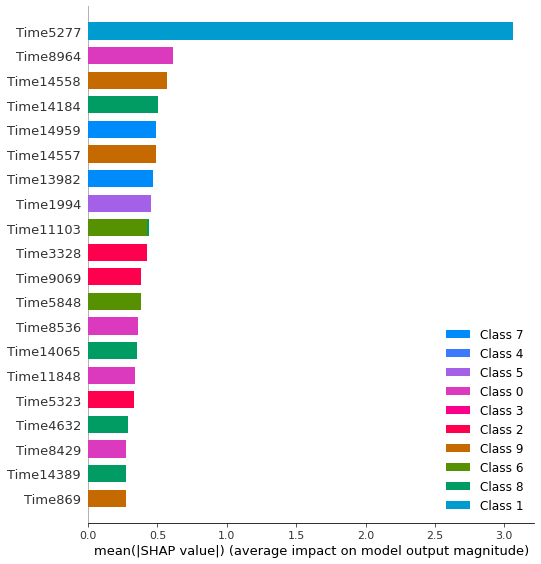

Best time series vs intencity


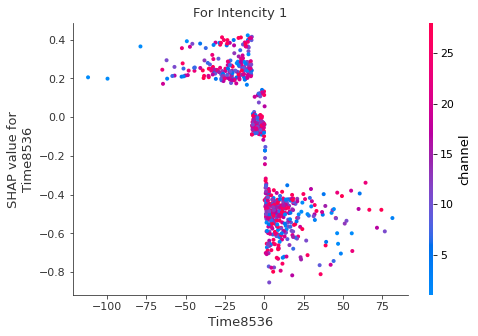

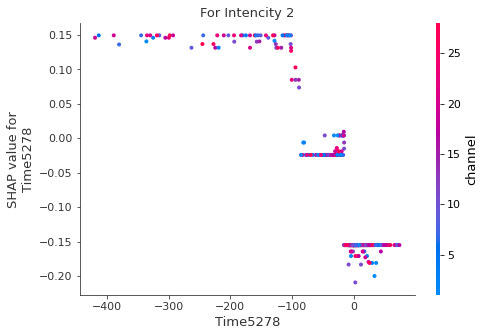

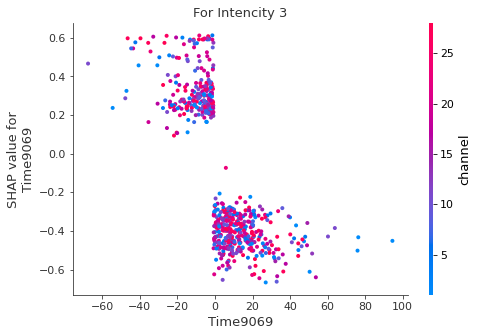

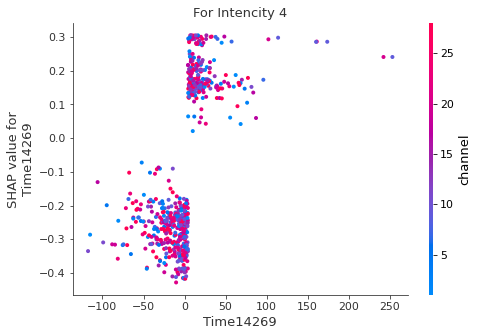

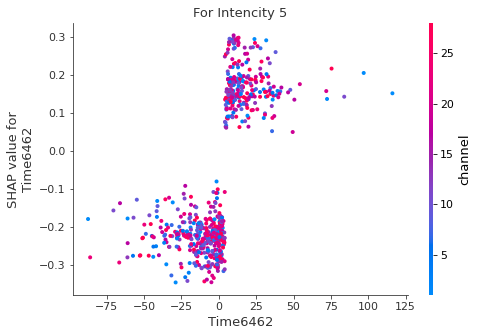

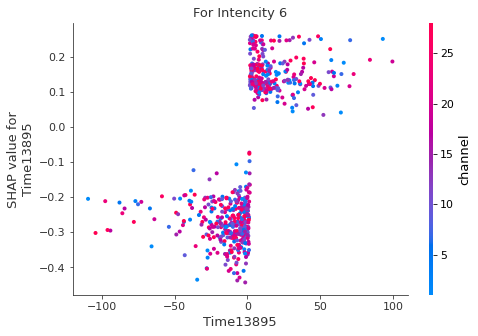

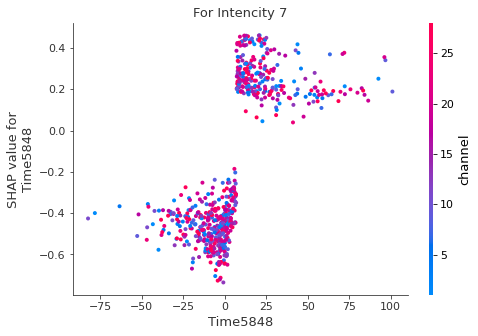

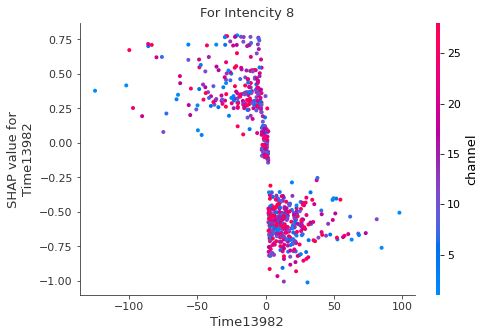

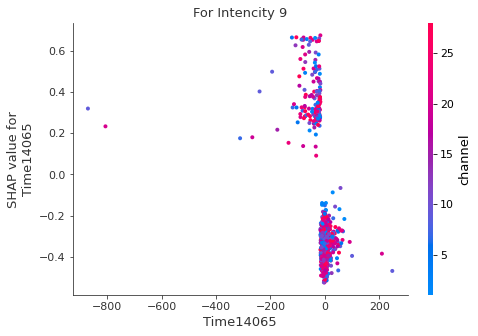

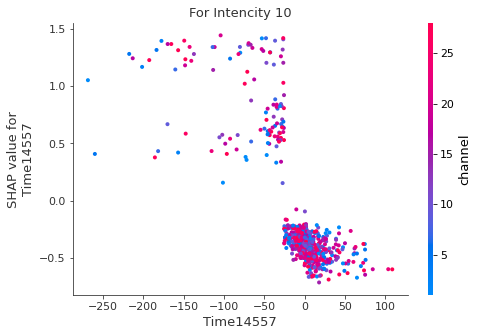

Band vs Channel


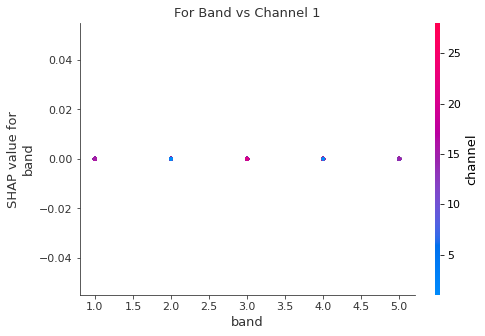

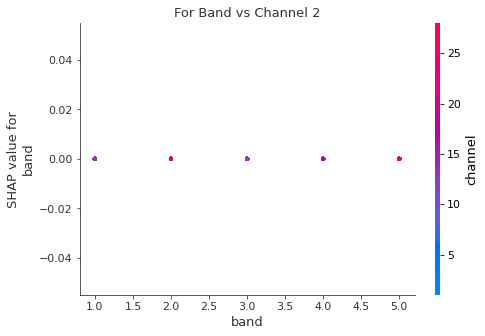

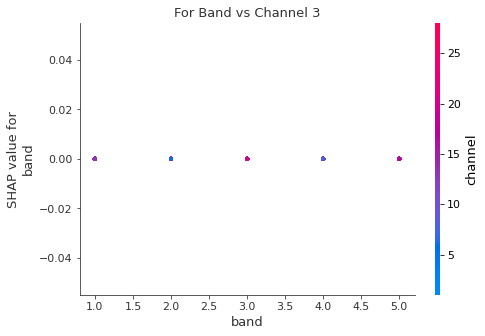

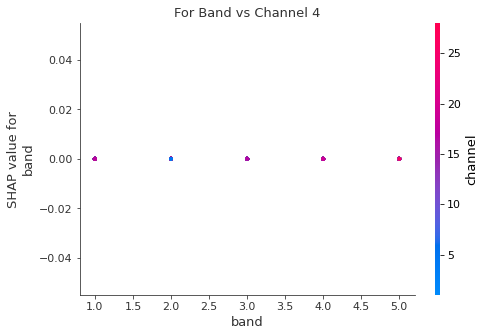

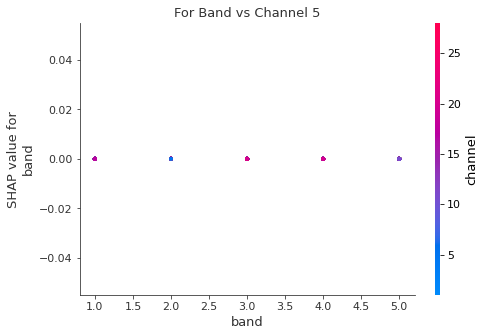

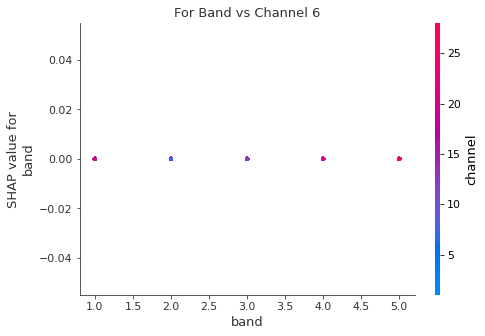

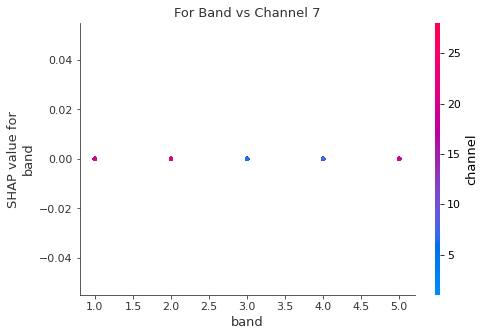

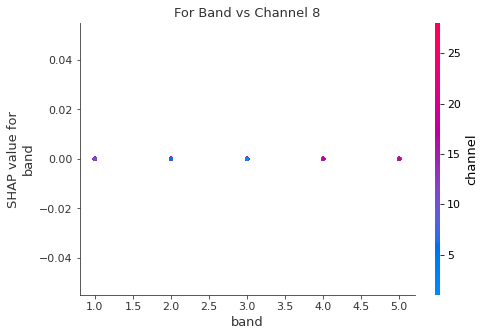

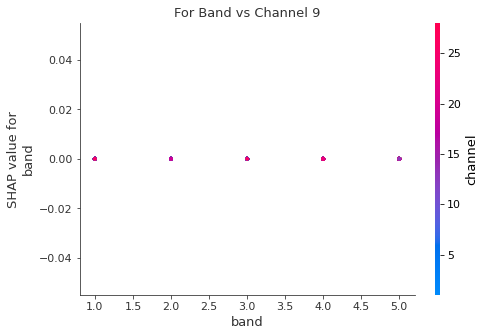

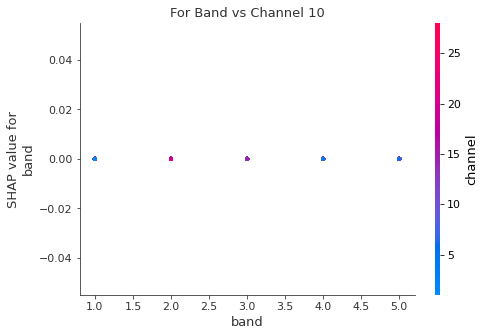

channel vs band


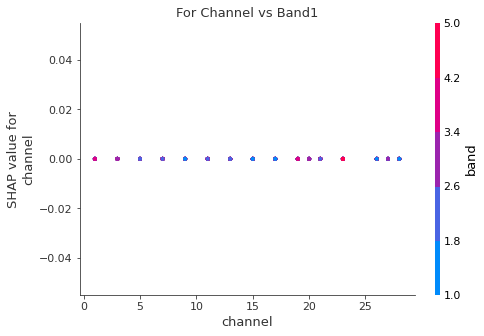

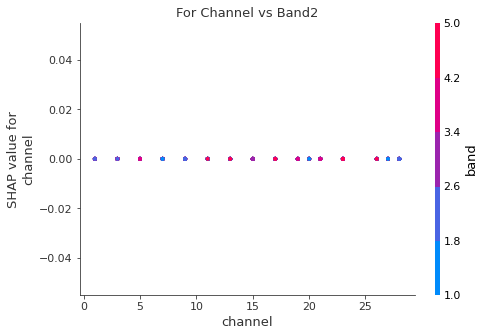

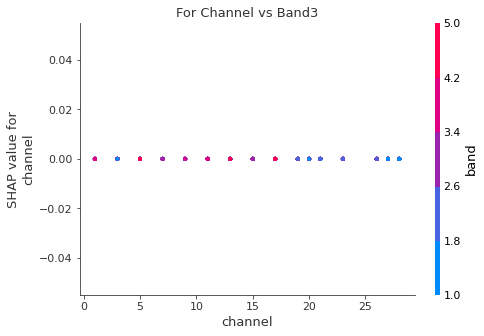

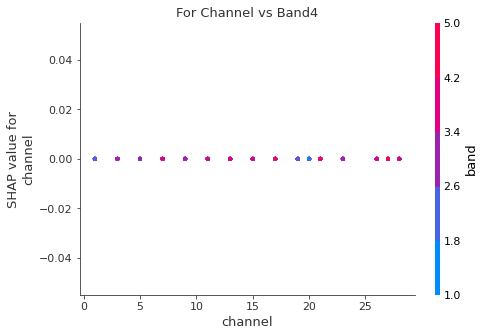

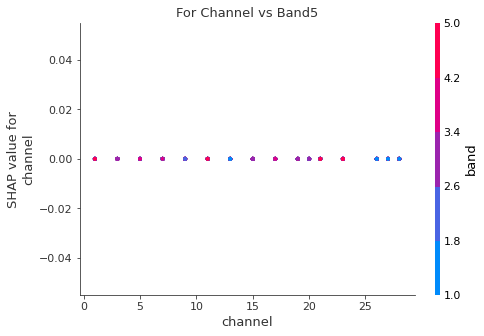

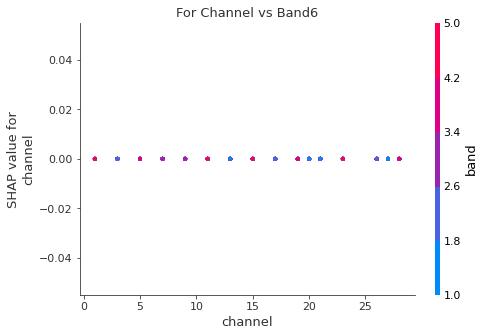

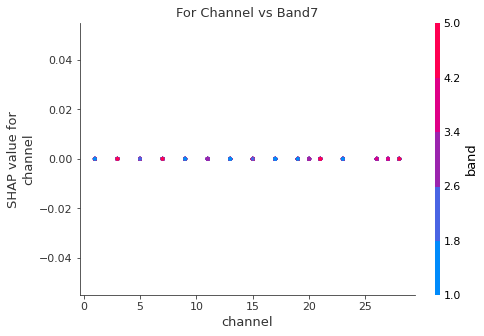

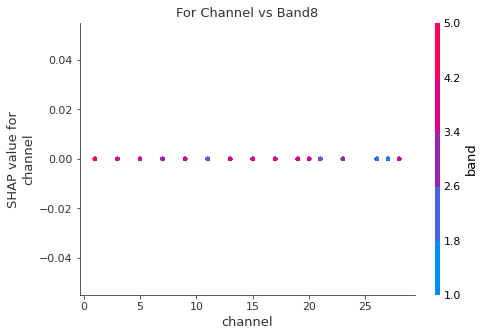

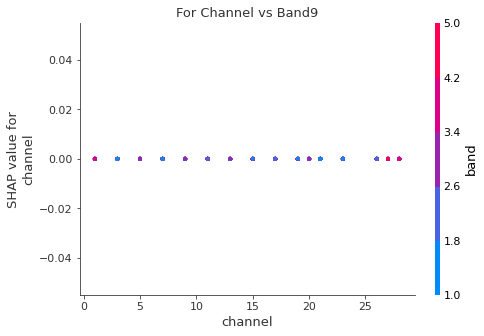

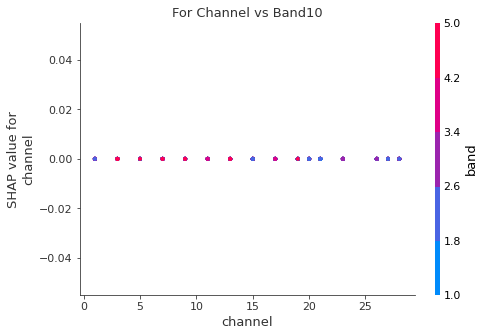

True

In [17]:
df=createdataframeleft(5) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

        Time0       Time1       Time2  ...  channel  band  Intencity
0    7.772971   30.677260   53.414131  ...      0.0   1.0        0.1
1   15.108177   25.548918   35.963586  ...      2.0   1.0        0.1
2    8.950041   12.746146   16.674944  ...      4.0   1.0        0.1
3  145.460409  169.133716  192.665320  ...      6.0   1.0        0.1
4  344.534735  392.517271  440.017286  ...      8.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       0.92      0.86      0.89        14
         2.0       0.85      0.92      0.88        12
         3.0       1.00      0.94      0.97        16
         4.0       0.79      0.73      0.76        15
         5.0       0.95      0.91      0.93        22
         6.0       0.89      0.89      0.89        18
         7.0       0.82      1.00      0.90        14
         8.0       1.00      1.00      1.00        12
         9.0       0.88      1.00      0.93        14
        10.0       

Sumamry Plot


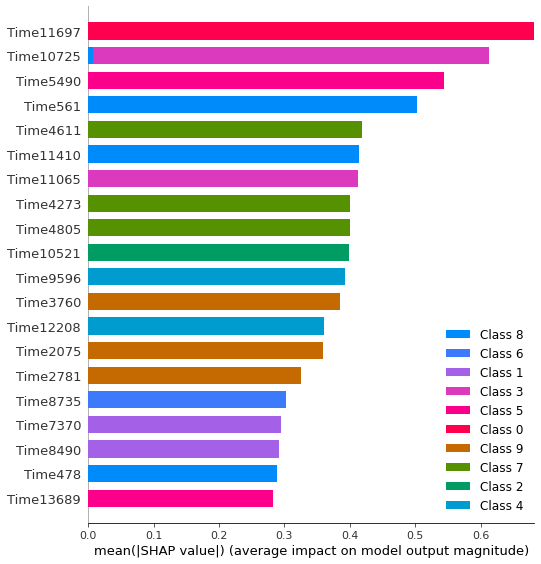

Best time series vs intencity


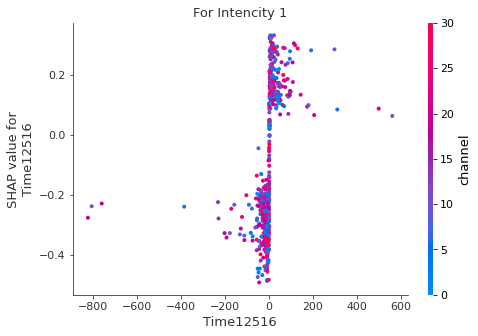

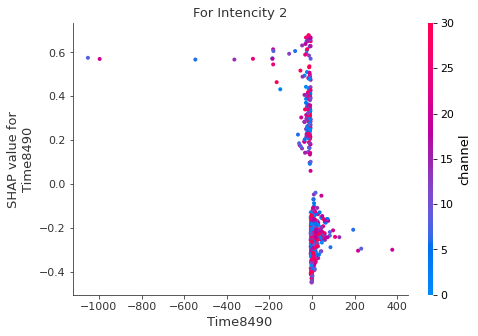

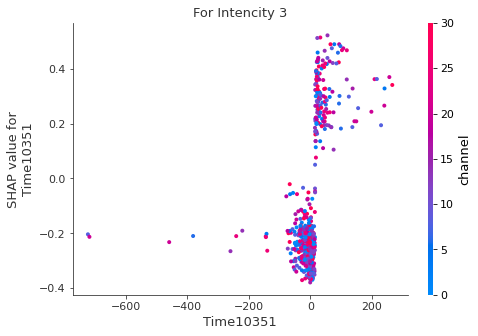

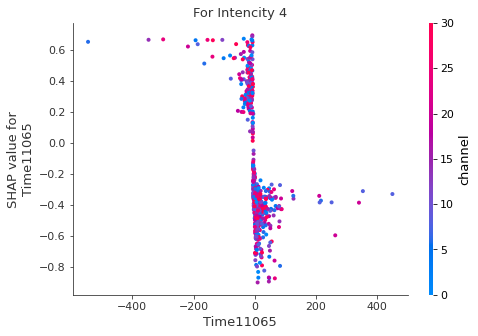

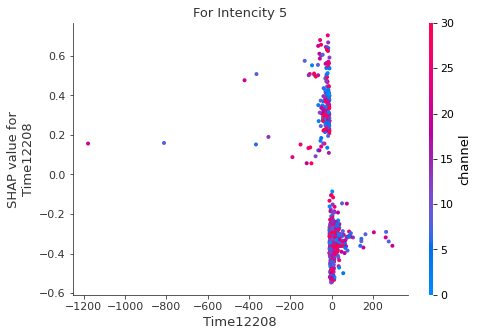

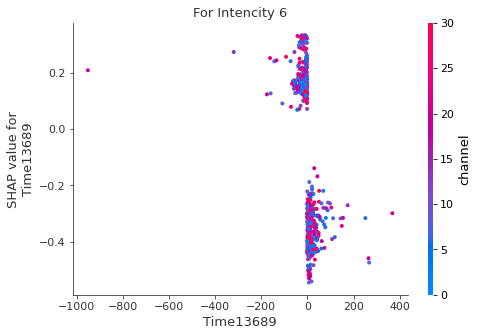

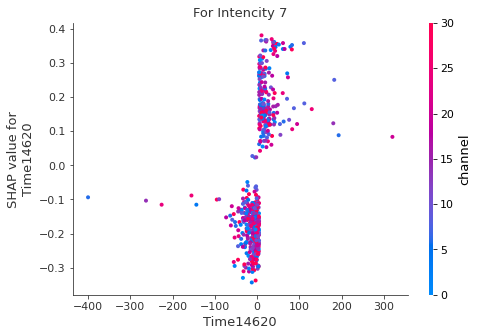

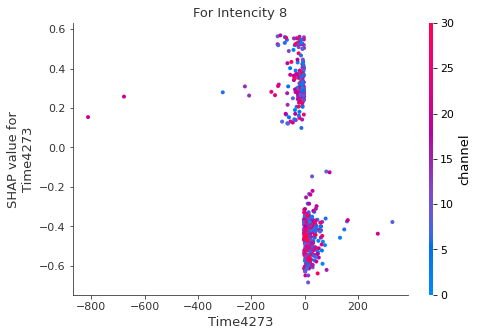

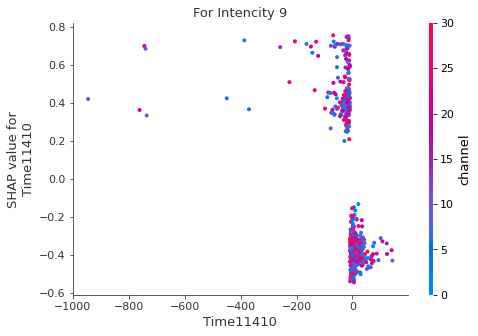

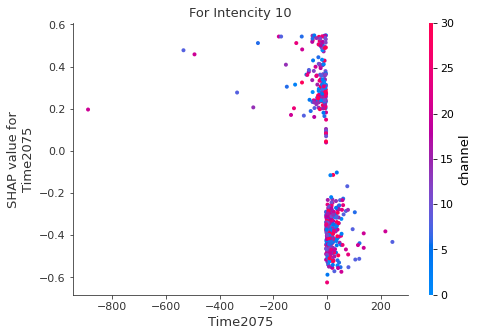

Band vs Channel


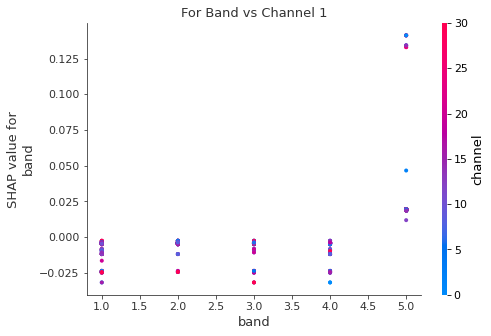

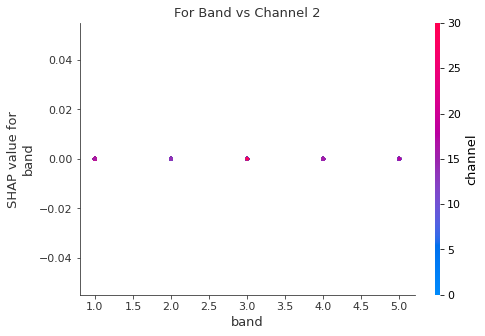

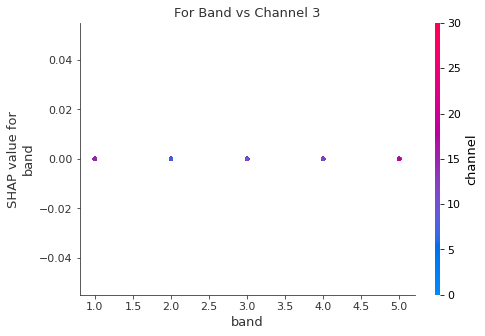

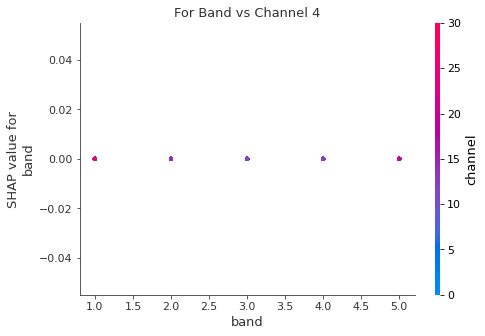

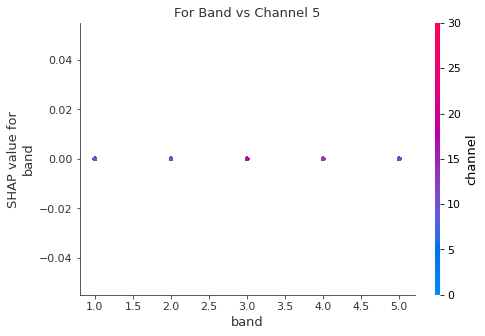

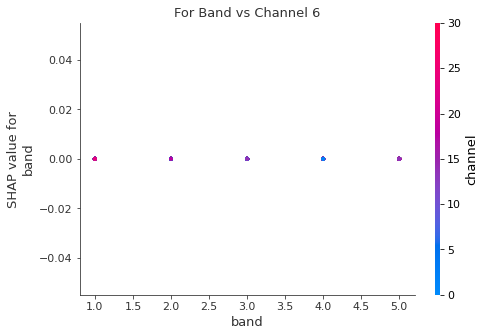

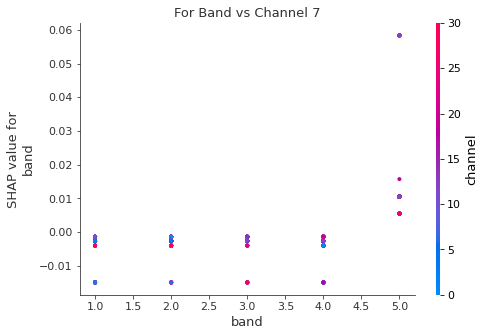

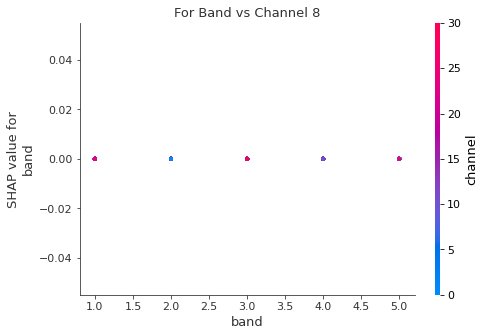

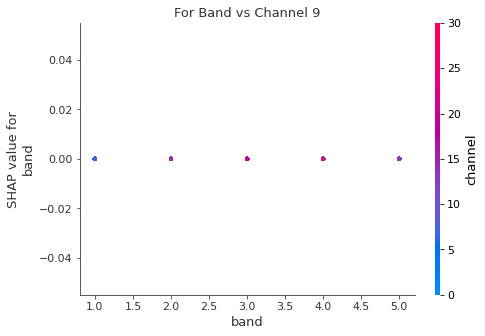

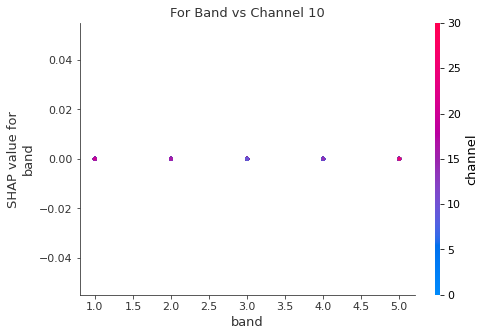

channel vs band


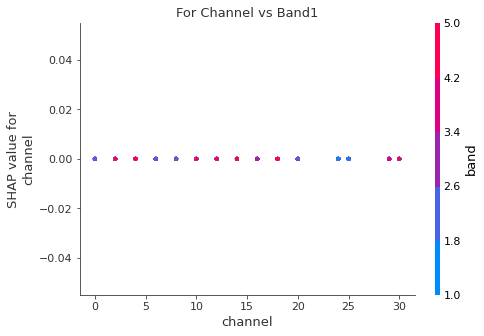

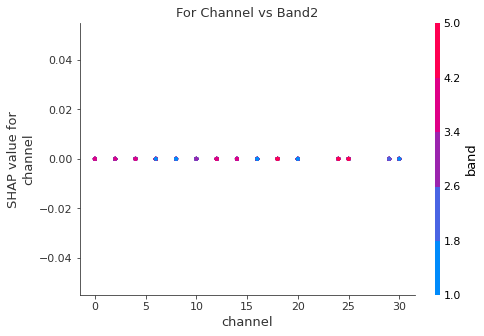

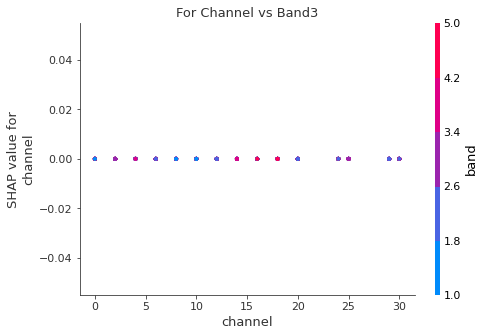

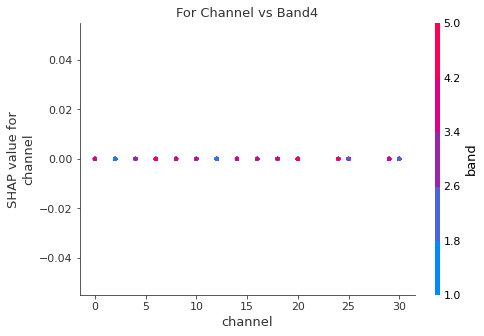

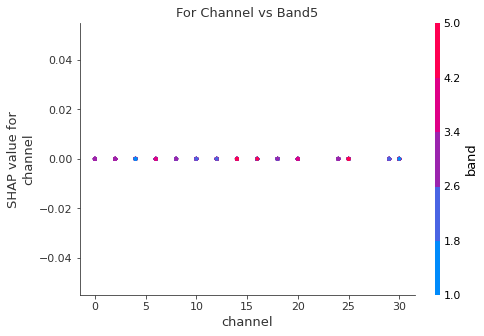

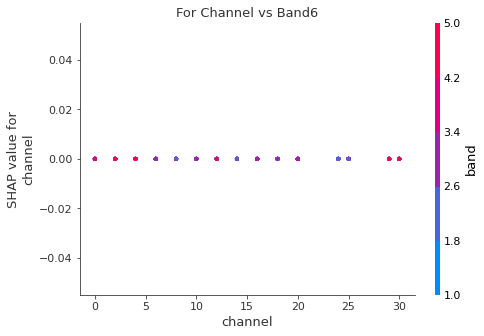

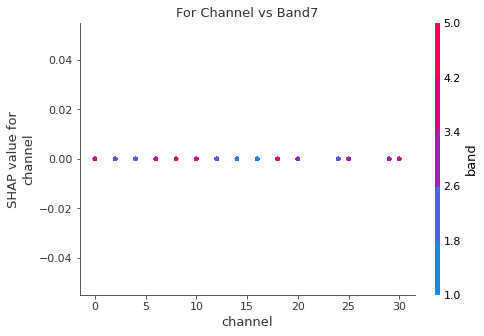

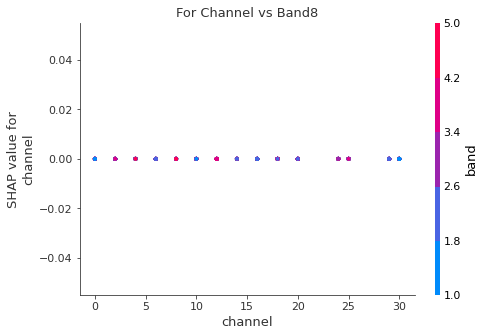

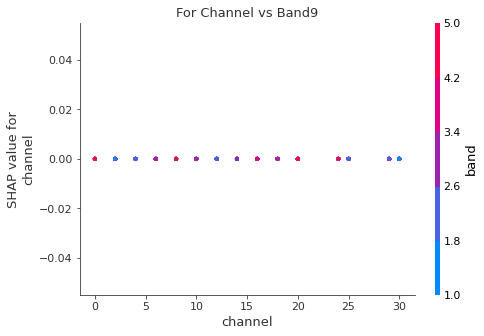

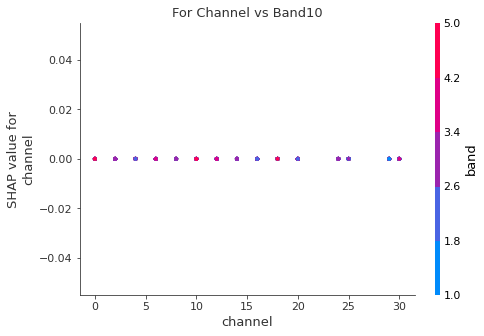

True

In [18]:
df=createdataframeright(1) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

       Time0      Time1      Time2  ...  channel  band  Intencity
0 -14.184788 -14.964226 -15.713832  ...      0.0   1.0        0.1
1   4.558751   7.102602   9.601087  ...      2.0   1.0        0.1
2  19.342232  22.430965  25.407664  ...      4.0   1.0        0.1
3  11.601809  10.658827   9.684153  ...      6.0   1.0        0.1
4  28.172896  27.338068  26.558438  ...      8.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       1.00      0.93      0.96        14
         2.0       1.00      1.00      1.00        12
         3.0       0.88      0.94      0.91        16
         4.0       0.88      0.93      0.90        15
         5.0       1.00      0.95      0.98        22
         6.0       1.00      1.00      1.00        18
         7.0       0.88      1.00      0.93        14
         8.0       1.00      0.92      0.96        12
         9.0       1.00      0.93      0.96        14
        10.0       0.92      0.92    

Sumamry Plot


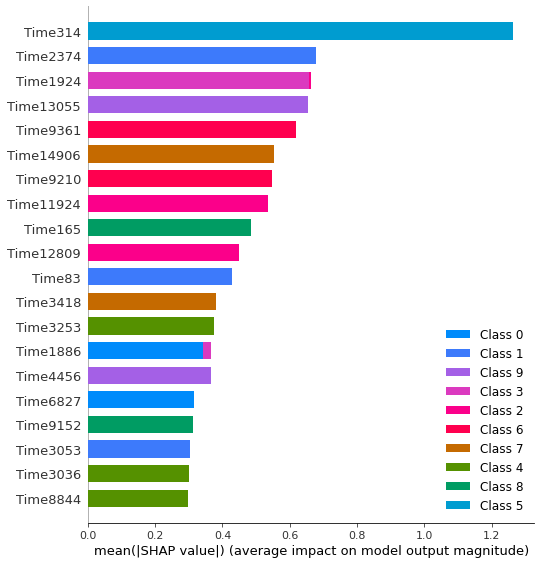

Best time series vs intencity


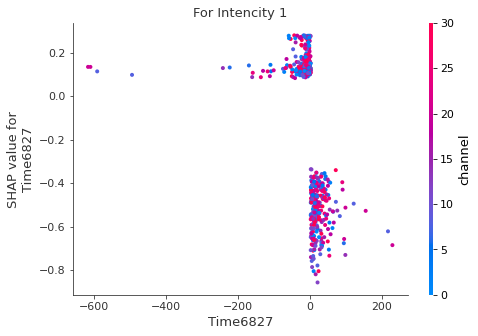

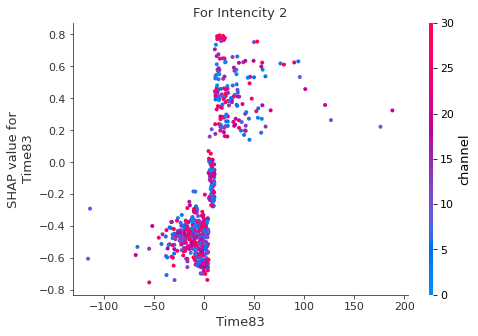

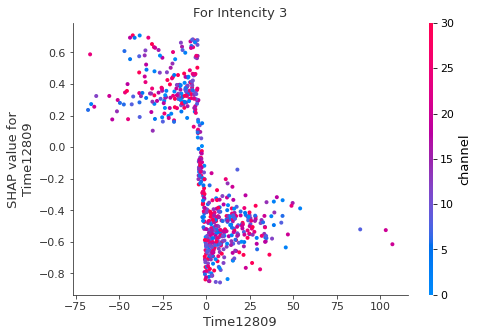

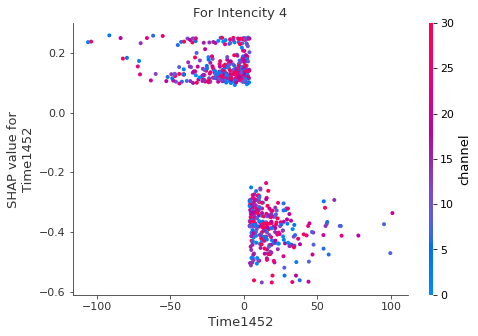

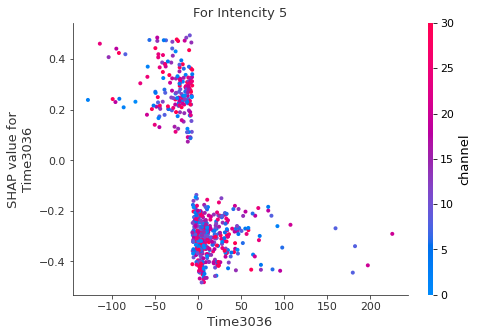

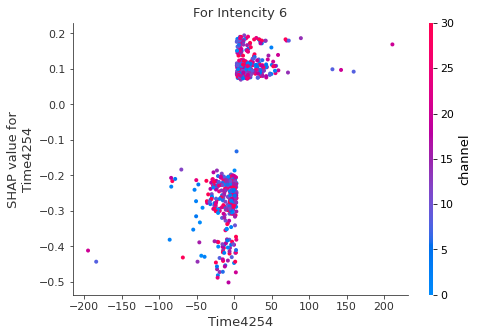

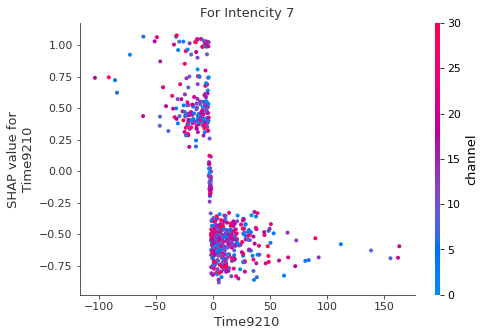

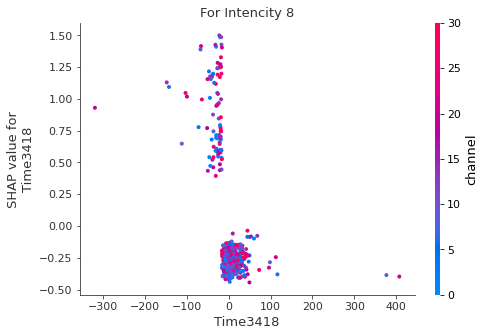

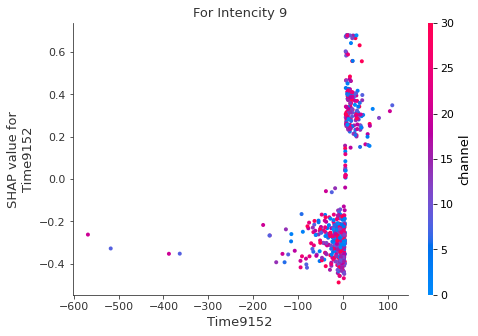

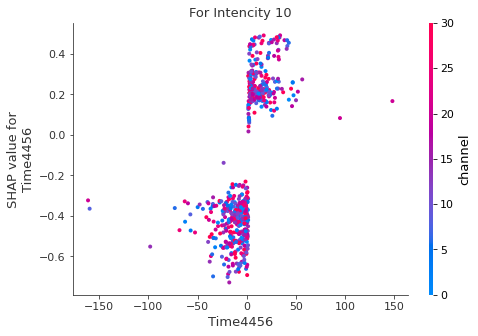

Band vs Channel


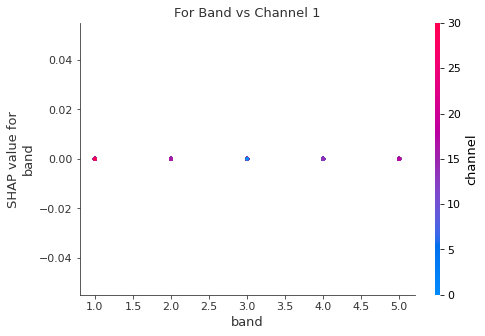

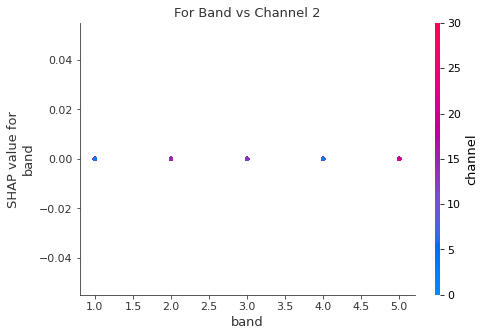

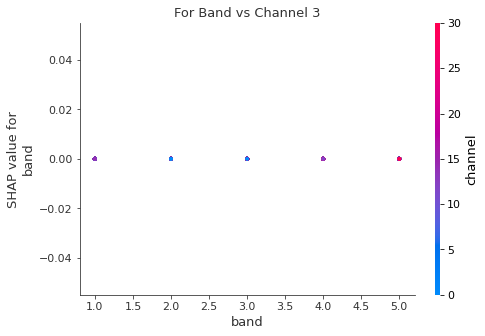

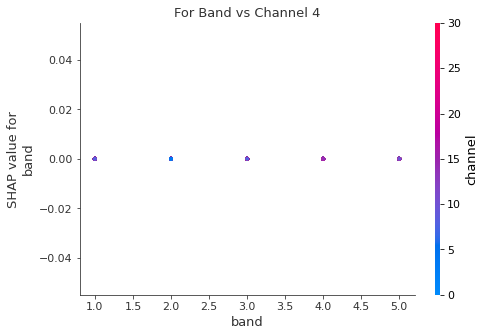

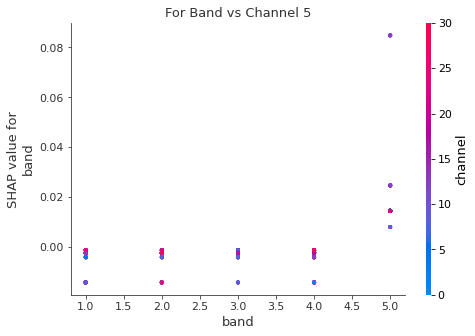

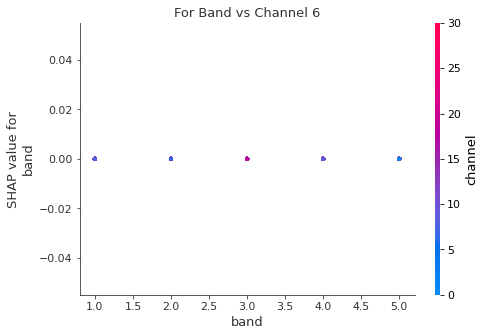

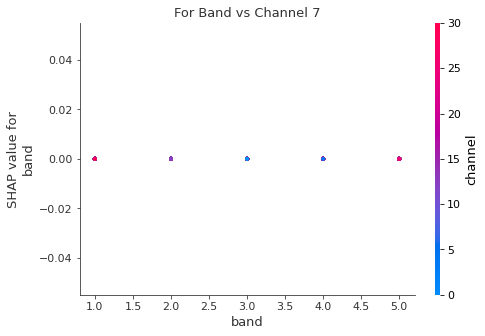

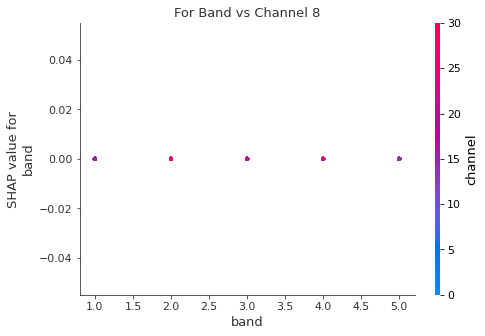

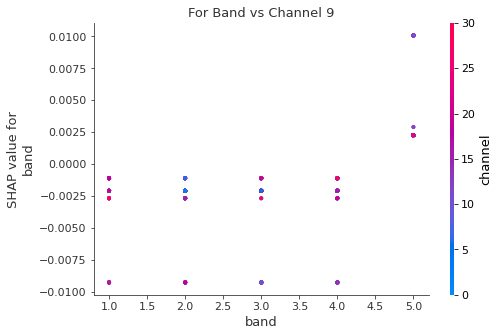

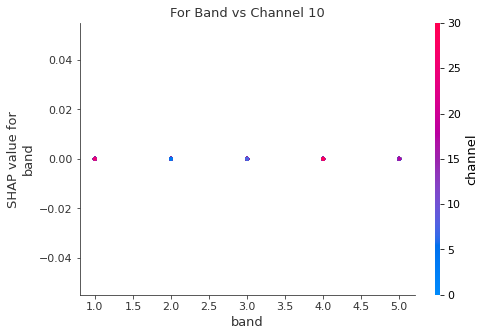

channel vs band


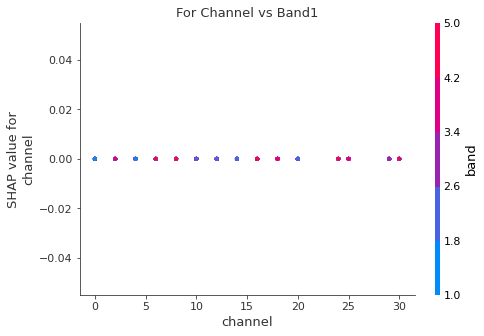

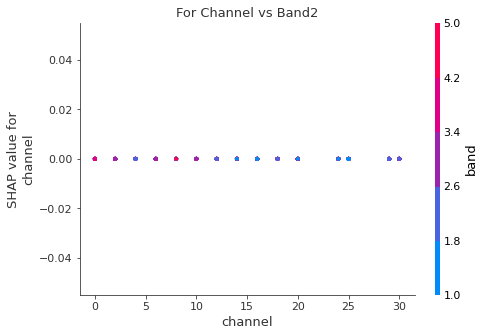

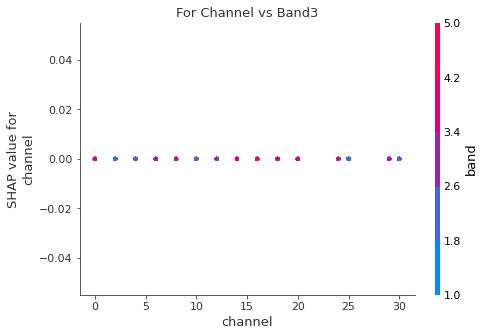

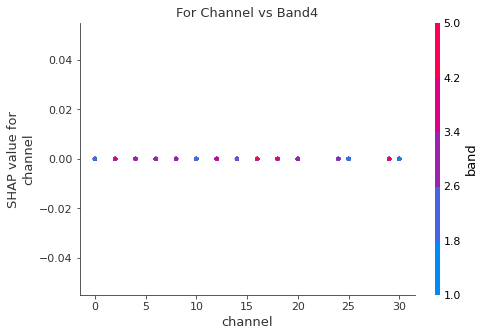

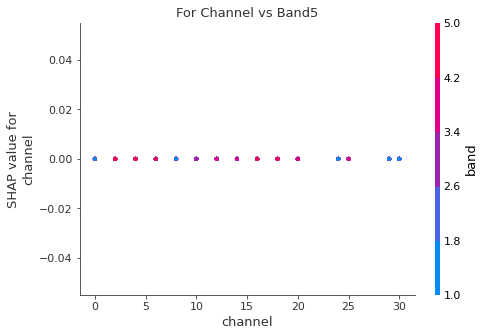

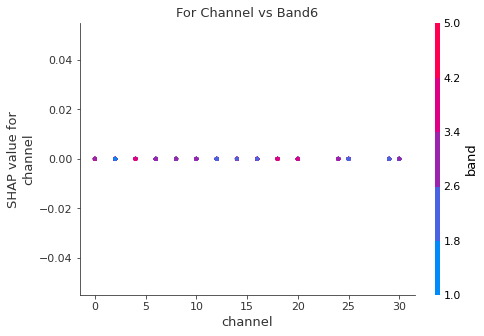

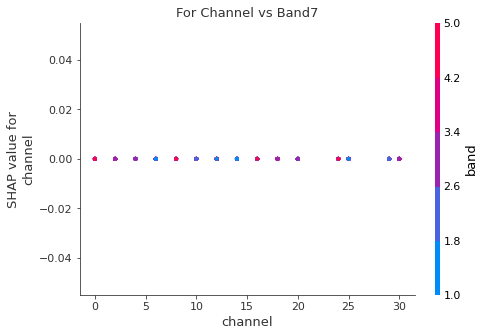

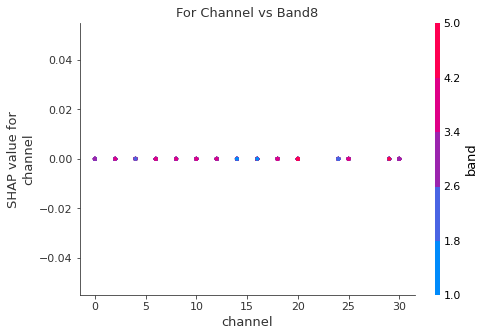

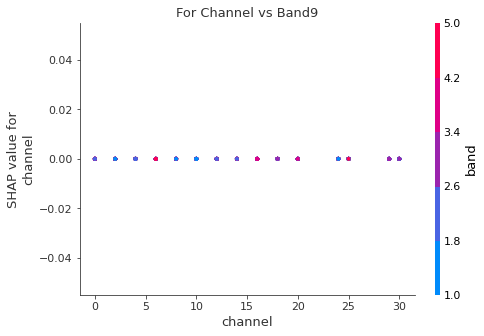

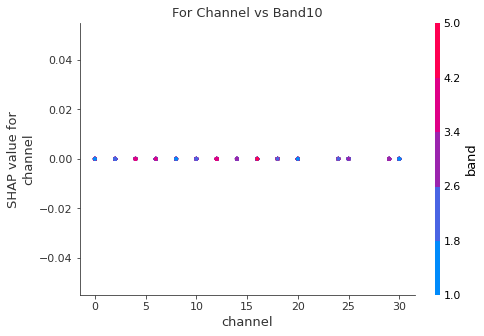

True

In [19]:
df=createdataframeright(2) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

       Time0      Time1      Time2  ...  channel  band  Intencity
0  16.330305  14.134907  11.940875  ...      0.0   1.0        0.1
1  11.403376  10.942666  10.488240  ...      2.0   1.0        0.1
2   2.890385  -1.318185  -5.508346  ...      4.0   1.0        0.1
3  -6.490300  -7.380921  -8.184646  ...      6.0   1.0        0.1
4  -8.200821  -5.480301  -2.741685  ...      8.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       0.79      0.79      0.79        14
         2.0       0.91      0.83      0.87        12
         3.0       0.94      0.94      0.94        16
         4.0       0.94      1.00      0.97        15
         5.0       1.00      0.82      0.90        22
         6.0       1.00      0.83      0.91        18
         7.0       0.76      0.93      0.84        14
         8.0       0.73      0.92      0.81        12
         9.0       0.79      0.79      0.79        14
        10.0       0.86      0.92    

Sumamry Plot


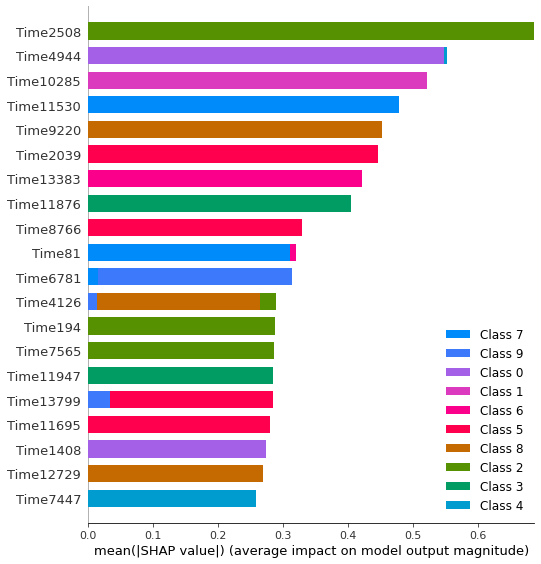

Best time series vs intencity


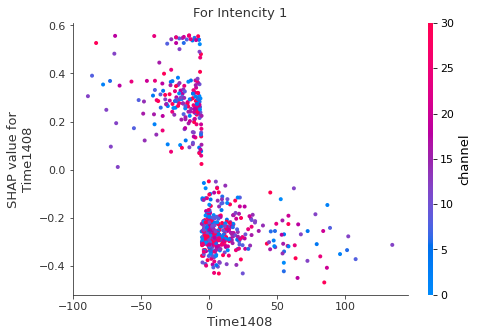

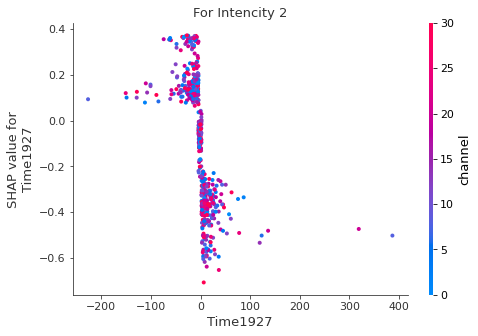

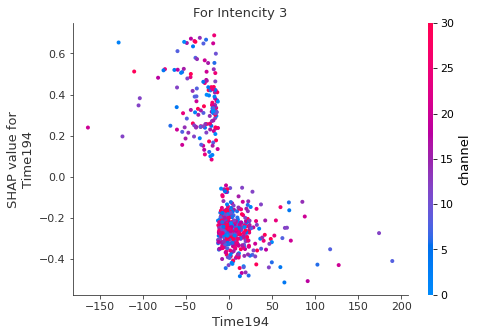

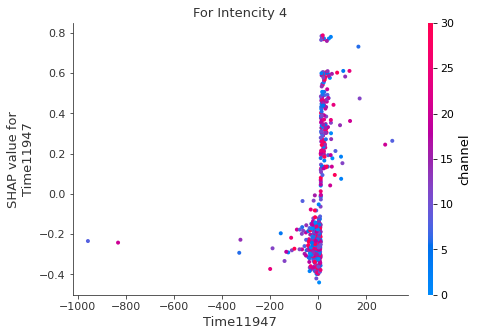

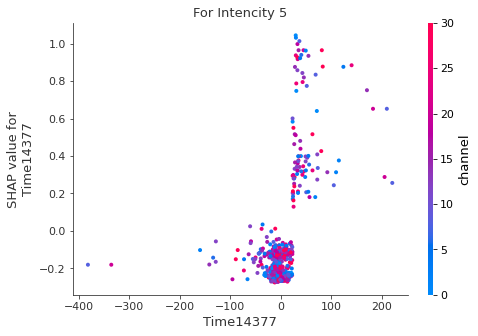

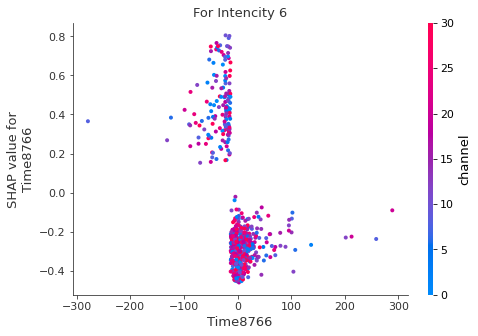

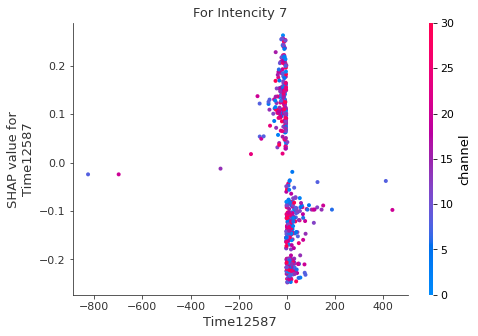

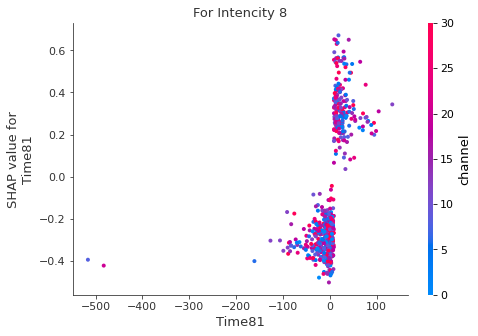

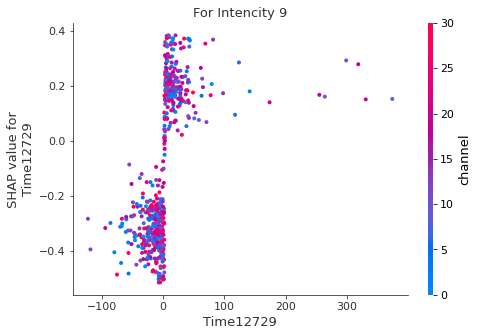

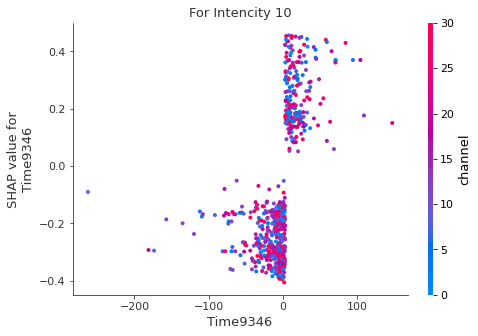

Band vs Channel


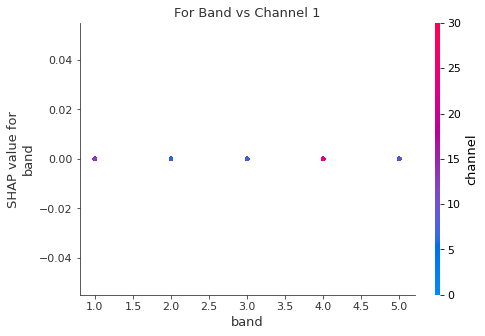

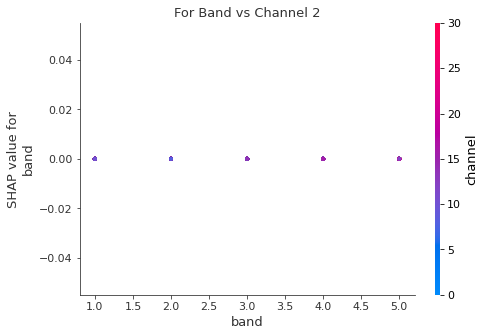

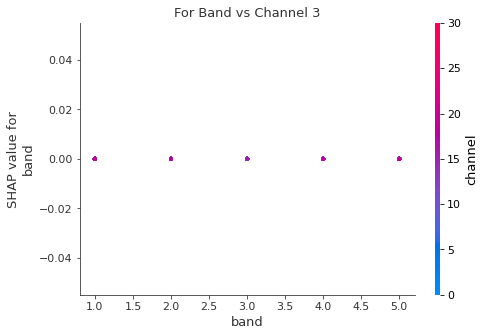

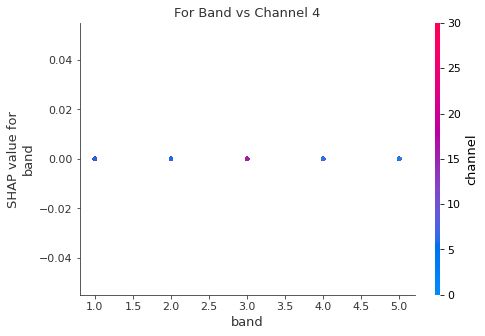

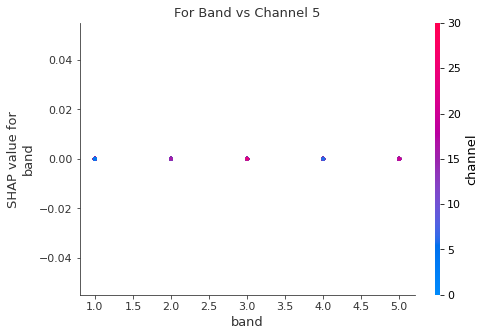

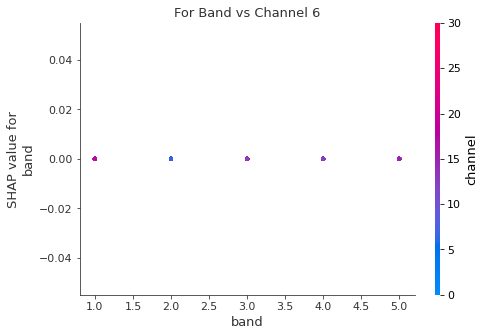

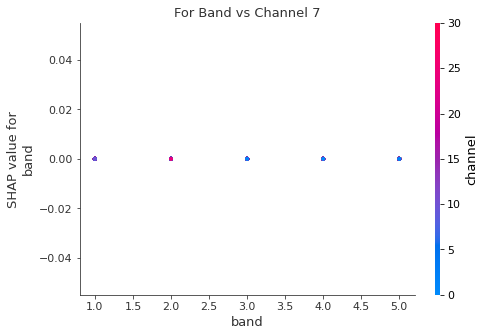

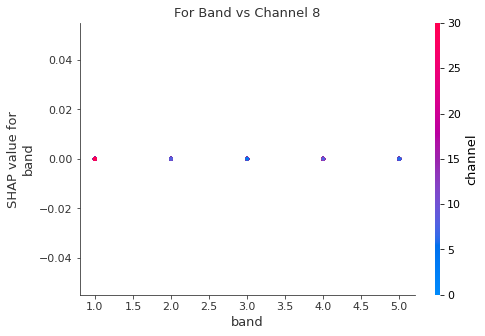

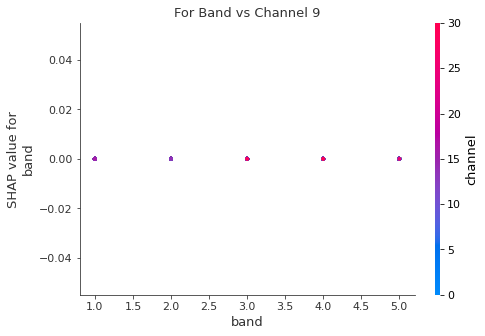

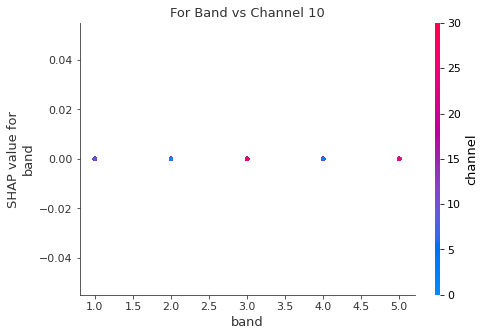

channel vs band


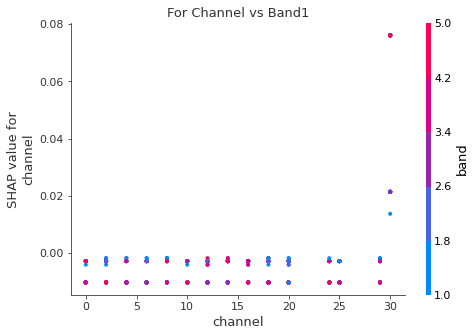

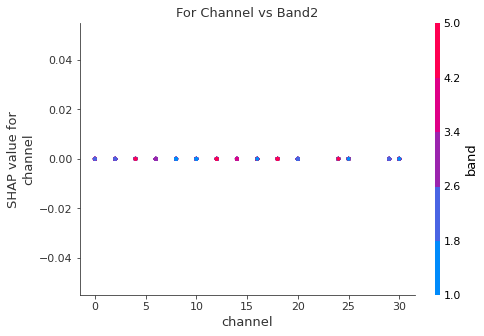

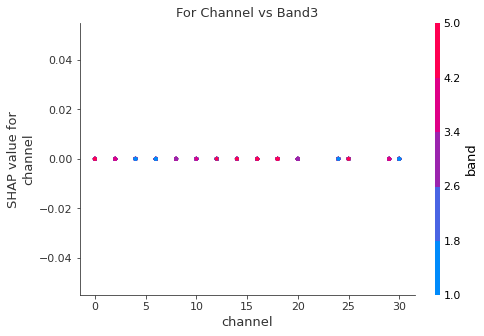

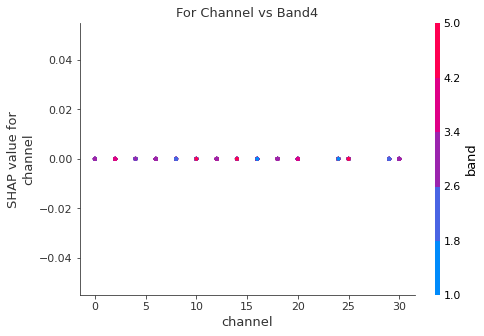

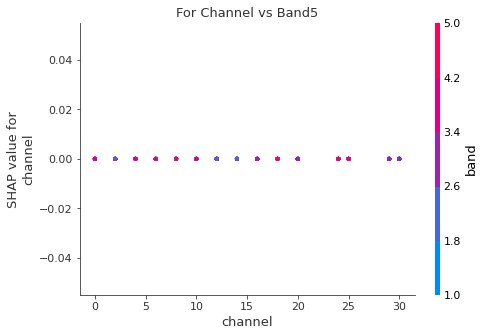

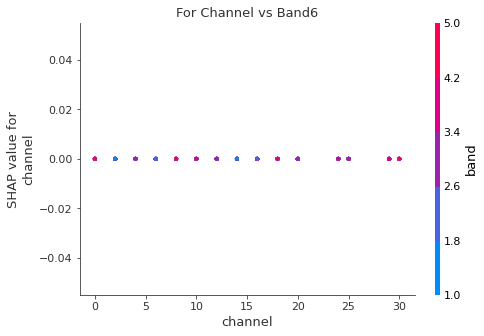

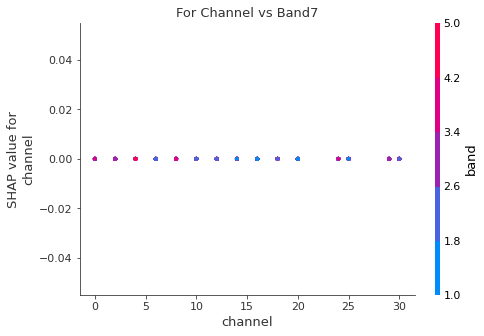

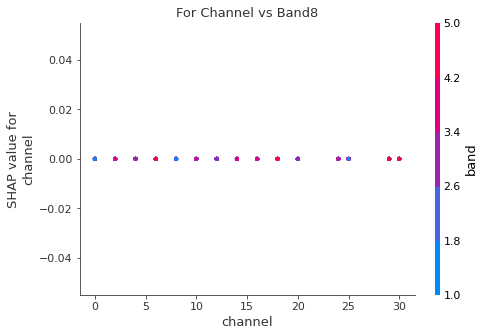

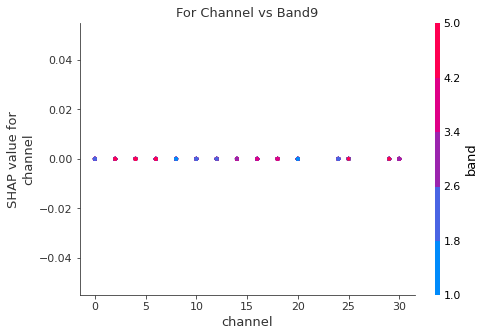

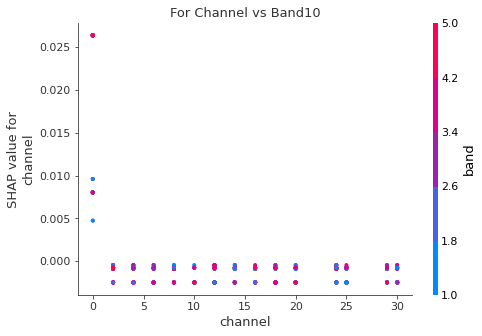

True

In [20]:
df=createdataframeright(3) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

       Time0      Time1      Time2  ...  channel  band  Intencity
0  24.565854  26.167094  27.644614  ...      0.0   1.0        0.1
1   7.503558   6.744560   5.939841  ...      2.0   1.0        0.1
2   2.250236   0.093364  -2.065258  ...      4.0   1.0        0.1
3  -1.204978   0.855730   2.936131  ...      6.0   1.0        0.1
4 -13.180113 -13.828519 -14.422374  ...      8.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       0.92      0.86      0.89        14
         2.0       1.00      0.92      0.96        12
         3.0       0.88      0.94      0.91        16
         4.0       0.92      0.80      0.86        15
         5.0       0.87      0.91      0.89        22
         6.0       1.00      0.94      0.97        18
         7.0       0.93      1.00      0.97        14
         8.0       0.85      0.92      0.88        12
         9.0       0.93      1.00      0.97        14
        10.0       0.92      0.92    

Sumamry Plot


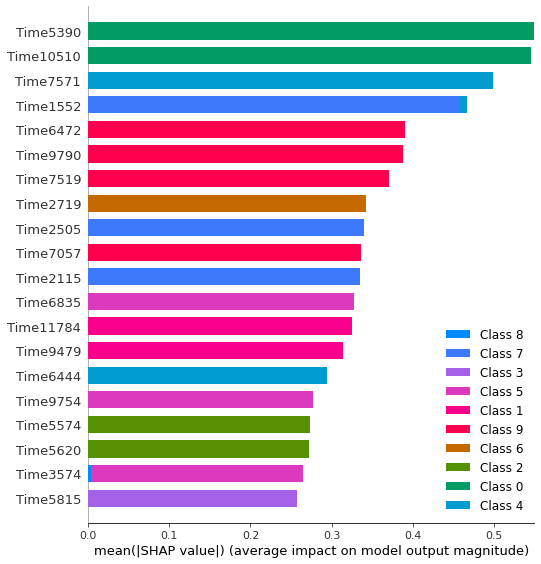

Best time series vs intencity


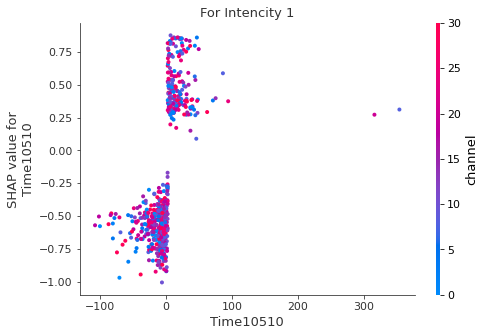

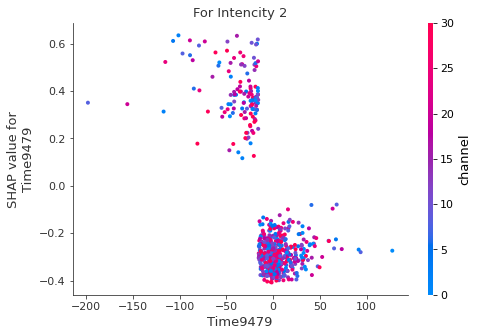

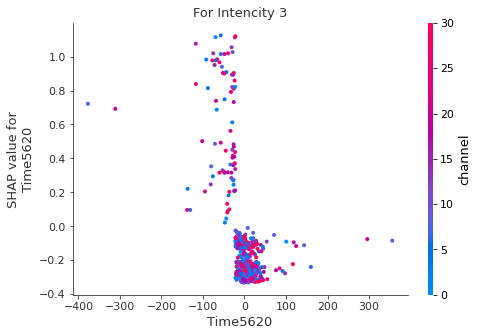

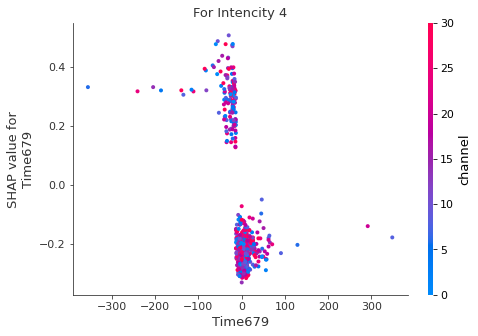

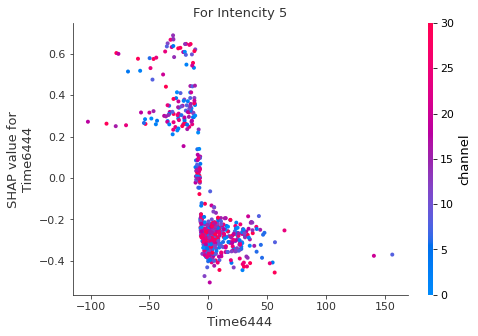

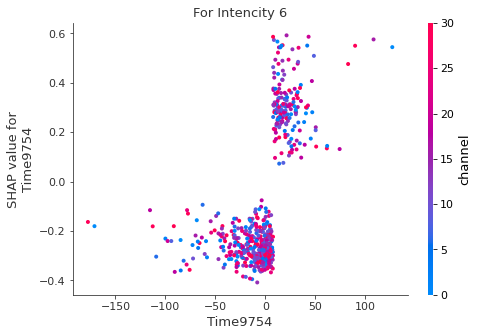

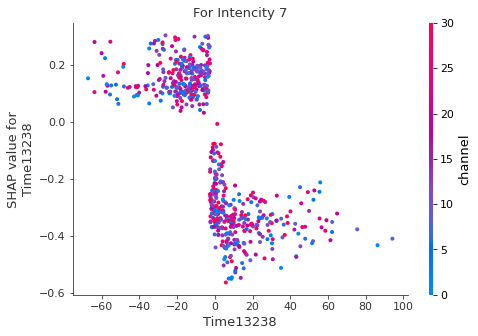

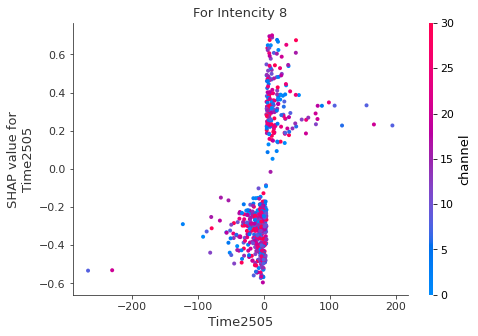

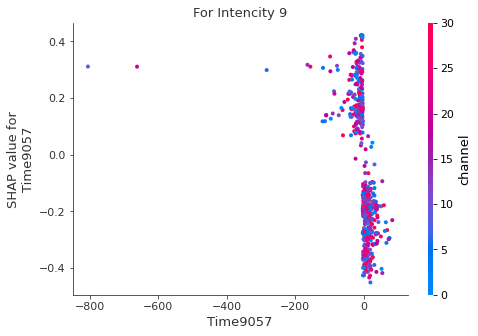

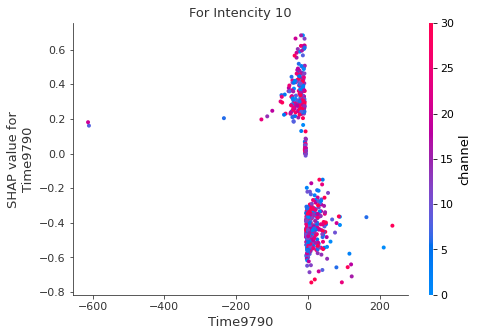

Band vs Channel


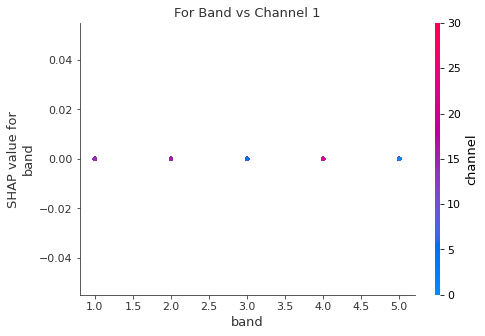

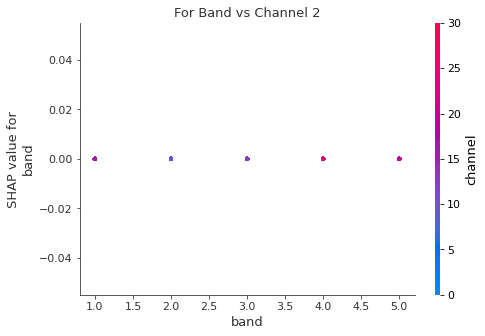

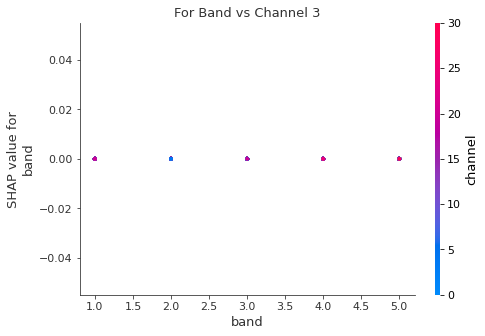

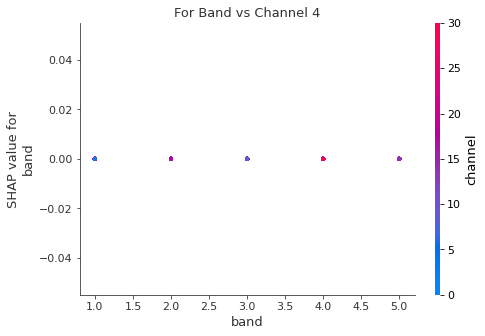

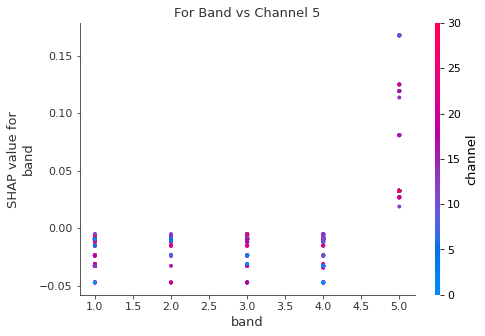

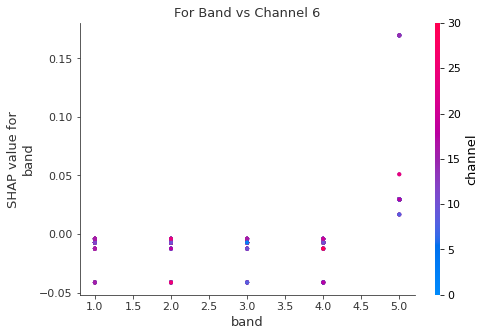

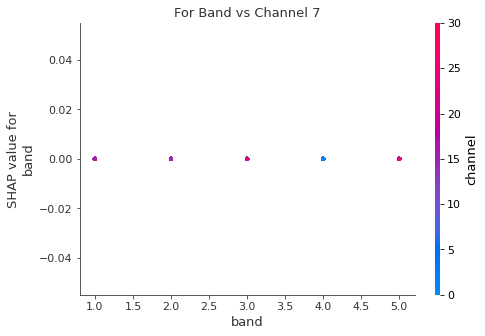

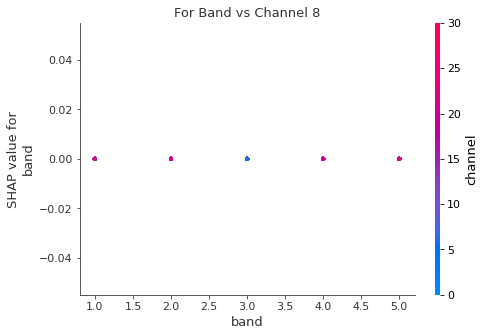

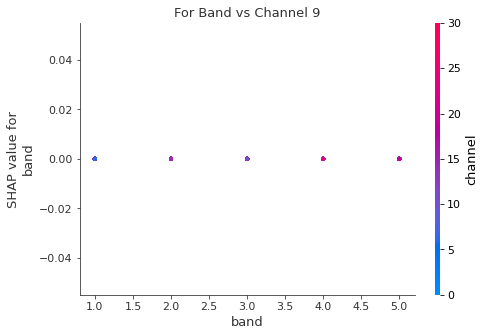

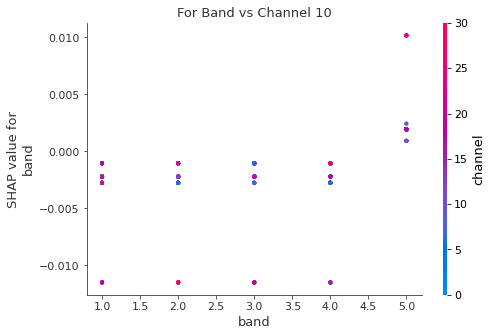

channel vs band


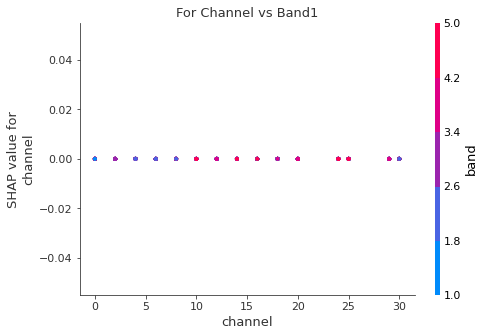

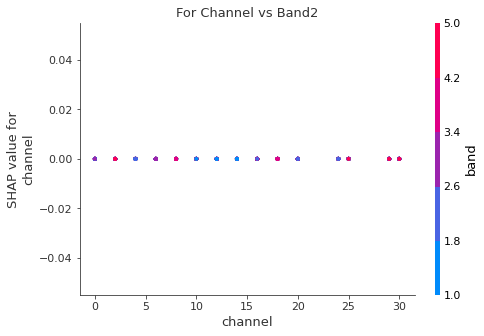

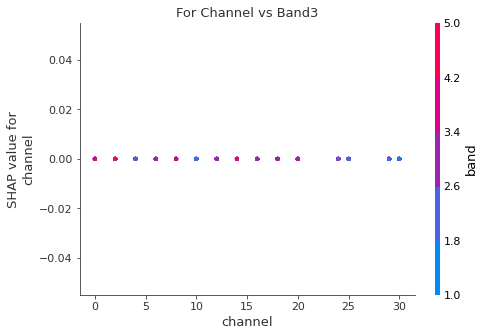

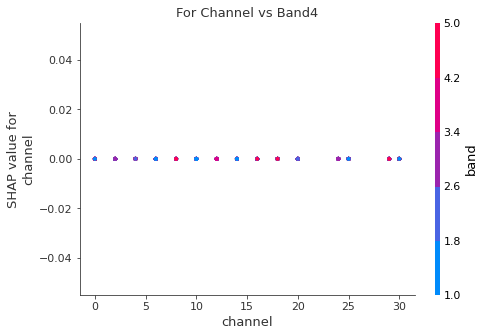

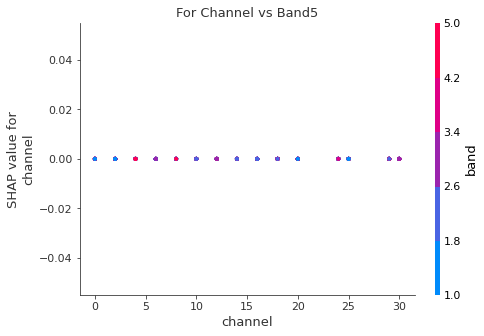

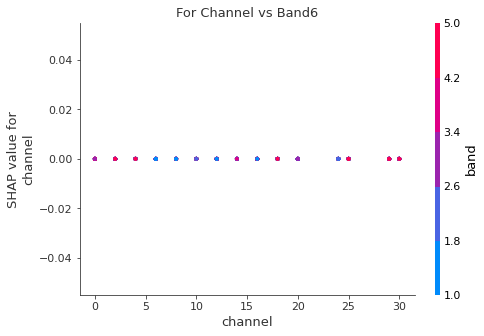

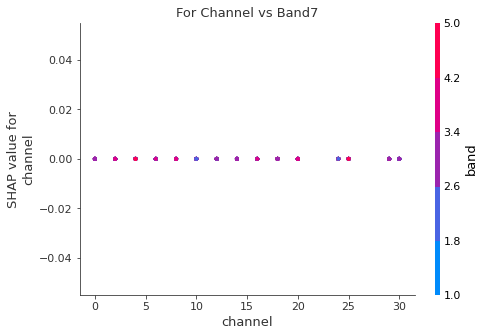

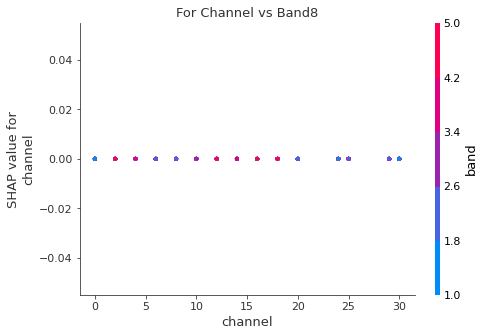

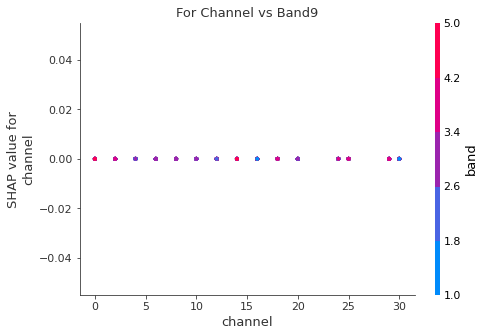

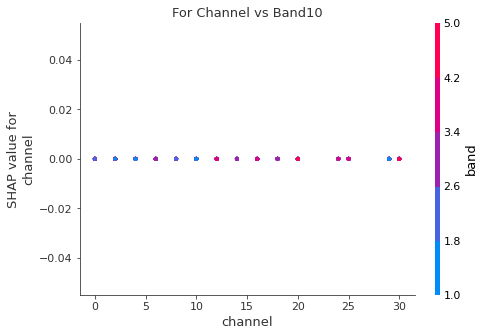

True

In [21]:
df=createdataframeright(4) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

       Time0      Time1      Time2  ...  channel  band  Intencity
0  -2.569370   0.300244   3.154248  ...      0.0   1.0        0.1
1  -3.459277  -2.760288  -2.071352  ...      2.0   1.0        0.1
2  -9.976856 -12.512365 -15.037922  ...      4.0   1.0        0.1
3 -26.557768 -34.735589 -42.855355  ...      6.0   1.0        0.1
4  -7.374093  -8.044722  -8.715551  ...      8.0   1.0        0.1

[5 rows x 15003 columns]
              precision    recall  f1-score   support

         1.0       0.93      0.93      0.93        14
         2.0       1.00      0.92      0.96        12
         3.0       1.00      1.00      1.00        16
         4.0       1.00      1.00      1.00        15
         5.0       1.00      0.91      0.95        22
         6.0       1.00      1.00      1.00        18
         7.0       0.93      1.00      0.97        14
         8.0       0.92      1.00      0.96        12
         9.0       1.00      1.00      1.00        14
        10.0       0.93      1.00    

Sumamry Plot


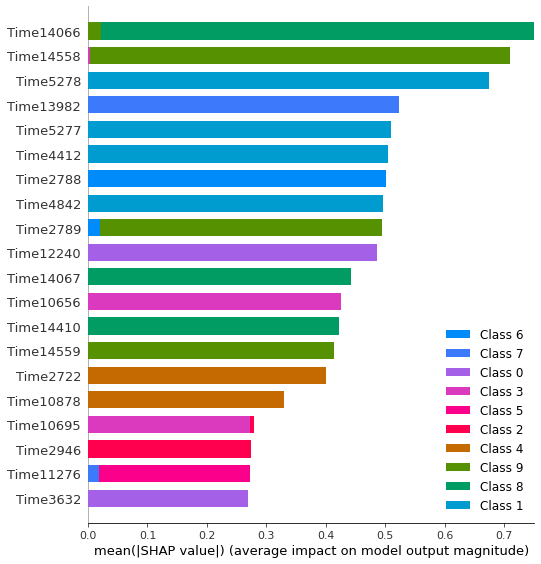

Best time series vs intencity


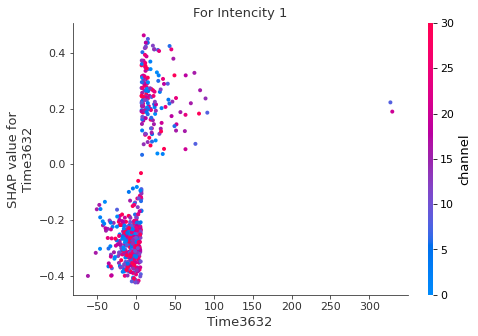

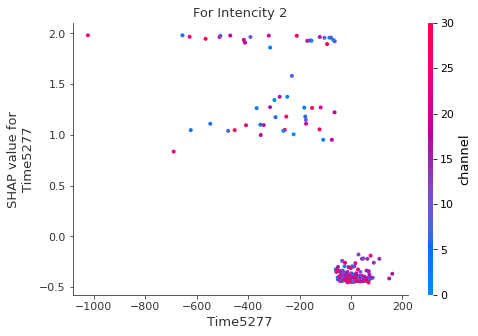

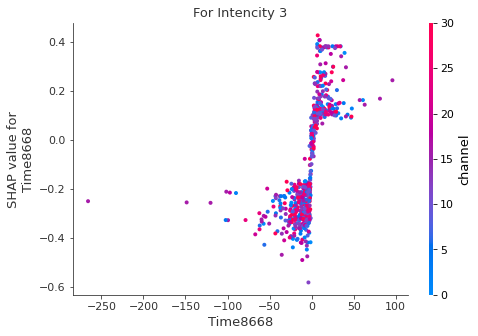

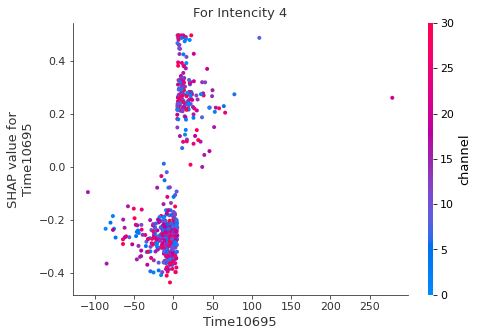

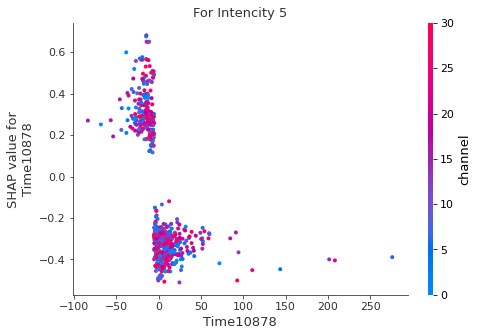

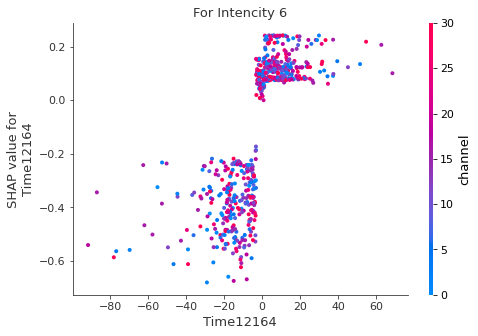

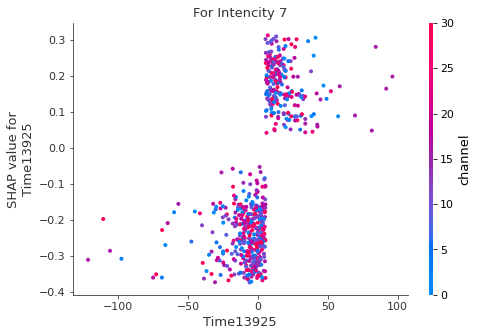

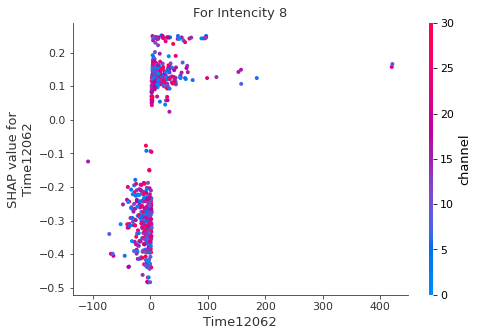

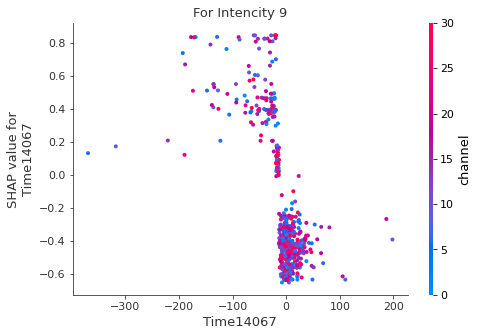

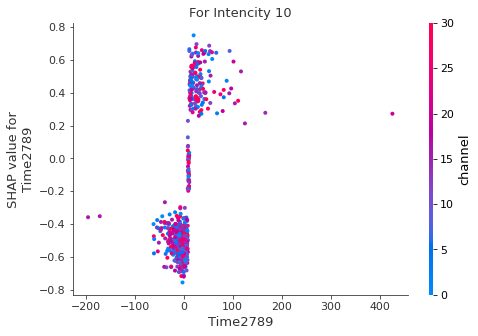

Band vs Channel


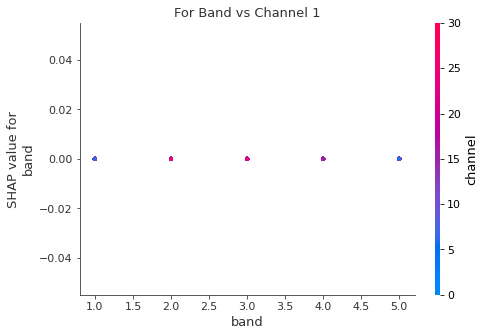

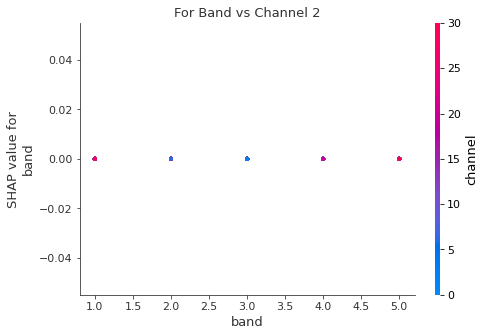

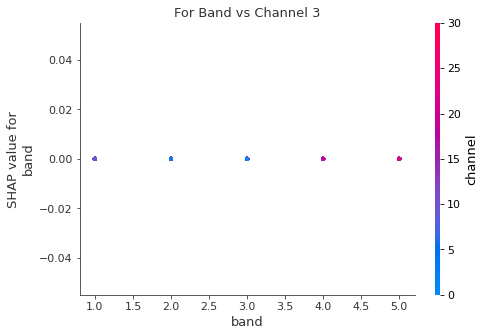

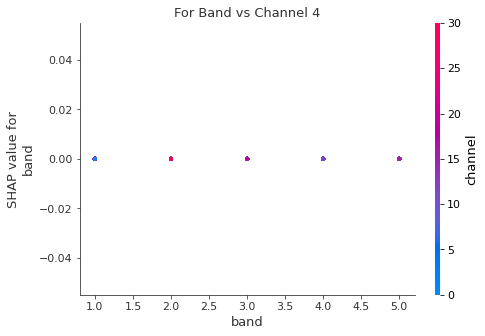

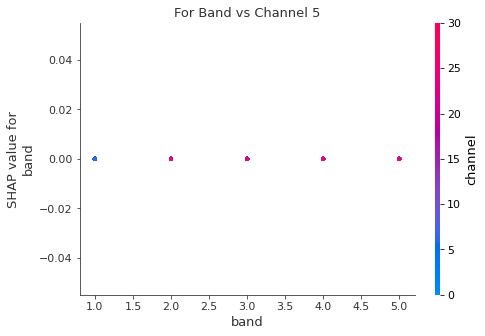

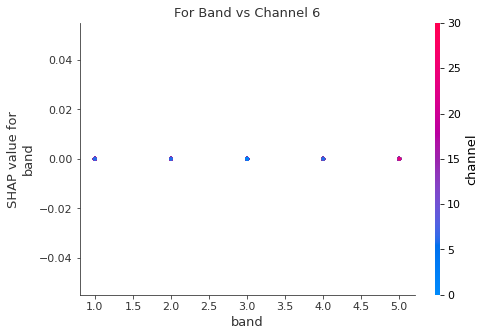

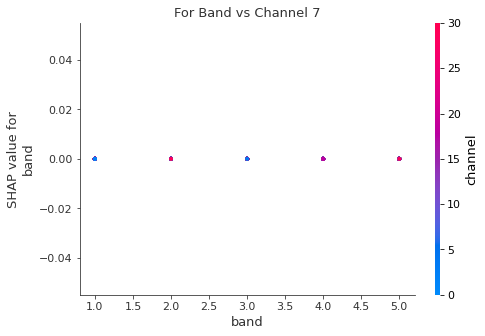

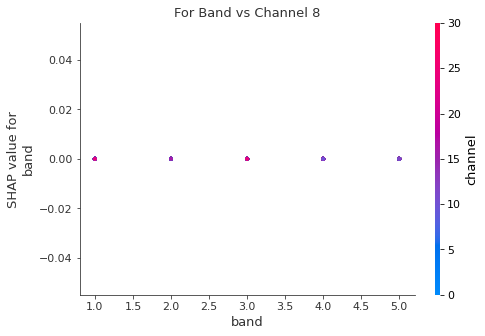

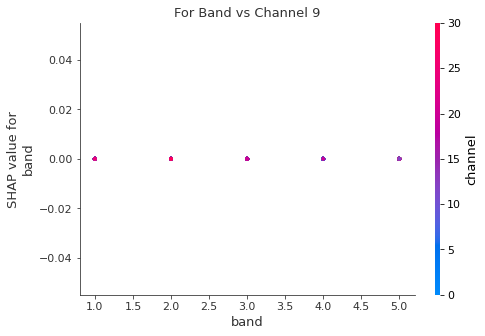

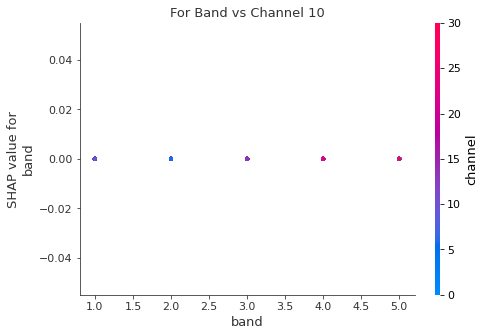

channel vs band


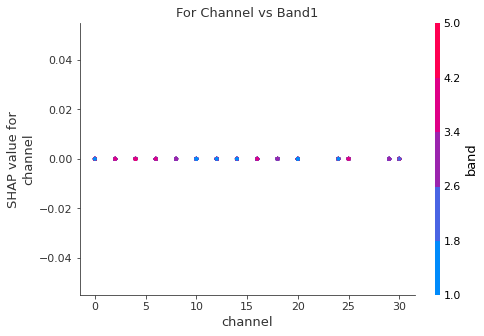

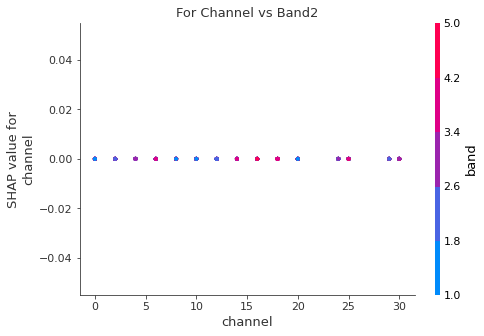

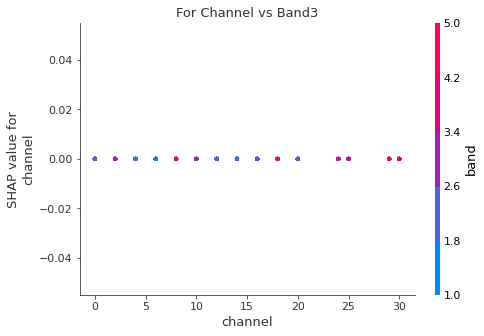

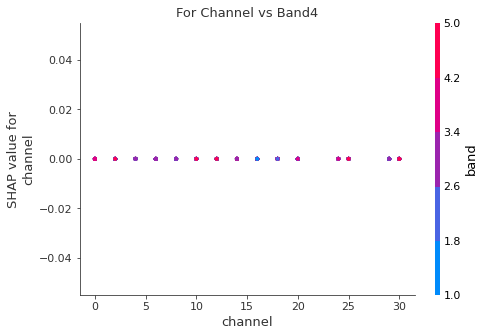

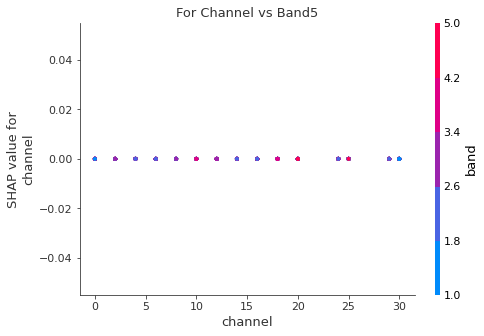

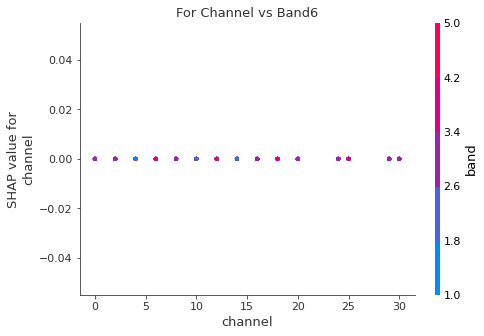

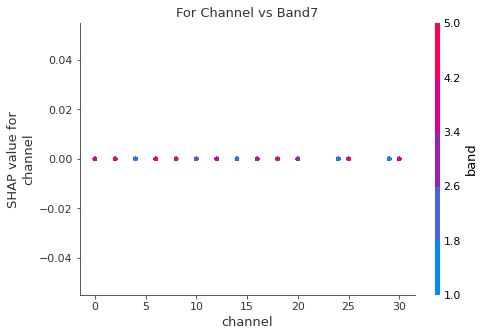

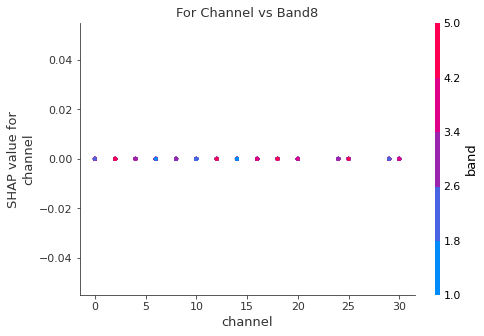

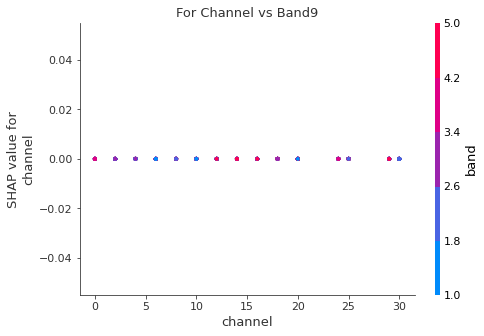

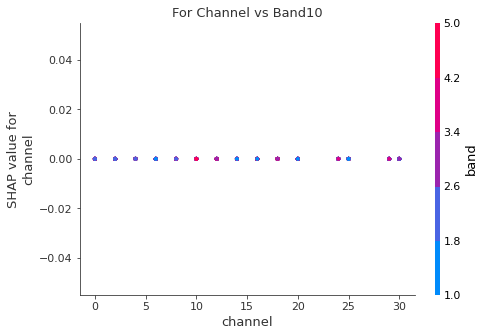

True

In [22]:
df=createdataframeright(5) 
print(df.head())
clf_report , model , X_train, X_test  = xgboostmodel(df) 
print(clf_report , model) 
shapplot(model,X_train,X_test)

In [23]:
#time series vs band is missing and change left right band 